In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)

#Since the NaN values of GHI are gone which is used in data preparation, simulate these in solar activity instead
df['solar_activity'].loc[df['Year'] > 2020] = np.nan
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['GHI'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['specific_humidity'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)     

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       1

C:\Users\User\AppData\Local\Temp\ipykernel_981048\1979929448.py:383: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['solar_activity'].loc[df['Year'] > 2020] = np.nan


Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
(84, 1, 1, 1981)
(11, 1, 1, 1981)
(10, 1, 1, 1981)
(84, 1, 1981)
(11, 1, 1981)
(10, 1, 1981)
(84, 1981)
(11, 1981)
(10, 1981)
[[0.42725031 0.69695044 0.32924264 ... 0.29408138 0.24969174 0.48890259]
 [0.45745993 0.51683609 0.42215989 ... 0.32182491 0.21454994 0.60912454]
 [0.43218249 0.62674714 0.3411641  ... 0.35080148 0.18187423 0.64981504]
 ...
 [0.47102343 0.46473952 0.46949509 ... 0.3027127  0.42108508 0.52034525]
 [0.43464858 0.51620076 0.3997195  ... 0.34648582 0.19358816 0.61713933]
 [0.44389642 0.52414231 0.42356241 ... 0.45992602 0.19173859 0.54623921]]
Fold 2:
(84, 1, 1, 1981)
(11, 1, 1, 1981)
(10, 1, 1, 1981)
(84, 1, 1981)
(11, 1, 1981)
(10, 1, 1981)
(84, 1981)
(11, 1981)
(10, 1981)
[[0.43464858 0.62313675 0.34639831 ... 0.3674476  0.17509248 0.67324291]
 [0.42725031 0.71548931 0.32450565 ... 0.29408138 0.24969174 0.48890259]
 [0.45745993 0.53175632 0.4180791  ... 0.32182491 0.21454994 0.60912454]
 ...
 [0.47102343 0.47861309 0.465

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-26 09:15:43,196] A new study created in memory with name: no-name-2f662d3e-97dd-4323-9fcd-c0631f094dce
[I 2025-05-26 09:18:17,814] Trial 0 finished with value: 0.06836524754762649 and parameters: {'lr': 0.05054918649583655, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3223993668554854}. Best is trial 0 with value: 0.06836524754762649.


Cross Validation Accuracies:
[0.06275910884141922, 0.06415022909641266, 0.07502637803554535, 0.08033518493175507, 0.05955533683300018]
Mean Cross Validation Accuracy:
0.06836524754762649
Standard Deviation of Cross Validation Accuracy:
0.007930444614194551


[I 2025-05-26 09:21:16,959] Trial 1 finished with value: 0.10645328015089035 and parameters: {'lr': 0.0025179390220546167, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1560492296881719}. Best is trial 0 with value: 0.06836524754762649.


Cross Validation Accuracies:
[0.11563125252723694, 0.09998960793018341, 0.07400060445070267, 0.12191880494356155, 0.12072613090276718]
Mean Cross Validation Accuracy:
0.10645328015089035
Standard Deviation of Cross Validation Accuracy:
0.018011591386201002


[I 2025-05-26 09:24:22,141] Trial 2 finished with value: 0.06934637799859047 and parameters: {'lr': 0.0014571902611974245, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.20282842281478797}. Best is trial 0 with value: 0.06836524754762649.


Cross Validation Accuracies:
[0.06329008936882019, 0.07766225188970566, 0.07600416243076324, 0.07717663794755936, 0.0525987483561039]
Mean Cross Validation Accuracy:
0.06934637799859047
Standard Deviation of Cross Validation Accuracy:
0.00991921925955485


[I 2025-05-26 09:27:01,377] Trial 3 finished with value: 0.06940734684467316 and parameters: {'lr': 0.0010217215717771592, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.15771684644389505}. Best is trial 0 with value: 0.06836524754762649.


Cross Validation Accuracies:
[0.06047169119119644, 0.07362858206033707, 0.07914253324270248, 0.07988234609365463, 0.05391158163547516]
Mean Cross Validation Accuracy:
0.06940734684467316
Standard Deviation of Cross Validation Accuracy:
0.010414249580191558


[I 2025-05-26 09:29:37,988] Trial 4 finished with value: 0.06867461800575256 and parameters: {'lr': 0.017407455355851368, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.12281723653687192}. Best is trial 0 with value: 0.06836524754762649.


Cross Validation Accuracies:
[0.06696993857622147, 0.062393032014369965, 0.07447665929794312, 0.0773102194070816, 0.06222324073314667]
Mean Cross Validation Accuracy:
0.06867461800575256
Standard Deviation of Cross Validation Accuracy:
0.00620035189254637


[I 2025-05-26 09:31:40,589] Trial 5 finished with value: 0.07455055043101311 and parameters: {'lr': 0.004853680024134384, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3866050761502777}. Best is trial 0 with value: 0.06836524754762649.


Cross Validation Accuracies:
[0.060312166810035706, 0.061918821185827255, 0.07967332750558853, 0.10886996239423752, 0.061978474259376526]
Mean Cross Validation Accuracy:
0.07455055043101311
Standard Deviation of Cross Validation Accuracy:
0.018571021154392884


[I 2025-05-26 09:34:25,237] Trial 6 finished with value: 0.09591411501169204 and parameters: {'lr': 0.06764646441777483, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2730612224521256}. Best is trial 0 with value: 0.06836524754762649.


Cross Validation Accuracies:
[0.09930001944303513, 0.09570657461881638, 0.10972975939512253, 0.09995163232088089, 0.07488258928060532]
Mean Cross Validation Accuracy:
0.09591411501169204
Standard Deviation of Cross Validation Accuracy:
0.011497878692712326


[I 2025-05-26 09:38:27,037] Trial 7 finished with value: 0.06522819623351098 and parameters: {'lr': 0.002209885036135418, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.3361496725164905}. Best is trial 7 with value: 0.06522819623351098.


Cross Validation Accuracies:
[0.06081600487232208, 0.056258425116539, 0.07305940985679626, 0.07854379713535309, 0.05746334418654442]
Mean Cross Validation Accuracy:
0.06522819623351098
Standard Deviation of Cross Validation Accuracy:
0.008931408489152906


[I 2025-05-26 09:41:16,383] Trial 8 finished with value: 0.16647127866744996 and parameters: {'lr': 0.31240206100965673, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10579059233833293}. Best is trial 7 with value: 0.06522819623351098.


Cross Validation Accuracies:
[0.14834165573120117, 0.16531208157539368, 0.1697654277086258, 0.18054771423339844, 0.16838951408863068]
Mean Cross Validation Accuracy:
0.16647127866744996
Standard Deviation of Cross Validation Accuracy:
0.010418292076800699


[I 2025-05-26 09:43:21,689] Trial 9 finished with value: 0.17106142193078994 and parameters: {'lr': 0.013763186780147017, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.28068529147333865}. Best is trial 7 with value: 0.06522819623351098.


Cross Validation Accuracies:
[0.30426299571990967, 0.07846106588840485, 0.14194469153881073, 0.09616030007600784, 0.23447805643081665]
Mean Cross Validation Accuracy:
0.17106142193078994
Standard Deviation of Cross Validation Accuracy:
0.0857870815148865


[I 2025-05-26 09:46:18,246] Trial 10 finished with value: 0.0632791742682457 and parameters: {'lr': 0.6442669998294359, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4936357181175587}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.048224076628685, 0.05833174288272858, 0.07603457570075989, 0.0766766145825386, 0.05712886154651642]
Mean Cross Validation Accuracy:
0.0632791742682457
Standard Deviation of Cross Validation Accuracy:
0.011235221951575296


[I 2025-05-26 09:49:00,341] Trial 11 finished with value: 1.0955475263297558 and parameters: {'lr': 0.9013696563961068, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.47328172273379465}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[5.205528736114502, 0.060643598437309265, 0.07646465301513672, 0.07986364513635635, 0.055236998945474625]
Mean Cross Validation Accuracy:
1.0955475263297558
Standard Deviation of Cross Validation Accuracy:
2.055011500081531


[I 2025-05-26 09:51:43,912] Trial 12 finished with value: 0.07610071897506714 and parameters: {'lr': 0.1660864388099996, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.49170374166541503}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.06885991245508194, 0.06915998458862305, 0.08832532912492752, 0.081263966858387, 0.07289440184831619]
Mean Cross Validation Accuracy:
0.07610071897506714
Standard Deviation of Cross Validation Accuracy:
0.007576064472019763


[I 2025-05-26 09:55:20,024] Trial 13 finished with value: 0.07119961827993393 and parameters: {'lr': 0.006571344933609431, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.39582048491289185}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.0682198777794838, 0.0650278851389885, 0.07147450745105743, 0.08587885648012161, 0.06539696455001831]
Mean Cross Validation Accuracy:
0.07119961827993393
Standard Deviation of Cross Validation Accuracy:
0.00769669451019879


[I 2025-05-26 09:58:14,940] Trial 14 finished with value: 0.06821883693337441 and parameters: {'lr': 0.7204450308576748, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.387960679901066}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.058231230825185776, 0.057280782610177994, 0.07850930094718933, 0.09040424227714539, 0.05666862800717354]
Mean Cross Validation Accuracy:
0.06821883693337441
Standard Deviation of Cross Validation Accuracy:
0.013790478557870679


[I 2025-05-26 10:01:07,630] Trial 15 finished with value: 0.09156745672225952 and parameters: {'lr': 0.12744511488103655, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.43820398971914376}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.07139823585748672, 0.09637472033500671, 0.09513474255800247, 0.10231521725654602, 0.09261436760425568]
Mean Cross Validation Accuracy:
0.09156745672225952
Standard Deviation of Cross Validation Accuracy:
0.010575851368712877


[I 2025-05-26 10:04:08,315] Trial 16 finished with value: 0.0745187170803547 and parameters: {'lr': 0.022755550772590904, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.33548218989562223}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.07387546449899673, 0.06026041880249977, 0.0820947214961052, 0.08929482847452164, 0.06706815212965012]
Mean Cross Validation Accuracy:
0.0745187170803547
Standard Deviation of Cross Validation Accuracy:
0.010343626758431233


[I 2025-05-26 10:07:42,331] Trial 17 finished with value: 0.06982887610793113 and parameters: {'lr': 0.008256337226491177, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.22715983856173572}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.061617836356163025, 0.06173209100961685, 0.07906852662563324, 0.08532515168190002, 0.061400774866342545]
Mean Cross Validation Accuracy:
0.06982887610793113
Standard Deviation of Cross Validation Accuracy:
0.010290944481684128


[I 2025-05-26 10:10:33,658] Trial 18 finished with value: 0.06814296394586564 and parameters: {'lr': 0.37153894609572596, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.42741060729471014}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.059750184416770935, 0.07031692564487457, 0.07503185421228409, 0.08246339857578278, 0.053152456879615784]
Mean Cross Validation Accuracy:
0.06814296394586564
Standard Deviation of Cross Validation Accuracy:
0.010511059098763745


[I 2025-05-26 10:14:04,827] Trial 19 finished with value: 0.07184540256857871 and parameters: {'lr': 0.003123860993734185, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3549177787023181}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.06785877794027328, 0.05627897009253502, 0.08000476658344269, 0.09641256183385849, 0.05867193639278412]
Mean Cross Validation Accuracy:
0.07184540256857871
Standard Deviation of Cross Validation Accuracy:
0.014844983951057156


[I 2025-05-26 10:16:56,283] Trial 20 finished with value: 0.07433493435382843 and parameters: {'lr': 0.03878786719216831, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.23530585043050467}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.05847226083278656, 0.06902477890253067, 0.0865636095404625, 0.08345555514097214, 0.07415846735239029]
Mean Cross Validation Accuracy:
0.07433493435382843
Standard Deviation of Cross Validation Accuracy:
0.010125013808561293


[I 2025-05-26 10:20:17,337] Trial 21 finished with value: 0.07142657637596131 and parameters: {'lr': 0.5047138708417046, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.44424839947340417}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.07647185027599335, 0.06341402232646942, 0.0752582997083664, 0.0875023603439331, 0.05448634922504425]
Mean Cross Validation Accuracy:
0.07142657637596131
Standard Deviation of Cross Validation Accuracy:
0.01139947403109492


[I 2025-05-26 10:23:33,214] Trial 22 finished with value: 0.06606047004461288 and parameters: {'lr': 0.28368102642166315, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.43642418008916356}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.050643857568502426, 0.06777437776327133, 0.07876720279455185, 0.07536900788545609, 0.05774790421128273]
Mean Cross Validation Accuracy:
0.06606047004461288
Standard Deviation of Cross Validation Accuracy:
0.010562368148790031


[I 2025-05-26 10:27:14,871] Trial 23 finished with value: 0.0777556911110878 and parameters: {'lr': 0.15305559805664648, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4653446402261826}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.07887005805969238, 0.07693115621805191, 0.08220982551574707, 0.07717764377593994, 0.07358977198600769]
Mean Cross Validation Accuracy:
0.0777556911110878
Standard Deviation of Cross Validation Accuracy:
0.002808914582507811


[I 2025-05-26 10:31:28,031] Trial 24 finished with value: 0.06998831108212471 and parameters: {'lr': 0.26090775034740377, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.42358669883732253}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.07807797938585281, 0.05661525949835777, 0.07906524091959, 0.07809139043092728, 0.05809168517589569]
Mean Cross Validation Accuracy:
0.06998831108212471
Standard Deviation of Cross Validation Accuracy:
0.010333068277007099


[I 2025-05-26 10:34:40,528] Trial 25 finished with value: 0.0980071783065796 and parameters: {'lr': 0.07102111159331434, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.48395446357070754}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.10931535065174103, 0.09235348552465439, 0.10865204781293869, 0.09880521893501282, 0.08090978860855103]
Mean Cross Validation Accuracy:
0.0980071783065796
Standard Deviation of Cross Validation Accuracy:
0.010640581318692737


[I 2025-05-26 10:37:54,016] Trial 26 finished with value: 0.07000822648406028 and parameters: {'lr': 0.9881148875382925, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.367722428246399}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.06598401814699173, 0.06821432709693909, 0.08149465918540955, 0.08045792579650879, 0.053890202194452286]
Mean Cross Validation Accuracy:
0.07000822648406028
Standard Deviation of Cross Validation Accuracy:
0.010201346839264429


[I 2025-05-26 10:41:09,090] Trial 27 finished with value: 0.10341392010450363 and parameters: {'lr': 0.09861507218735471, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3088147788792573}. Best is trial 10 with value: 0.0632791742682457.


Cross Validation Accuracies:
[0.1010056659579277, 0.0962395966053009, 0.10473395138978958, 0.1186237558722496, 0.09646663069725037]
Mean Cross Validation Accuracy:
0.10341392010450363
Standard Deviation of Cross Validation Accuracy:
0.008229423096302492


[I 2025-05-26 10:43:10,639] Trial 28 finished with value: 0.06278608590364457 and parameters: {'lr': 0.2111584991614456, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.40704224499367087}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.053248848766088486, 0.05532122030854225, 0.0745151937007904, 0.07857512682676315, 0.05227003991603851]
Mean Cross Validation Accuracy:
0.06278608590364457
Standard Deviation of Cross Validation Accuracy:
0.011350208075390928


[I 2025-05-26 10:45:15,013] Trial 29 finished with value: 0.12785924151539801 and parameters: {'lr': 0.4810395612684207, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3229075333408704}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.05295094475150108, 0.07194602489471436, 0.07767246663570404, 0.08220943063497543, 0.3545173406600952]
Mean Cross Validation Accuracy:
0.12785924151539801
Standard Deviation of Cross Validation Accuracy:
0.11376647329602019


[I 2025-05-26 10:48:22,903] Trial 30 finished with value: 0.06381563916802406 and parameters: {'lr': 0.0327297716516744, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4068691767026246}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.05487470701336861, 0.05791599676012993, 0.07261306792497635, 0.07889418303966522, 0.05478024110198021]
Mean Cross Validation Accuracy:
0.06381563916802406
Standard Deviation of Cross Validation Accuracy:
0.010011410535680795


[I 2025-05-26 10:51:16,159] Trial 31 finished with value: 0.06478828862309456 and parameters: {'lr': 0.03008876430434651, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.40958258831721184}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.061398185789585114, 0.058410707861185074, 0.07292700558900833, 0.07739374041557312, 0.053811803460121155]
Mean Cross Validation Accuracy:
0.06478828862309456
Standard Deviation of Cross Validation Accuracy:
0.008919480801853612


[I 2025-05-26 10:52:56,811] Trial 32 finished with value: 0.0628547765314579 and parameters: {'lr': 0.03156672555879273, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.41240311669354596}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.05365375056862831, 0.056935012340545654, 0.07275937497615814, 0.07746963202953339, 0.05345611274242401]
Mean Cross Validation Accuracy:
0.0628547765314579
Standard Deviation of Cross Validation Accuracy:
0.01019541504250174


[I 2025-05-26 10:54:37,582] Trial 33 finished with value: 0.06488686129450798 and parameters: {'lr': 0.04799948632017284, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4992814424238553}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.060346972197294235, 0.059929393231868744, 0.0728185623884201, 0.07635759562253952, 0.0549817830324173]
Mean Cross Validation Accuracy:
0.06488686129450798
Standard Deviation of Cross Validation Accuracy:
0.0082193343556845


[I 2025-05-26 10:56:30,064] Trial 34 finished with value: 0.06368624642491341 and parameters: {'lr': 0.014613543223878318, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.46287818780713325}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.056671153753995895, 0.05776872858405113, 0.07330233603715897, 0.07609730213880539, 0.05459171161055565]
Mean Cross Validation Accuracy:
0.06368624642491341
Standard Deviation of Cross Validation Accuracy:
0.009093322708802509


[I 2025-05-26 10:59:06,686] Trial 35 finished with value: 0.06736024841666222 and parameters: {'lr': 0.00930030570381801, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.45167303756781174}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.06027264893054962, 0.06002818048000336, 0.07608845084905624, 0.0783502608537674, 0.062061700969934464]
Mean Cross Validation Accuracy:
0.06736024841666222
Standard Deviation of Cross Validation Accuracy:
0.008112087065818821


[I 2025-05-26 11:01:15,850] Trial 36 finished with value: 0.06422929465770721 and parameters: {'lr': 0.011237107165200919, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.45799592621869706}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.057497311383485794, 0.05832163989543915, 0.07394016534090042, 0.07787255197763443, 0.05351480469107628]
Mean Cross Validation Accuracy:
0.06422929465770721
Standard Deviation of Cross Validation Accuracy:
0.009751510227272792


[I 2025-05-26 11:03:03,430] Trial 37 finished with value: 0.0628325767815113 and parameters: {'lr': 0.01925848145345904, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3593736513614523}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.05396884307265282, 0.057403746992349625, 0.07261105626821518, 0.07674867659807205, 0.05343056097626686]
Mean Cross Validation Accuracy:
0.0628325767815113
Standard Deviation of Cross Validation Accuracy:
0.009856088113645092


[I 2025-05-26 11:05:04,166] Trial 38 finished with value: 0.06915080100297928 and parameters: {'lr': 0.2182873136064089, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3418623805850254}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.08074232935905457, 0.05458564683794975, 0.07334446907043457, 0.08463264256715775, 0.05244891718029976]
Mean Cross Validation Accuracy:
0.06915080100297928
Standard Deviation of Cross Validation Accuracy:
0.01328709478242235


[I 2025-05-26 11:07:48,005] Trial 39 finished with value: 0.06705466583371163 and parameters: {'lr': 0.021480458483198104, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3717899029399259}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.05915561690926552, 0.06715186685323715, 0.07843821495771408, 0.07341410219669342, 0.05711352825164795]
Mean Cross Validation Accuracy:
0.06705466583371163
Standard Deviation of Cross Validation Accuracy:
0.008139511777593311


[I 2025-05-26 11:09:43,059] Trial 40 finished with value: 0.06371482759714127 and parameters: {'lr': 0.05272315062978663, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.28837395658376375}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.05972914770245552, 0.05746560916304588, 0.07320661097764969, 0.07731308043003082, 0.050859689712524414]
Mean Cross Validation Accuracy:
0.06371482759714127
Standard Deviation of Cross Validation Accuracy:
0.009951877985004999


[I 2025-05-26 11:11:44,276] Trial 41 finished with value: 0.06281093135476112 and parameters: {'lr': 0.015337168101625194, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.418044648817707}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.05218246951699257, 0.060847207903862, 0.07277602702379227, 0.0757356658577919, 0.05251328647136688]
Mean Cross Validation Accuracy:
0.06281093135476112
Standard Deviation of Cross Validation Accuracy:
0.009891549874916335


[I 2025-05-26 11:13:33,724] Trial 42 finished with value: 0.07375336810946465 and parameters: {'lr': 0.004453158032149328, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.37399340135011994}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.06106075271964073, 0.07237579673528671, 0.08732232451438904, 0.0793364867568016, 0.06867147982120514]
Mean Cross Validation Accuracy:
0.07375336810946465
Standard Deviation of Cross Validation Accuracy:
0.008990145367548613


[I 2025-05-26 11:15:30,145] Trial 43 finished with value: 0.06348154172301293 and parameters: {'lr': 0.020419176749925296, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4084245926649439}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.05895038694143295, 0.058565620332956314, 0.0727754533290863, 0.07563750445842743, 0.05147874355316162]
Mean Cross Validation Accuracy:
0.06348154172301293
Standard Deviation of Cross Validation Accuracy:
0.00919683677837471


[I 2025-05-26 11:17:12,892] Trial 44 finished with value: 0.06368582472205161 and parameters: {'lr': 0.08575739692643368, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.41717982556910255}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.05624954402446747, 0.05926280841231346, 0.07407642155885696, 0.07535708695650101, 0.0534832626581192]
Mean Cross Validation Accuracy:
0.06368582472205161
Standard Deviation of Cross Validation Accuracy:
0.00919930955374564


[I 2025-05-26 11:20:00,394] Trial 45 finished with value: 0.06439172700047494 and parameters: {'lr': 0.028131540179062, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3907271720518318}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.06298966705799103, 0.05777077376842499, 0.07186920940876007, 0.07945944368839264, 0.04986954107880592]
Mean Cross Validation Accuracy:
0.06439172700047494
Standard Deviation of Cross Validation Accuracy:
0.010388893175698743


[I 2025-05-26 11:21:56,592] Trial 46 finished with value: 0.06437331512570381 and parameters: {'lr': 0.0152630897309445, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4784502651866368}. Best is trial 28 with value: 0.06278608590364457.


Cross Validation Accuracies:
[0.06027038395404816, 0.059285346418619156, 0.07284502685070038, 0.07771004736423492, 0.05175577104091644]
Mean Cross Validation Accuracy:
0.06437331512570381
Standard Deviation of Cross Validation Accuracy:
0.009503285903821778


[I 2025-05-26 11:23:55,704] Trial 47 finished with value: 0.06242048069834709 and parameters: {'lr': 0.04554523713218131, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3646731982902004}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05334194749593735, 0.05821586772799492, 0.07247176021337509, 0.07659117877483368, 0.05148164927959442]
Mean Cross Validation Accuracy:
0.06242048069834709
Standard Deviation of Cross Validation Accuracy:
0.01021365235368585


[I 2025-05-26 11:26:09,649] Trial 48 finished with value: 0.0638104535639286 and parameters: {'lr': 0.04548296659421934, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3518321068219326}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05908795818686485, 0.05764441564679146, 0.07271243631839752, 0.0759865865111351, 0.053620871156454086]
Mean Cross Validation Accuracy:
0.0638104535639286
Standard Deviation of Cross Validation Accuracy:
0.00885045859071252


[I 2025-05-26 11:27:41,406] Trial 49 finished with value: 0.06708384975790978 and parameters: {'lr': 0.005898677223533932, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3155402555295258}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05905076488852501, 0.05805959925055504, 0.08405707776546478, 0.07720807939767838, 0.05704372748732567]
Mean Cross Validation Accuracy:
0.06708384975790978
Standard Deviation of Cross Validation Accuracy:
0.01129036845937039


[I 2025-05-26 11:29:13,904] Trial 50 finished with value: 0.06394388005137444 and parameters: {'lr': 0.011336101572489201, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3612046425874182}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05956065282225609, 0.058193985372781754, 0.07227560877799988, 0.07722308486700058, 0.05246606841683388]
Mean Cross Validation Accuracy:
0.06394388005137444
Standard Deviation of Cross Validation Accuracy:
0.009271128451104664


[I 2025-05-26 11:30:53,606] Trial 51 finished with value: 0.07027757093310356 and parameters: {'lr': 0.5969765781189914, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3824281478946915}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.06482614576816559, 0.06736192852258682, 0.08447632938623428, 0.07661747187376022, 0.05810597911477089]
Mean Cross Validation Accuracy:
0.07027757093310356
Standard Deviation of Cross Validation Accuracy:
0.00925381802214325


[I 2025-05-26 11:32:57,634] Trial 52 finished with value: 0.07976875007152558 and parameters: {'lr': 0.0594411417549555, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.15960926460465394}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.09567444771528244, 0.07127721607685089, 0.0789325013756752, 0.08999053388834, 0.06296905130147934]
Mean Cross Validation Accuracy:
0.07976875007152558
Standard Deviation of Cross Validation Accuracy:
0.011937432070262198


[I 2025-05-26 11:34:49,881] Trial 53 finished with value: 0.7413310229778289 and parameters: {'lr': 0.11210743840547852, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.39883841253615926}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.9604682326316833, 1.082345724105835, 0.5514444708824158, 0.4731450378894806, 0.6392516493797302]
Mean Cross Validation Accuracy:
0.7413310229778289
Standard Deviation of Cross Validation Accuracy:
0.23778686541479646


[I 2025-05-26 11:36:25,924] Trial 54 finished with value: 0.06919243484735489 and parameters: {'lr': 0.20870109538178855, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.43787035371465566}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.06608760356903076, 0.06693007797002792, 0.07417511940002441, 0.07626303285360336, 0.06250634044408798]
Mean Cross Validation Accuracy:
0.06919243484735489
Standard Deviation of Cross Validation Accuracy:
0.005182327581194032


[I 2025-05-26 11:38:34,263] Trial 55 finished with value: 0.06705185323953629 and parameters: {'lr': 0.0013231019093261213, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.33822260310481317}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.06175529584288597, 0.060144081711769104, 0.07726012915372849, 0.07994002848863602, 0.05615973100066185]
Mean Cross Validation Accuracy:
0.06705185323953629
Standard Deviation of Cross Validation Accuracy:
0.009640779148950656


[I 2025-05-26 11:40:18,341] Trial 56 finished with value: 0.06296067610383034 and parameters: {'lr': 0.01977877371892241, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4276734899998265}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05531889572739601, 0.05690503492951393, 0.0730627253651619, 0.07712281495332718, 0.05239390954375267]
Mean Cross Validation Accuracy:
0.06296067610383034
Standard Deviation of Cross Validation Accuracy:
0.010092984979278487


[I 2025-05-26 11:41:57,081] Trial 57 finished with value: 0.06333190947771072 and parameters: {'lr': 0.02298290346646341, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2563926516999424}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05802898481488228, 0.057470738887786865, 0.07264570891857147, 0.07687506824731827, 0.051639046519994736]
Mean Cross Validation Accuracy:
0.06333190947771072
Standard Deviation of Cross Validation Accuracy:
0.00968877065777826


[I 2025-05-26 11:44:06,390] Trial 58 finished with value: 0.06307054534554482 and parameters: {'lr': 0.01948923946897171, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.424398791501012}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.052382923662662506, 0.05952097475528717, 0.07301775366067886, 0.07675263285636902, 0.05367844179272652]
Mean Cross Validation Accuracy:
0.06307054534554482
Standard Deviation of Cross Validation Accuracy:
0.010011820910074489


[I 2025-05-26 11:46:08,529] Trial 59 finished with value: 0.06469759419560432 and parameters: {'lr': 0.008069812274631119, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.39571918161456204}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.054430410265922546, 0.05951818451285362, 0.07590984553098679, 0.07752464711666107, 0.056104883551597595]
Mean Cross Validation Accuracy:
0.06469759419560432
Standard Deviation of Cross Validation Accuracy:
0.009963171115329598


[I 2025-05-26 11:47:56,755] Trial 60 finished with value: 0.06333530768752098 and parameters: {'lr': 0.03708692267443341, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3842883204321731}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.057911381125450134, 0.05652761831879616, 0.07180429250001907, 0.07703962922096252, 0.053393617272377014]
Mean Cross Validation Accuracy:
0.06333530768752098
Standard Deviation of Cross Validation Accuracy:
0.009318078714505743


[I 2025-05-26 11:49:35,008] Trial 61 finished with value: 0.06374981254339218 and parameters: {'lr': 0.018660324311492487, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.42802588717642026}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05757096782326698, 0.058289408683776855, 0.07313193380832672, 0.07702752947807312, 0.05272922292351723]
Mean Cross Validation Accuracy:
0.06374981254339218
Standard Deviation of Cross Validation Accuracy:
0.009526484077377828


[I 2025-05-26 11:51:14,090] Trial 62 finished with value: 0.06338057816028594 and parameters: {'lr': 0.023718059263824594, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.41896759063541156}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.0543721541762352, 0.05772200599312782, 0.07274249941110611, 0.07849225401878357, 0.05357397720217705]
Mean Cross Validation Accuracy:
0.06338057816028594
Standard Deviation of Cross Validation Accuracy:
0.010250354928077347


[I 2025-05-26 11:52:54,075] Trial 63 finished with value: 0.0657135233283043 and parameters: {'lr': 0.011554585535261034, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4474279040274852}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05704740062355995, 0.06515669822692871, 0.0739758163690567, 0.07589017599821091, 0.05649752542376518]
Mean Cross Validation Accuracy:
0.0657135233283043
Standard Deviation of Cross Validation Accuracy:
0.008150780332690358


[I 2025-05-26 11:54:47,324] Trial 64 finished with value: 0.0639742597937584 and parameters: {'lr': 0.016312622108669572, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.43186055935446505}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05871795117855072, 0.0586068294942379, 0.07255545258522034, 0.07608078420162201, 0.053910281509160995]
Mean Cross Validation Accuracy:
0.0639742597937584
Standard Deviation of Cross Validation Accuracy:
0.008693981253186609


[I 2025-05-26 11:56:56,788] Trial 65 finished with value: 0.06382468938827515 and parameters: {'lr': 0.028489439901837468, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.40263875799673077}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05877631530165672, 0.05714597553014755, 0.07310537993907928, 0.07724743336439133, 0.052848342806100845]
Mean Cross Validation Accuracy:
0.06382468938827515
Standard Deviation of Cross Validation Accuracy:
0.009559003681946605


[I 2025-05-26 11:59:37,448] Trial 66 finished with value: 0.0653947800397873 and parameters: {'lr': 0.03886795171200972, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.37779850169077367}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.06252020597457886, 0.05776190385222435, 0.07573537528514862, 0.07490629702806473, 0.05605011805891991]
Mean Cross Validation Accuracy:
0.0653947800397873
Standard Deviation of Cross Validation Accuracy:
0.008381450327173481


[I 2025-05-26 12:02:13,263] Trial 67 finished with value: 0.06299014687538147 and parameters: {'lr': 0.06595925240330736, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.35624600804606604}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.056598011404275894, 0.0571446418762207, 0.07152406871318817, 0.07721109688282013, 0.05247291550040245]
Mean Cross Validation Accuracy:
0.06299014687538147
Standard Deviation of Cross Validation Accuracy:
0.009599007463471277


[I 2025-05-26 12:04:06,570] Trial 68 finished with value: 0.06384475231170654 and parameters: {'lr': 0.0724996100788023, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.36010291236005054}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05635392293334007, 0.0606689490377903, 0.07234937697649002, 0.07884402573108673, 0.05100748687982559]
Mean Cross Validation Accuracy:
0.06384475231170654
Standard Deviation of Cross Validation Accuracy:
0.010279109677176807


[I 2025-05-26 12:05:47,304] Trial 69 finished with value: 0.06421174332499505 and parameters: {'lr': 0.15899517684775802, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3465959834446664}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05370081961154938, 0.0605398453772068, 0.07390918582677841, 0.07926380634307861, 0.053645059466362]
Mean Cross Validation Accuracy:
0.06421174332499505
Standard Deviation of Cross Validation Accuracy:
0.010547247525235155


[I 2025-05-26 12:07:26,609] Trial 70 finished with value: 0.0635185644030571 and parameters: {'lr': 0.0790875801560831, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3677677801327909}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05594216287136078, 0.057825759053230286, 0.07374638319015503, 0.07700658589601517, 0.05307193100452423]
Mean Cross Validation Accuracy:
0.0635185644030571
Standard Deviation of Cross Validation Accuracy:
0.009853700251378278


[I 2025-05-26 12:09:09,652] Trial 71 finished with value: 0.06380431056022644 and parameters: {'lr': 0.01309649779396709, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.41926340154395547}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05480736121535301, 0.06174127012491226, 0.07335911691188812, 0.07573757320642471, 0.05337623134255409]
Mean Cross Validation Accuracy:
0.06380431056022644
Standard Deviation of Cross Validation Accuracy:
0.00924816902227587


[I 2025-05-26 12:11:00,951] Trial 72 finished with value: 0.0630913682281971 and parameters: {'lr': 0.017632833668355007, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3321643312038359}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.054106827825307846, 0.05784715712070465, 0.07248672842979431, 0.0771406963467598, 0.053875431418418884]
Mean Cross Validation Accuracy:
0.0630913682281971
Standard Deviation of Cross Validation Accuracy:
0.009785843055901876


[I 2025-05-26 12:12:52,518] Trial 73 finished with value: 0.0633321113884449 and parameters: {'lr': 0.02549870010297054, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.29672905619059614}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05638986825942993, 0.05866508185863495, 0.07172130048274994, 0.07734621316194534, 0.05253809317946434]
Mean Cross Validation Accuracy:
0.0633321113884449
Standard Deviation of Cross Validation Accuracy:
0.009521137280475609


[I 2025-05-26 12:14:35,368] Trial 74 finished with value: 0.06271378472447395 and parameters: {'lr': 0.03817075765176201, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.40943012539708307}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05627089738845825, 0.05757373943924904, 0.07221176475286484, 0.07620956748723984, 0.0513029545545578]
Mean Cross Validation Accuracy:
0.06271378472447395
Standard Deviation of Cross Validation Accuracy:
0.00970036787884773


[I 2025-05-26 12:16:09,732] Trial 75 finished with value: 0.06512597873806954 and parameters: {'lr': 0.05864615733918034, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3279450673774777}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.06021598353981972, 0.059537407010793686, 0.07388333976268768, 0.07806698977947235, 0.053926173597574234]
Mean Cross Validation Accuracy:
0.06512597873806954
Standard Deviation of Cross Validation Accuracy:
0.00921886067659143


[I 2025-05-26 12:18:06,322] Trial 76 finished with value: 0.06350244507193566 and parameters: {'lr': 0.04156375322720399, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.39132146096128567}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05342241749167442, 0.05844810977578163, 0.0730985701084137, 0.07886020839214325, 0.05368291959166527]
Mean Cross Validation Accuracy:
0.06350244507193566
Standard Deviation of Cross Validation Accuracy:
0.010502598267835339


[I 2025-05-26 12:20:10,882] Trial 77 finished with value: 0.06357238963246345 and parameters: {'lr': 0.03272892002898374, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.411170046454863}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.056656815111637115, 0.05783659219741821, 0.07223375141620636, 0.07676856219768524, 0.054366227239370346]
Mean Cross Validation Accuracy:
0.06357238963246345
Standard Deviation of Cross Validation Accuracy:
0.009106438683667398


[I 2025-05-26 12:22:55,387] Trial 78 finished with value: 2.0210662364959715 and parameters: {'lr': 0.1317179741781486, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.46954603092989744}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[1.5296117067337036, 2.442887544631958, 2.185110569000244, 2.0788073539733887, 1.868914008140564]
Mean Cross Validation Accuracy:
2.0210662364959715
Standard Deviation of Cross Validation Accuracy:
0.30752419452434504


[I 2025-05-26 12:24:43,571] Trial 79 finished with value: 0.06440941840410233 and parameters: {'lr': 0.09627564375828723, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.45756051766537875}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05956966057419777, 0.05962836369872093, 0.07171700149774551, 0.07783250510692596, 0.05329956114292145]
Mean Cross Validation Accuracy:
0.06440941840410233
Standard Deviation of Cross Validation Accuracy:
0.008980987647400546


[I 2025-05-26 12:26:29,550] Trial 80 finished with value: 0.0632794551551342 and parameters: {'lr': 0.05059160727452088, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4392763831352063}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05940965190529823, 0.05701164901256561, 0.07186657935380936, 0.07605616003274918, 0.05205323547124863]
Mean Cross Validation Accuracy:
0.0632794551551342
Standard Deviation of Cross Validation Accuracy:
0.009135334355755833


[I 2025-05-26 12:28:27,704] Trial 81 finished with value: 0.06379242464900017 and parameters: {'lr': 0.03342570444015359, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4004240048681106}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05621340125799179, 0.05685192346572876, 0.07297277450561523, 0.07737087458372116, 0.05555314943194389]
Mean Cross Validation Accuracy:
0.06379242464900017
Standard Deviation of Cross Validation Accuracy:
0.009403732604220715


[I 2025-05-26 12:30:28,937] Trial 82 finished with value: 0.06724177747964859 and parameters: {'lr': 0.009057933501113266, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4252372521631241}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.059589799493551254, 0.06993132084608078, 0.07293204963207245, 0.07592121511697769, 0.057834502309560776]
Mean Cross Validation Accuracy:
0.06724177747964859
Standard Deviation of Cross Validation Accuracy:
0.00723871634496509


[I 2025-05-26 12:32:56,187] Trial 83 finished with value: 0.06416255608201027 and parameters: {'lr': 0.018559433818928817, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.41341649915738216}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.0586271658539772, 0.058545663952827454, 0.07239598035812378, 0.07839876413345337, 0.05284520611166954]
Mean Cross Validation Accuracy:
0.06416255608201027
Standard Deviation of Cross Validation Accuracy:
0.009599284634941498


[I 2025-05-26 12:35:26,029] Trial 84 finished with value: 0.06543774083256722 and parameters: {'lr': 0.012707298737196282, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.44834498773447357}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.057581350207328796, 0.06197039783000946, 0.07426784932613373, 0.07793930172920227, 0.05542980507016182]
Mean Cross Validation Accuracy:
0.06543774083256722
Standard Deviation of Cross Validation Accuracy:
0.009035086720542125


[I 2025-05-26 12:37:57,058] Trial 85 finished with value: 0.06330204233527184 and parameters: {'lr': 0.026303474349733926, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3794801015430251}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05698983743786812, 0.0574243925511837, 0.0728340744972229, 0.07748924195766449, 0.05177266523241997]
Mean Cross Validation Accuracy:
0.06330204233527184
Standard Deviation of Cross Validation Accuracy:
0.009994533548826094


[I 2025-05-26 12:41:24,476] Trial 86 finished with value: 0.06292703598737717 and parameters: {'lr': 0.0634486520217399, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3564637548769759}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.05636780336499214, 0.055855847895145416, 0.07274533063173294, 0.07873030751943588, 0.05093589052557945]
Mean Cross Validation Accuracy:
0.06292703598737717
Standard Deviation of Cross Validation Accuracy:
0.010797732205936899


[I 2025-05-26 12:44:27,244] Trial 87 finished with value: 0.06332736611366271 and parameters: {'lr': 0.06163180676656162, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.34884342308040267}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.0562281459569931, 0.059073612093925476, 0.07169750332832336, 0.07631875574588776, 0.0533188134431839]
Mean Cross Validation Accuracy:
0.06332736611366271
Standard Deviation of Cross Validation Accuracy:
0.009027733693675008


[I 2025-05-26 12:46:42,462] Trial 88 finished with value: 0.06495514139533043 and parameters: {'lr': 0.3486325332176463, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.36474183955440476}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.04721039906144142, 0.05810674652457237, 0.07875426858663559, 0.08025255054235458, 0.06045174226164818]
Mean Cross Validation Accuracy:
0.06495514139533043
Standard Deviation of Cross Validation Accuracy:
0.01270026483513209


[I 2025-05-26 12:49:14,816] Trial 89 finished with value: 0.06436102986335754 and parameters: {'lr': 0.04441230545110738, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3085383305764977}. Best is trial 47 with value: 0.06242048069834709.


Cross Validation Accuracies:
[0.06436920911073685, 0.05660274997353554, 0.07310272008180618, 0.0755852609872818, 0.05214520916342735]
Mean Cross Validation Accuracy:
0.06436102986335754
Standard Deviation of Cross Validation Accuracy:
0.009075436753350638


[I 2025-05-26 12:51:24,526] Trial 90 finished with value: 0.06232673600316048 and parameters: {'lr': 0.08612345896498566, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.35511890797535345}. Best is trial 90 with value: 0.06232673600316048.


Cross Validation Accuracies:
[0.05274302884936333, 0.057413604110479355, 0.07405617833137512, 0.0740714967250824, 0.05334937199950218]
Mean Cross Validation Accuracy:
0.06232673600316048
Standard Deviation of Cross Validation Accuracy:
0.009716980950942696


[I 2025-05-26 12:53:58,404] Trial 91 finished with value: 0.06391974464058876 and parameters: {'lr': 0.09245748805873007, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.31852262310072305}. Best is trial 90 with value: 0.06232673600316048.


Cross Validation Accuracies:
[0.06009453162550926, 0.055672332644462585, 0.07226598262786865, 0.07851987332105637, 0.053046002984046936]
Mean Cross Validation Accuracy:
0.06391974464058876
Standard Deviation of Cross Validation Accuracy:
0.009835789372331222


[I 2025-05-26 12:56:06,401] Trial 92 finished with value: 0.06500204876065255 and parameters: {'lr': 0.06409160165016348, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.35845138445852953}. Best is trial 90 with value: 0.06232673600316048.


Cross Validation Accuracies:
[0.060631826519966125, 0.05682646855711937, 0.07281827181577682, 0.08152904361486435, 0.05320463329553604]
Mean Cross Validation Accuracy:
0.06500204876065255
Standard Deviation of Cross Validation Accuracy:
0.010576888649433383


[I 2025-05-26 12:58:20,636] Trial 93 finished with value: 0.06306209266185761 and parameters: {'lr': 0.034638349175714574, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.38493999148859737}. Best is trial 90 with value: 0.06232673600316048.


Cross Validation Accuracies:
[0.05559158697724342, 0.057372163981199265, 0.07273431122303009, 0.07624451071023941, 0.053367890417575836]
Mean Cross Validation Accuracy:
0.06306209266185761
Standard Deviation of Cross Validation Accuracy:
0.009481447761025325


[I 2025-05-26 13:00:51,824] Trial 94 finished with value: 0.06297162249684334 and parameters: {'lr': 0.05048321224603126, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.37177331485308385}. Best is trial 90 with value: 0.06232673600316048.


Cross Validation Accuracies:
[0.0528930202126503, 0.05870618671178818, 0.07331965118646622, 0.07768037170171738, 0.05225888267159462]
Mean Cross Validation Accuracy:
0.06297162249684334
Standard Deviation of Cross Validation Accuracy:
0.010563748974071478


[I 2025-05-26 13:03:22,891] Trial 95 finished with value: 0.06453649997711182 and parameters: {'lr': 0.12234944123442815, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3736857928407033}. Best is trial 90 with value: 0.06232673600316048.


Cross Validation Accuracies:
[0.05855304375290871, 0.06503397971391678, 0.07202313840389252, 0.07696128636598587, 0.05011105164885521]
Mean Cross Validation Accuracy:
0.06453649997711182
Standard Deviation of Cross Validation Accuracy:
0.00953486093961718


[I 2025-05-26 13:06:49,251] Trial 96 finished with value: 20.799217224121094 and parameters: {'lr': 0.1923740766914189, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3927907153042053}. Best is trial 90 with value: 0.06232673600316048.


Cross Validation Accuracies:
[20.943967819213867, 19.353666305541992, 21.396331787109375, 21.134044647216797, 21.168075561523438]
Mean Cross Validation Accuracy:
20.799217224121094
Standard Deviation of Cross Validation Accuracy:
0.7369235877138705


[I 2025-05-26 13:09:23,729] Trial 97 finished with value: 0.06273783817887306 and parameters: {'lr': 0.051916026188263, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.40663283528191635}. Best is trial 90 with value: 0.06232673600316048.


Cross Validation Accuracies:
[0.056747712194919586, 0.0567510724067688, 0.07257233560085297, 0.07668821513652802, 0.050929855555295944]
Mean Cross Validation Accuracy:
0.06273783817887306
Standard Deviation of Cross Validation Accuracy:
0.010024787121490138


[I 2025-05-26 13:11:58,456] Trial 98 finished with value: 0.06299913376569748 and parameters: {'lr': 0.02919888896818686, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.40207140926898755}. Best is trial 90 with value: 0.06232673600316048.


Cross Validation Accuracies:
[0.05595359578728676, 0.057817887514829636, 0.07313185930252075, 0.07562776654958725, 0.052464559674263]
Mean Cross Validation Accuracy:
0.06299913376569748
Standard Deviation of Cross Validation Accuracy:
0.009482791384399515


[I 2025-05-26 13:14:46,181] Trial 99 finished with value: 0.06310156211256981 and parameters: {'lr': 0.04132638216196711, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4349984275862714}. Best is trial 90 with value: 0.06232673600316048.


Cross Validation Accuracies:
[0.05571397766470909, 0.0582381971180439, 0.07250617444515228, 0.076034776866436, 0.05301468446850777]
Mean Cross Validation Accuracy:
0.06310156211256981
Standard Deviation of Cross Validation Accuracy:
0.009334758707607999
Number of finished trials: 100
Best trial: {'lr': 0.08612345896498566, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.35511890797535345}
Best hyperparameters:  {'lr': 0.08612345896498566, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.35511890797535345}
Fold 1:
Epoch 1/100
84/84 [==============================] - 21s 87ms/step - loss: 3.2653 - val_loss: 0.1337
Epoch 2/100
84/84 [==============================] - 4s 53ms/step - loss: 0.0761 - val_loss: 0.1520
Epoch 3/100
84/84 [==============================] - 4s 49ms/step - loss: 0.0728 - val_loss: 0.1438
Epoch 4/100
84/84 [==============================] - 1s 15ms/step - loss: 0.0724 - val_loss: 0.1363

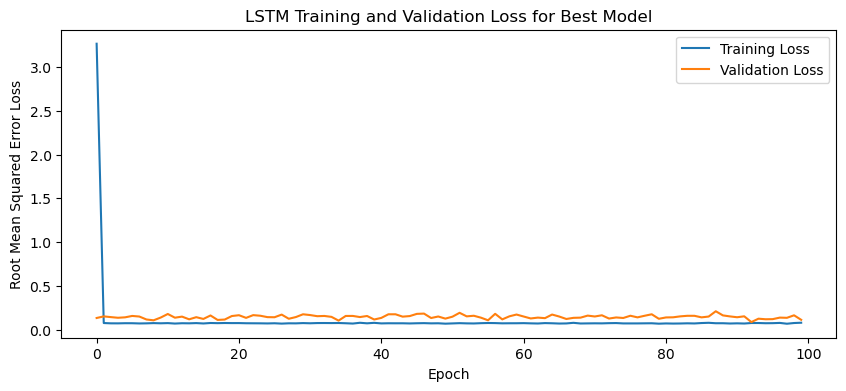

1/1 - 3s - loss: 0.0952 - 3s/epoch - 3s/step
Test Loss: 0.09523777663707733
1/1 [==============================] - 0s 90ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

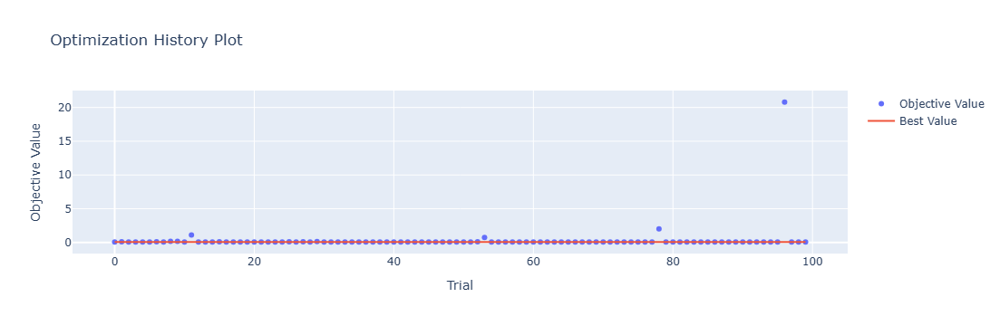

In [4]:
optuna.visualization.plot_optimization_history(study)

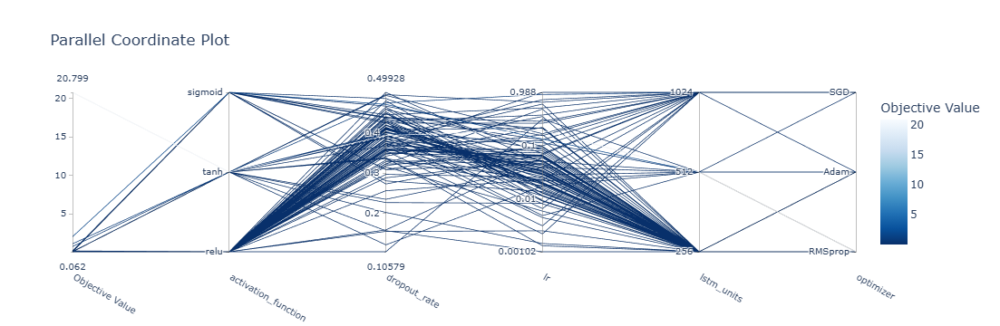

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

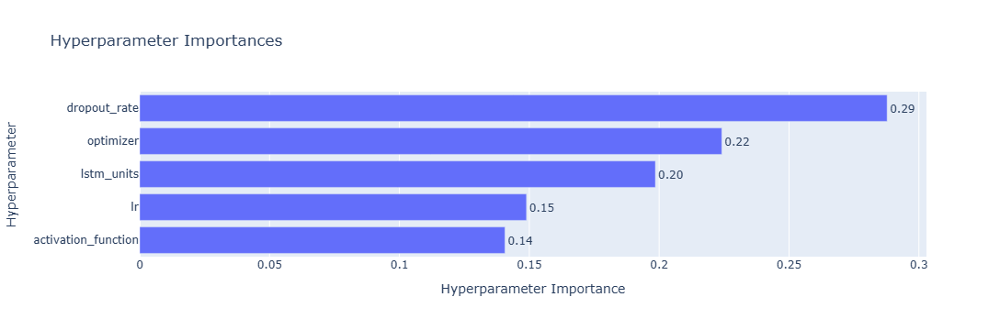

In [6]:
optuna.visualization.plot_param_importances(study)

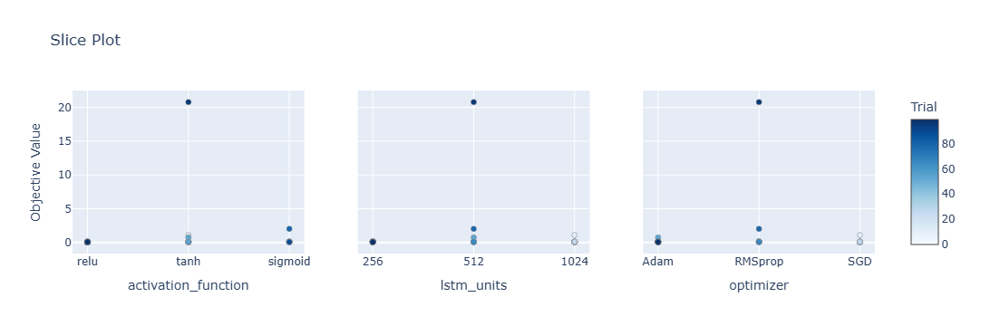

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

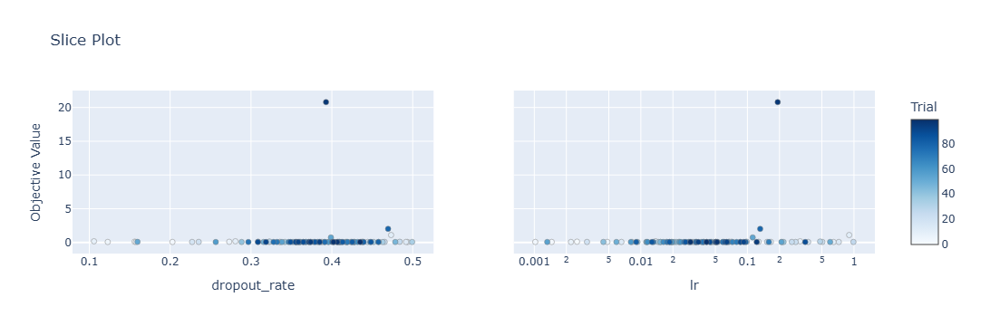

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 6s 24ms/step - loss: 1.7379 - accuracy: 0.5952 - mae: 1.6337 - rmse: 1.7379 - mape: 349.9781 - pearson: 0.6225 - val_loss: 0.0666 - val_accuracy: 0.8000 - val_mae: 0.0517 - val_rmse: 0.0666 - val_mape: 11.6650 - val_pearson: 0.7355
Epoch 2/100
84/84 [==============================] - 1s 11ms/step - loss: 0.0745 - accuracy: 0.7024 - mae: 0.0604 - rmse: 0.0745 - mape: 13.5293 - pearson: 0.7545 - val_loss: 0.0611 - val_accuracy: 0.8000 - val_mae: 0.0491 - val_rmse: 0.0611 - val_mape: 11.1231 - val_pearson: 0.7952
Epoch 3/100
84/84 [==============================] - 1s 11ms/step - loss: 0.0721 - accuracy: 0.7500 - mae: 0.0581 - rmse: 0.0721 - mape: 13.2751 - pearson: 0.7703 - val_loss: 0.0747 - val_accuracy: 0.8000 - val_mae: 0.0649 - val_rmse: 0.0747 - val_mape: 14.1159 - val_pearson: 0.6977
Epoch 4/100
84/84 [==============================] - 1s 13ms/step - loss: 0.0732 - accuracy: 0.7024 - mae: 0.0578 - rmse: 0.0732 - mape: 13.3214 - 

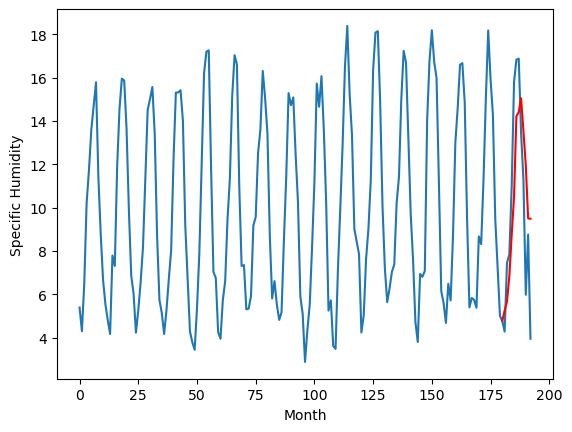

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.95		0.05
5.61		5.37		-0.24
7.82		6.54		-1.28
8.04		8.43		0.39
10.53		10.19		-0.34
15.28		13.91		-1.37
16.08		14.10		-1.98
16.24		14.74		-1.50
14.08		13.23		-0.85
11.00		11.65		0.65
5.34		9.20		3.86
8.98		9.18		0.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 4.94524045586586, 5.367695021629333, 6.535425591468811, 8.427397894859315, 10.190865683555604, 13.90537326335907, 14.098874199390412, 14.741358864307404, 13.226235735416413, 11.646326768398286, 9.195417392253876, 9.179127403721214]


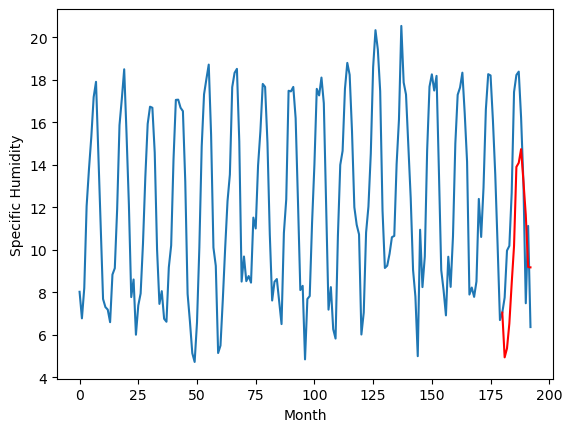

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		4.84		0.02
4.97		5.26		0.29
6.82		6.43		-0.39
7.06		8.32		1.26
9.82		10.08		0.26
14.44		13.80		-0.64
16.35		13.99		-2.36
16.55		14.63		-1.92
13.55		13.12		-0.43
10.83		11.54		0.71
4.96		9.09		4.13
7.36		9.07		1.71
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.06, 4.83524045586586, 5.257695021629334, 6.425425591468811, 8.317397894859315, 10.080865683555604, 13.795373263359071, 13.988874199390413, 14.631358864307405, 13.116235735416414, 11.536326768398286, 9.085417392253877, 9.069127403721215]


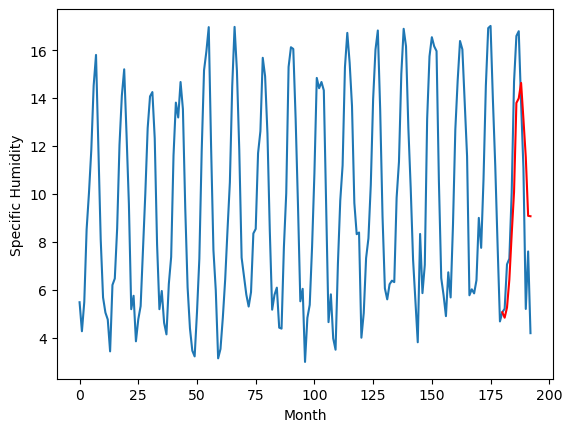

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		4.54		0.33
4.12		4.96		0.84
7.57		6.13		-1.44
8.14		8.02		-0.12
11.65		9.78		-1.87
15.55		13.50		-2.05
16.39		13.69		-2.70
16.01		14.33		-1.68
13.70		12.82		-0.88
11.27		11.24		-0.03
5.06		8.79		3.73
8.11		8.77		0.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 4.53524045586586, 4.957695021629333, 6.125425591468811, 8.017397894859315, 9.780865683555604, 13.49537326335907, 13.688874199390412, 14.331358864307404, 12.816235735416413, 11.236326768398285, 8.785417392253876, 8.769127403721214]


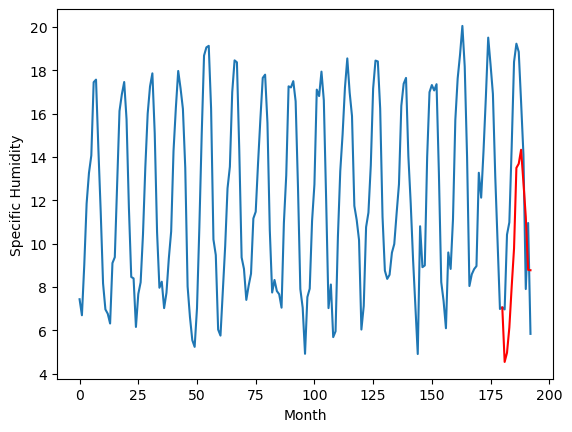

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		5.79		0.47
4.92		6.21		1.29
7.76		7.38		-0.38
9.16		9.27		0.11
13.17		11.03		-2.14
16.86		14.75		-2.11
17.57		14.94		-2.63
17.49		15.58		-1.91
13.26		14.07		0.81
11.17		12.49		1.32
6.95		10.04		3.09
9.71		10.02		0.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.2, 5.78524045586586, 6.207695021629333, 7.375425591468811, 9.267397894859315, 11.030865683555604, 14.74537326335907, 14.938874199390412, 15.581358864307404, 14.066235735416413, 12.486326768398285, 10.035417392253876, 10.019127403721214]


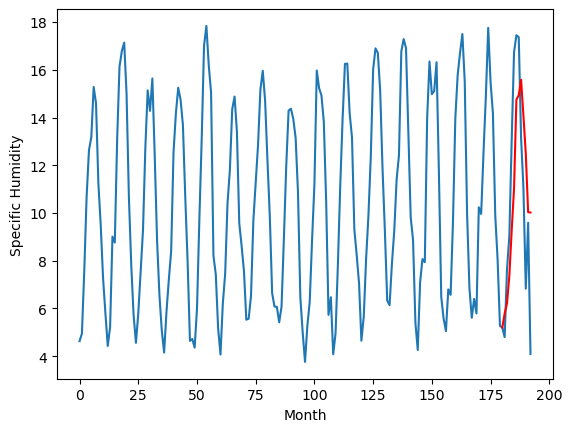

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		8.43		1.01
8.01		8.85		0.84
9.58		10.02		0.44
10.59		11.91		1.32
13.09		13.67		0.58
18.35		17.39		-0.96
19.47		17.58		-1.89
20.63		18.22		-2.41
16.54		16.71		0.17
14.22		15.13		0.91
8.96		12.68		3.72
10.38		12.66		2.28
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.16, 8.42524045586586, 8.847695021629333, 10.01542559146881, 11.907397894859313, 13.670865683555602, 17.38537326335907, 17.578874199390413, 18.221358864307405, 16.706235735416413, 15.126326768398286, 12.675417392253877, 12.659127403721214]


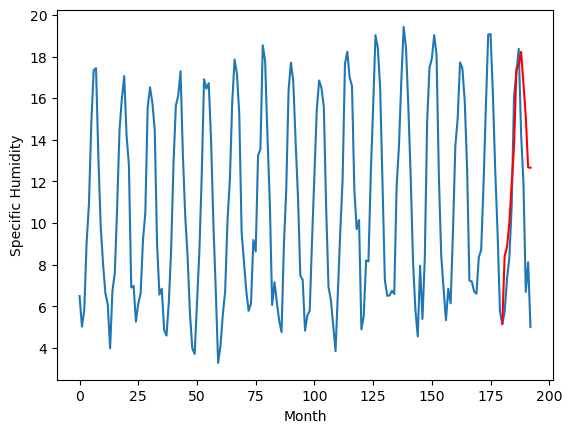

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		5.88		0.55
5.38		6.30		0.92
6.97		7.47		0.50
7.57		9.36		1.79
10.57		11.12		0.55
14.95		14.84		-0.11
16.39		15.03		-1.36
16.92		15.67		-1.25
13.60		14.16		0.56
11.49		12.58		1.09
5.74		10.13		4.39
7.58		10.11		2.53
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.05, 5.87524045586586, 6.297695021629334, 7.4654255914688115, 9.357397894859314, 11.120865683555603, 14.83537326335907, 15.028874199390412, 15.671358864307404, 14.156235735416413, 12.576326768398285, 10.125417392253876, 10.109127403721214]


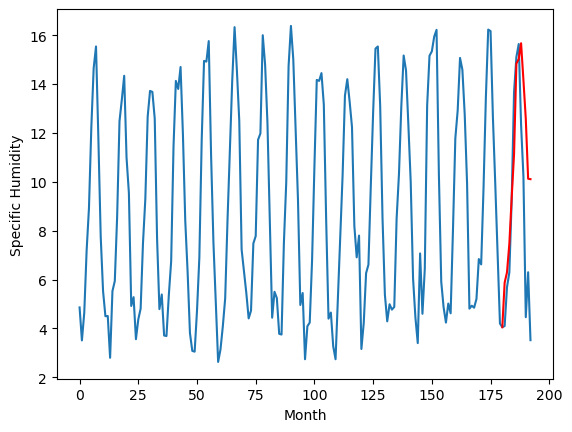

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		7.83		0.71
7.15		8.25		1.10
8.77		9.42		0.65
9.47		11.31		1.84
12.49		13.07		0.58
16.76		16.79		0.03
18.26		16.98		-1.28
18.54		17.62		-0.92
15.05		16.11		1.06
13.17		14.53		1.36
7.38		12.08		4.70
9.15		12.06		2.91
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.64, 7.82524045586586, 8.247695021629333, 9.41542559146881, 11.307397894859314, 13.070865683555603, 16.78537326335907, 16.97887419939041, 17.621358864307403, 16.106235735416412, 14.526326768398285, 12.075417392253875, 12.059127403721213]


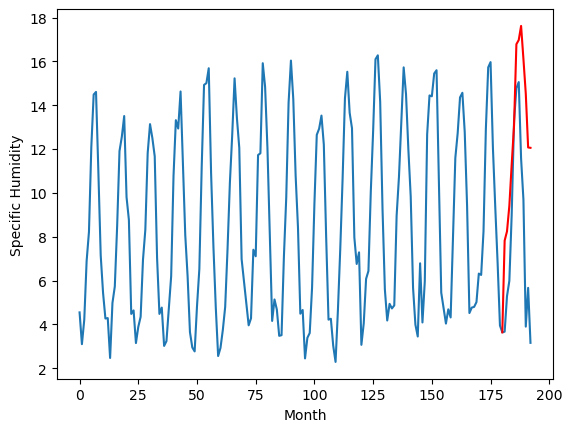

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		5.03		0.63
3.72		5.45		1.73
6.78		6.62		-0.16
7.51		8.51		1.00
10.42		10.27		-0.15
15.40		13.99		-1.41
16.90		14.18		-2.72
17.09		14.82		-2.27
13.28		13.31		0.03
10.86		11.73		0.87
5.57		9.28		3.71
7.16		9.26		2.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.46, 5.02524045586586, 5.447695021629333, 6.615425591468811, 8.507397894859313, 10.270865683555602, 13.985373263359069, 14.17887419939041, 14.821358864307403, 13.306235735416411, 11.726326768398284, 9.275417392253875, 9.259127403721212]


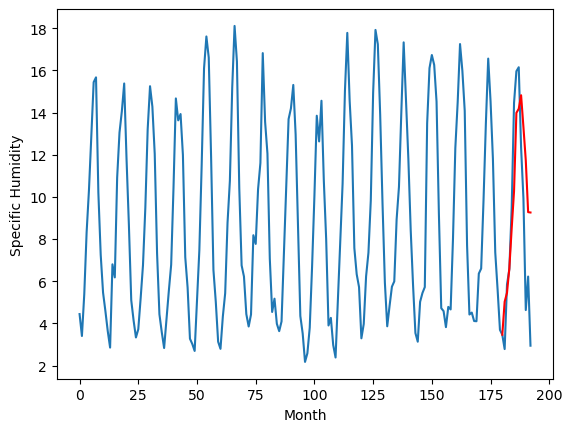

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.90		0.73
5.72		7.32		1.60
7.52		8.49		0.97
8.84		10.38		1.54
10.93		12.14		1.21
15.70		15.86		0.16
16.63		16.05		-0.58
17.05		16.69		-0.36
13.88		15.18		1.30
12.57		13.60		1.03
7.05		11.15		4.10
7.89		11.13		3.24
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.93, 6.89524045586586, 7.3176950216293335, 8.485425591468811, 10.377397894859314, 12.140865683555603, 15.85537326335907, 16.04887419939041, 16.691358864307404, 15.176235735416412, 13.596326768398285, 11.145417392253876, 11.129127403721213]


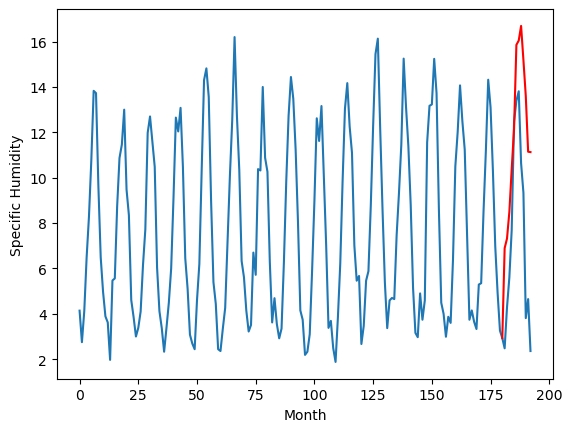

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		5.26		0.78
3.74		5.68		1.94
5.36		6.85		1.49
6.96		8.74		1.78
8.48		10.50		2.02
13.61		14.22		0.61
14.68		14.41		-0.27
15.17		15.05		-0.12
11.55		13.54		1.99
10.56		11.96		1.40
5.71		9.51		3.80
5.71		9.49		3.78
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.74, 5.25524045586586, 5.677695021629334, 6.845425591468811, 8.737397894859313, 10.500865683555602, 14.21537326335907, 14.40887419939041, 15.051358864307403, 13.536235735416412, 11.956326768398284, 9.505417392253875, 9.489127403721213]


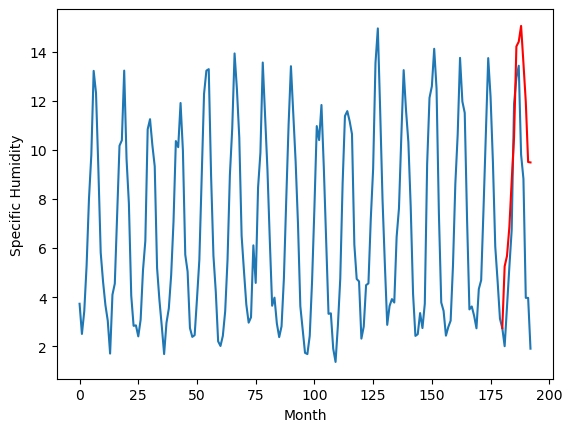

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[5.25524045586586, 4.94524045586586, 4.83524045586586, 4.53524045586586, 5.78524045586586, 8.42524045586586, 5.87524045586586, 7.82524045586586, 5.02524045586586, 6.89524045586586, 5.25524045586586]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62    5.25524
1                 1    4.90    4.94524
2                 2    4.82    4.83524
3                 3    4.21    4.53524
4                 4    5.32    5.78524
5                 5    7.42    8.42524
6                 6    5.33    5.87524
7                 7    7.12    7.82524
8                 8    4.40    5.02524
9                 9    6.17    6.89524
10               10    4.48    5.25524


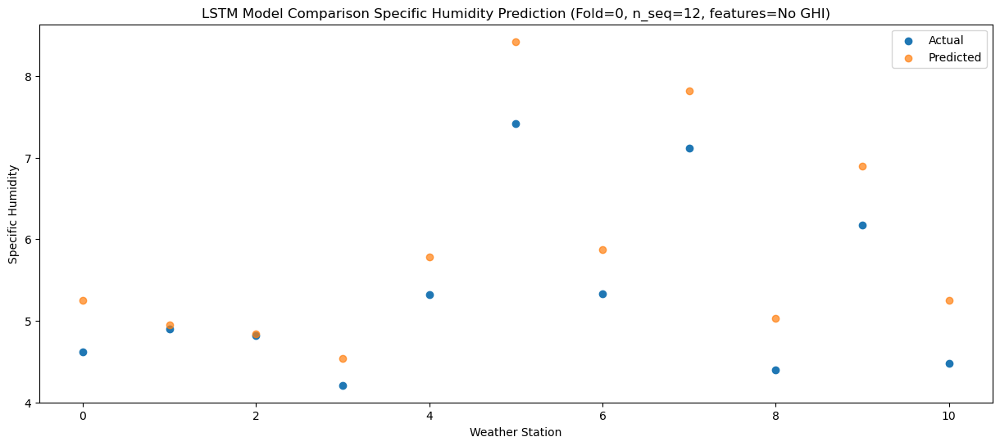

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   5.677695
1                 1    5.61   5.367695
2                 2    4.97   5.257695
3                 3    4.12   4.957695
4                 4    4.92   6.207695
5                 5    8.01   8.847695
6                 6    5.38   6.297695
7                 7    7.15   8.247695
8                 8    3.72   5.447695
9                 9    5.72   7.317695
10               10    3.74   5.677695


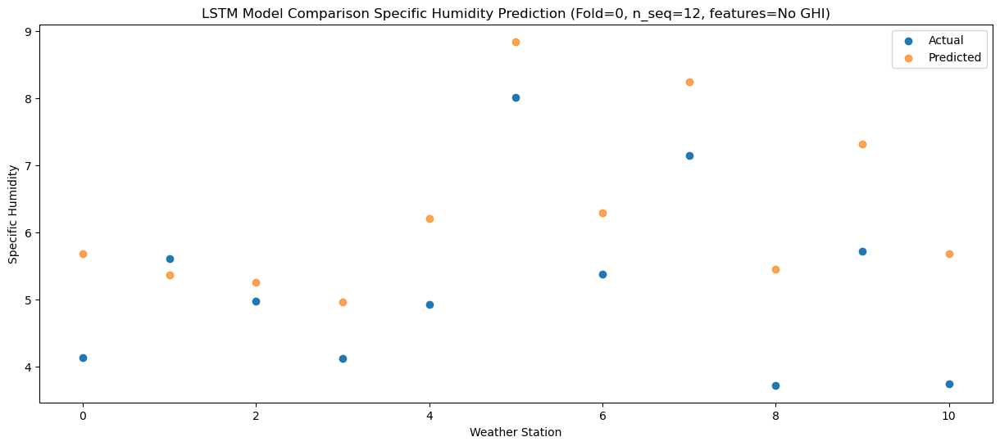

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   6.845426
1                 1    7.82   6.535426
2                 2    6.82   6.425426
3                 3    7.57   6.125426
4                 4    7.76   7.375426
5                 5    9.58  10.015426
6                 6    6.97   7.465426
7                 7    8.77   9.415426
8                 8    6.78   6.615426
9                 9    7.52   8.485426
10               10    5.36   6.845426


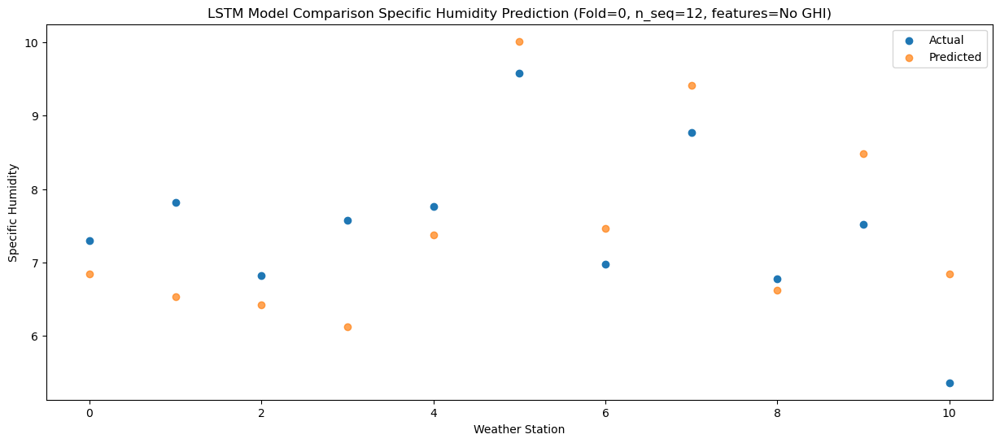

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.69   8.737398
1                 1    8.04   8.427398
2                 2    7.06   8.317398
3                 3    8.14   8.017398
4                 4    9.16   9.267398
5                 5   10.59  11.907398
6                 6    7.57   9.357398
7                 7    9.47  11.307398
8                 8    7.51   8.507398
9                 9    8.84  10.377398
10               10    6.96   8.737398


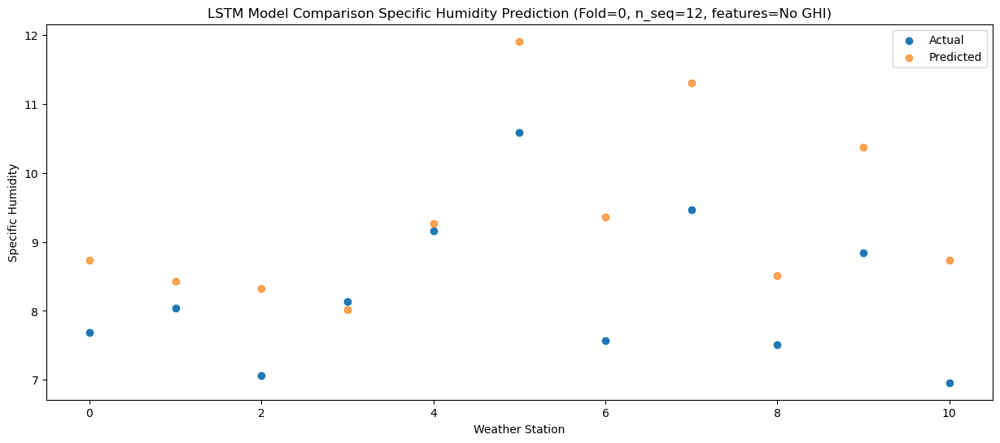

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.84  10.500866
1                 1   10.53  10.190866
2                 2    9.82  10.080866
3                 3   11.65   9.780866
4                 4   13.17  11.030866
5                 5   13.09  13.670866
6                 6   10.57  11.120866
7                 7   12.49  13.070866
8                 8   10.42  10.270866
9                 9   10.93  12.140866
10               10    8.48  10.500866


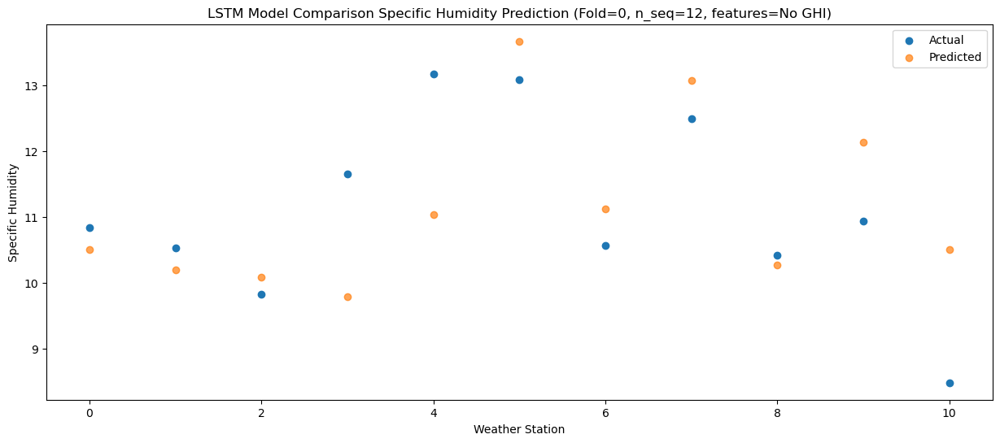

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.65  14.215373
1                 1   15.28  13.905373
2                 2   14.44  13.795373
3                 3   15.55  13.495373
4                 4   16.86  14.745373
5                 5   18.35  17.385373
6                 6   14.95  14.835373
7                 7   16.76  16.785373
8                 8   15.40  13.985373
9                 9   15.70  15.855373
10               10   13.61  14.215373


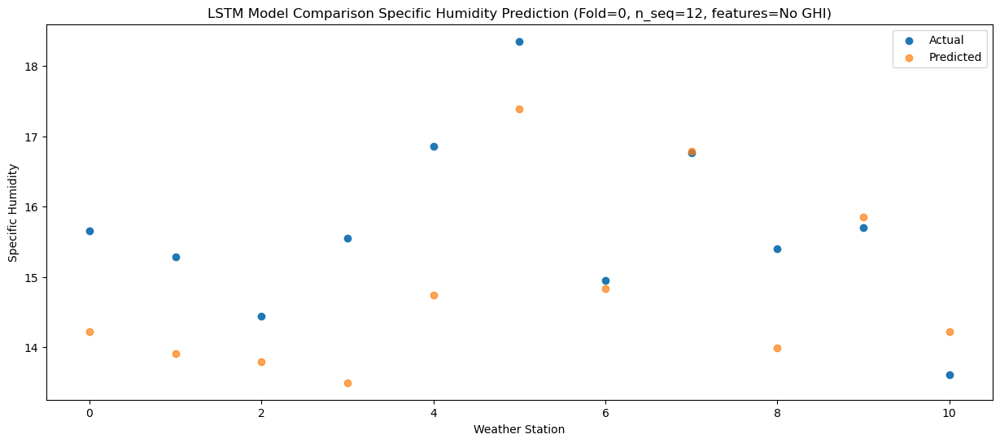

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.68  14.408874
1                 1   16.08  14.098874
2                 2   16.35  13.988874
3                 3   16.39  13.688874
4                 4   17.57  14.938874
5                 5   19.47  17.578874
6                 6   16.39  15.028874
7                 7   18.26  16.978874
8                 8   16.90  14.178874
9                 9   16.63  16.048874
10               10   14.68  14.408874


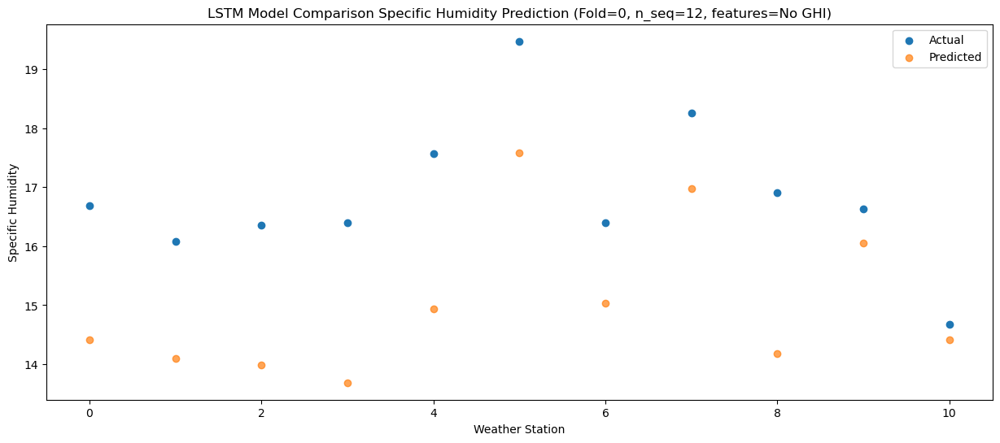

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.73  15.051359
1                 1   16.24  14.741359
2                 2   16.55  14.631359
3                 3   16.01  14.331359
4                 4   17.49  15.581359
5                 5   20.63  18.221359
6                 6   16.92  15.671359
7                 7   18.54  17.621359
8                 8   17.09  14.821359
9                 9   17.05  16.691359
10               10   15.17  15.051359


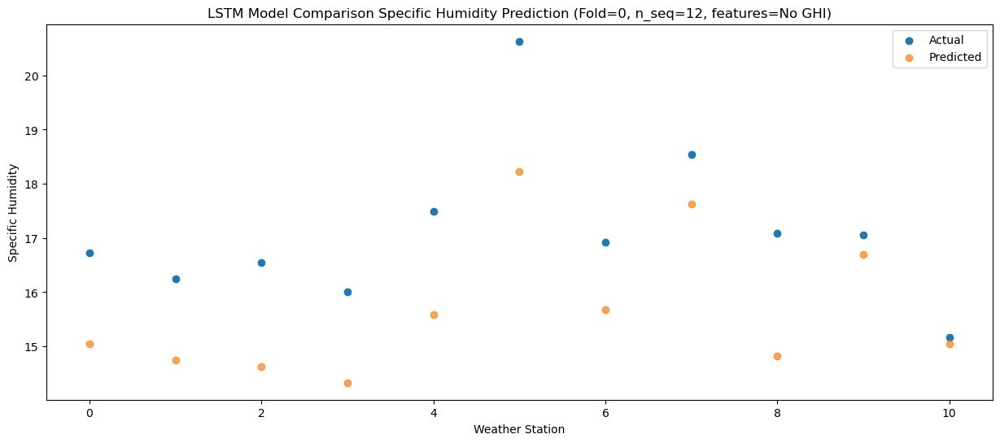

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.31  13.536236
1                 1   14.08  13.226236
2                 2   13.55  13.116236
3                 3   13.70  12.816236
4                 4   13.26  14.066236
5                 5   16.54  16.706236
6                 6   13.60  14.156236
7                 7   15.05  16.106236
8                 8   13.28  13.306236
9                 9   13.88  15.176236
10               10   11.55  13.536236


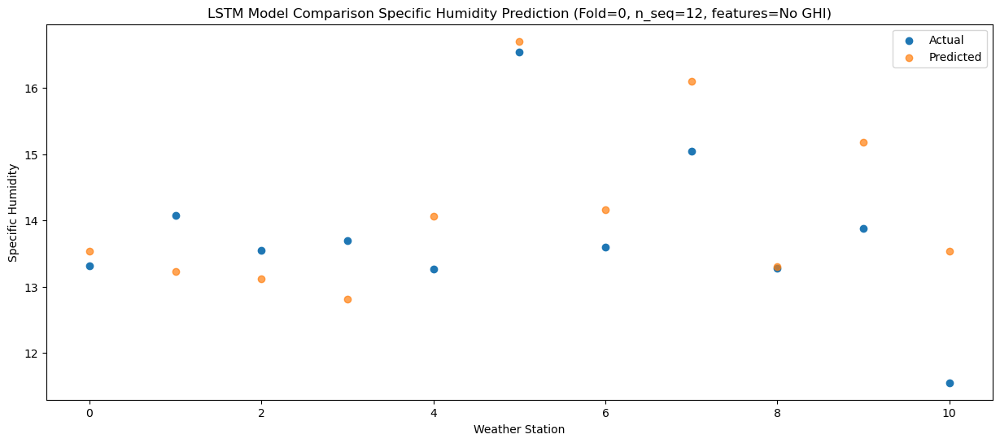

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   11.13  11.956327
1                 1   11.00  11.646327
2                 2   10.83  11.536327
3                 3   11.27  11.236327
4                 4   11.17  12.486327
5                 5   14.22  15.126327
6                 6   11.49  12.576327
7                 7   13.17  14.526327
8                 8   10.86  11.726327
9                 9   12.57  13.596327
10               10   10.56  11.956327


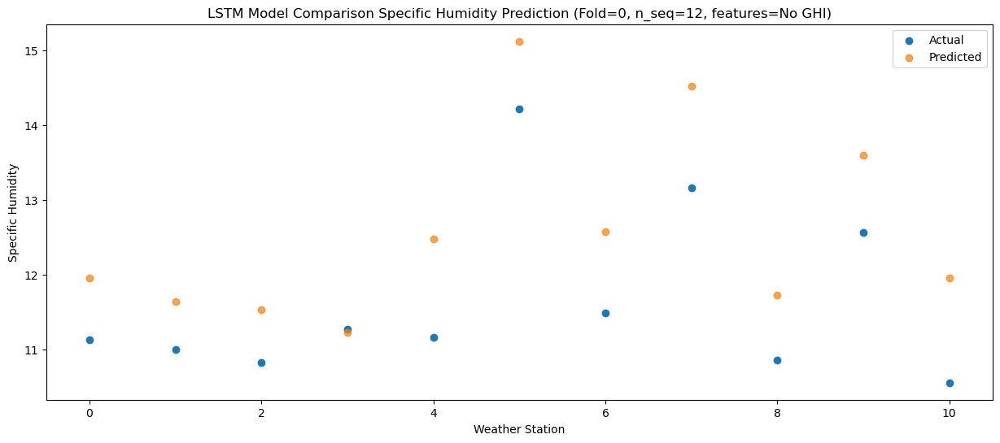

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.83   9.505417
1                 1    5.34   9.195417
2                 2    4.96   9.085417
3                 3    5.06   8.785417
4                 4    6.95  10.035417
5                 5    8.96  12.675417
6                 6    5.74  10.125417
7                 7    7.38  12.075417
8                 8    5.57   9.275417
9                 9    7.05  11.145417
10               10    5.71   9.505417


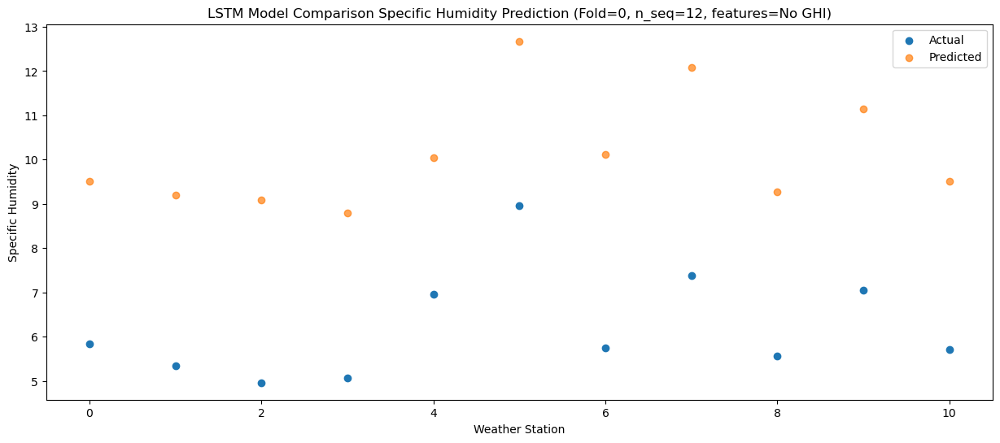

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.61   9.489127
1                 1    8.98   9.179127
2                 2    7.36   9.069127
3                 3    8.11   8.769127
4                 4    9.71  10.019127
5                 5   10.38  12.659127
6                 6    7.58  10.109127
7                 7    9.15  12.059127
8                 8    7.16   9.259127
9                 9    7.89  11.129127
10               10    5.71   9.489127


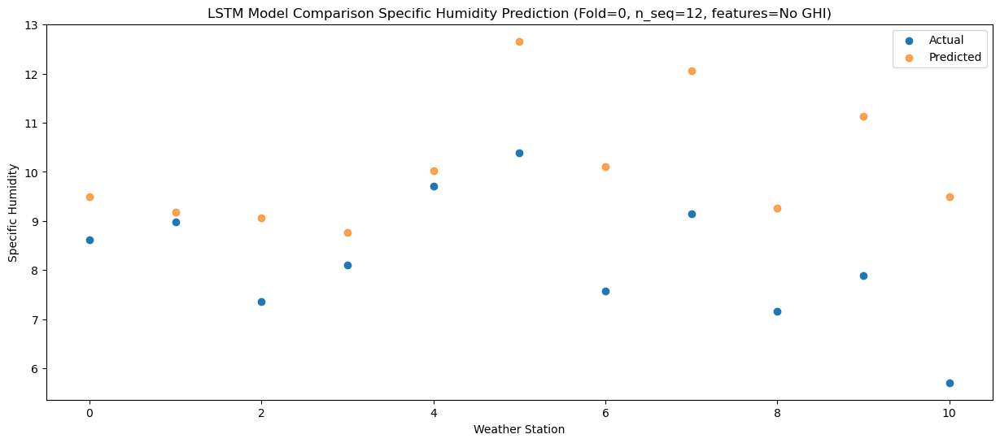

Model: "sequential_501"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1002 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1002 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1003 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1003 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1503 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1504 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1505 (Dense)          (1, 12)                

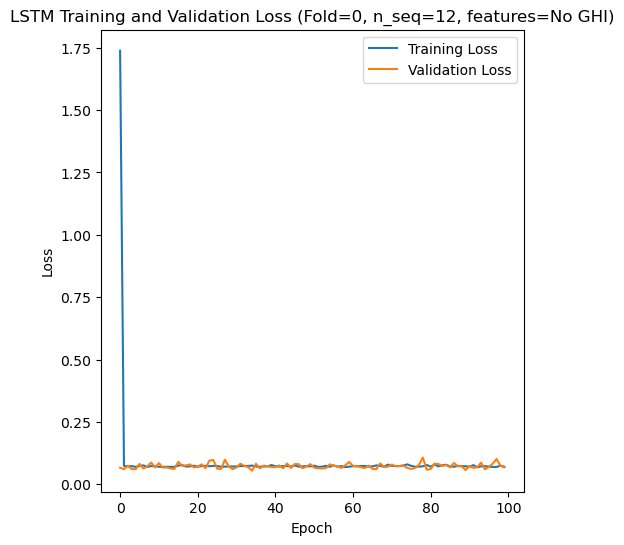

Epoch 1/100
84/84 [==============================] - 6s 27ms/step - loss: 1.8280 - accuracy: 0.5476 - mae: 1.7185 - rmse: 1.8280 - mape: 379.8416 - pearson: 0.5822 - val_loss: 0.0688 - val_accuracy: 0.7000 - val_mae: 0.0571 - val_rmse: 0.0688 - val_mape: 13.2764 - val_pearson: 0.7752
Epoch 2/100
84/84 [==============================] - 1s 14ms/step - loss: 0.0701 - accuracy: 0.8095 - mae: 0.0559 - rmse: 0.0701 - mape: 12.7103 - pearson: 0.7847 - val_loss: 0.0588 - val_accuracy: 0.7000 - val_mae: 0.0492 - val_rmse: 0.0588 - val_mape: 11.2626 - val_pearson: 0.7999
Epoch 3/100
84/84 [==============================] - 1s 12ms/step - loss: 0.0715 - accuracy: 0.7619 - mae: 0.0577 - rmse: 0.0715 - mape: 13.0279 - pearson: 0.7809 - val_loss: 0.0624 - val_accuracy: 0.7000 - val_mae: 0.0493 - val_rmse: 0.0624 - val_mape: 11.3932 - val_pearson: 0.7978
Epoch 4/100
84/84 [==============================] - 1s 12ms/step - loss: 0.0682 - accuracy: 0.7738 - mae: 0.0543 - rmse: 0.0682 - mape: 12.1714 - 

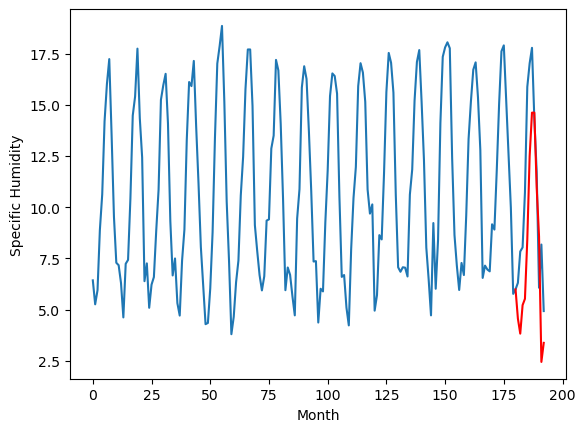

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		4.07		-0.27
4.53		3.34		-1.19
6.06		4.73		-1.33
6.42		5.04		-1.38
9.34		7.94		-1.40
13.32		12.00		-1.32
15.19		14.13		-1.06
15.40		14.13		-1.27
12.45		10.47		-1.98
10.41		8.09		-2.32
4.82		1.96		-2.86
6.99		2.89		-4.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.15, 4.071314640045166, 3.3377124142646792, 4.730342872142792, 5.037817395925522, 7.937158979177475, 12.004480279684067, 14.133208192586899, 14.134890780486167, 10.46813915733248, 8.089407668150962, 1.9556372023001316, 2.8866972780600193]


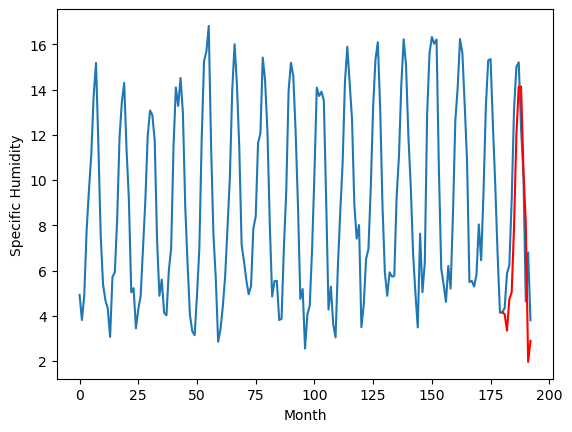

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		2.82		-0.40
3.22		2.09		-1.13
5.84		3.48		-2.36
5.55		3.79		-1.76
8.39		6.69		-1.70
12.91		10.75		-2.16
14.50		12.88		-1.62
14.72		12.88		-1.84
11.96		9.22		-2.74
9.21		6.84		-2.37
3.71		0.71		-3.00
6.35		1.64		-4.71
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.12, 2.821314640045166, 2.087712414264679, 3.4803428721427916, 3.7878173959255217, 6.687158979177475, 10.754480279684067, 12.883208192586899, 12.884890780486167, 9.21813915733248, 6.839407668150962, 0.7056372023001316, 1.6366972780600193]


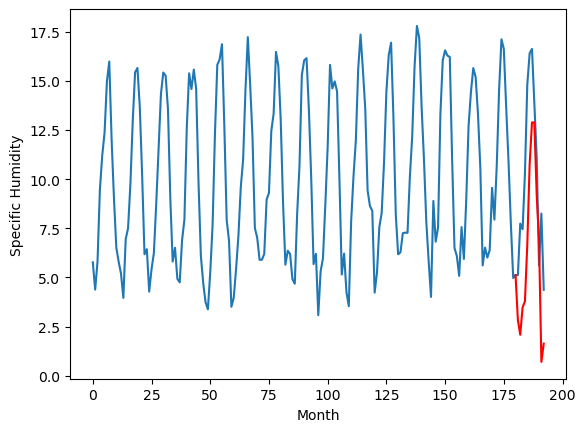

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.12		0.09
2.10		1.39		-0.71
4.74		2.78		-1.96
6.08		3.09		-2.99
9.97		5.99		-3.98
13.16		10.05		-3.11
13.64		12.18		-1.46
13.98		12.18		-1.80
10.89		8.52		-2.37
8.64		6.14		-2.50
4.19		0.01		-4.18
7.11		0.94		-6.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.35, 2.121314640045166, 1.387712414264679, 2.780342872142792, 3.087817395925522, 5.987158979177475, 10.054480279684068, 12.1832081925869, 12.184890780486167, 8.518139157332481, 6.139407668150962, 0.005637202300132316, 0.93669727806002]


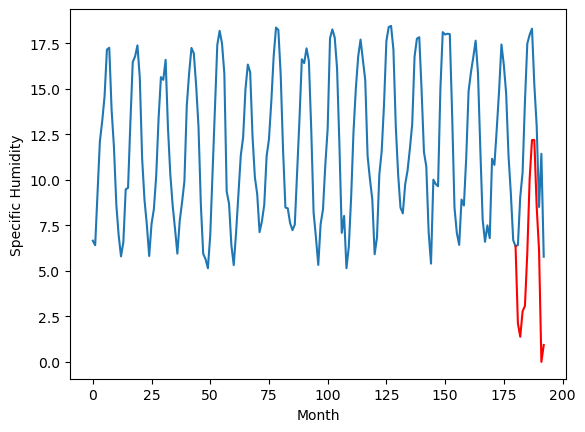

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.18		0.00
6.22		5.45		-0.77
8.94		6.84		-2.10
10.20		7.15		-3.05
14.23		10.05		-4.18
17.64		14.11		-3.53
17.82		16.24		-1.58
17.86		16.24		-1.62
14.76		12.58		-2.18
12.81		10.20		-2.61
8.22		4.07		-4.15
11.15		5.00		-6.15
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.08, 6.181314640045166, 5.447712414264679, 6.8403428721427915, 7.147817395925522, 10.047158979177475, 14.114480279684066, 16.2432081925869, 16.244890780486166, 12.57813915733248, 10.199407668150961, 4.065637202300131, 4.996697278060019]


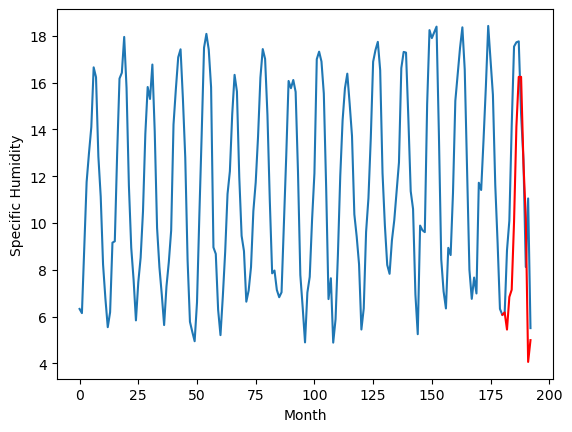

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		4.67		-1.08
5.12		3.94		-1.18
5.91		5.33		-0.58
7.21		5.64		-1.57
11.52		8.54		-2.98
13.69		12.60		-1.09
15.02		14.73		-0.29
15.24		14.73		-0.51
11.70		11.07		-0.63
8.59		8.69		0.10
6.75		2.56		-4.19
5.70		3.49		-2.21
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.92, 4.671314640045166, 3.937712414264679, 5.330342872142792, 5.637817395925522, 8.537158979177475, 12.604480279684067, 14.733208192586899, 14.734890780486166, 11.06813915733248, 8.689407668150961, 2.5556372023001312, 3.486697278060019]


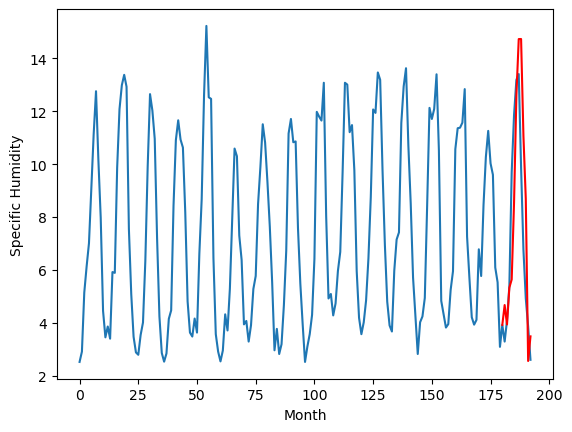

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.52		-0.14
5.78		4.79		-0.99
7.34		6.18		-1.16
7.96		6.49		-1.47
10.89		9.39		-1.50
15.24		13.45		-1.79
17.74		15.58		-2.16
18.03		15.58		-2.45
14.68		11.92		-2.76
12.55		9.54		-3.01
6.62		3.41		-3.21
8.49		4.34		-4.15
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.16, 5.521314640045166, 4.7877124142646785, 6.180342872142791, 6.487817395925521, 9.387158979177475, 13.454480279684066, 15.583208192586898, 15.584890780486166, 11.91813915733248, 9.539407668150961, 3.405637202300131, 4.336697278060019]


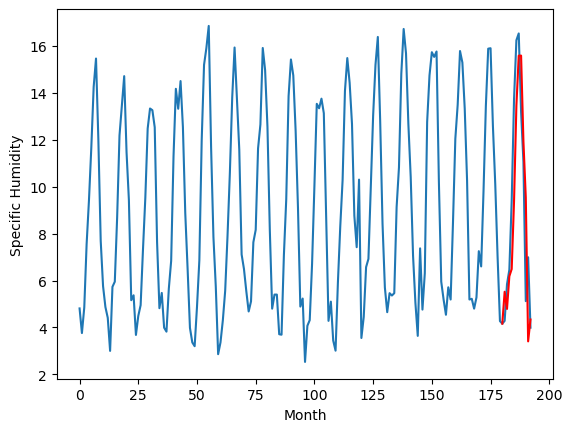

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.41		-0.12
6.01		5.68		-0.33
8.74		7.07		-1.67
9.97		7.38		-2.59
13.18		10.28		-2.90
17.94		14.34		-3.60
18.57		16.47		-2.10
18.42		16.47		-1.95
15.17		12.81		-2.36
12.44		10.43		-2.01
7.88		4.30		-3.58
9.52		5.23		-4.29
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.84, 6.411314640045166, 5.677712414264679, 7.070342872142792, 7.377817395925522, 10.277158979177475, 14.344480279684067, 16.4732081925869, 16.474890780486167, 12.80813915733248, 10.429407668150962, 4.2956372023001315, 5.226697278060019]


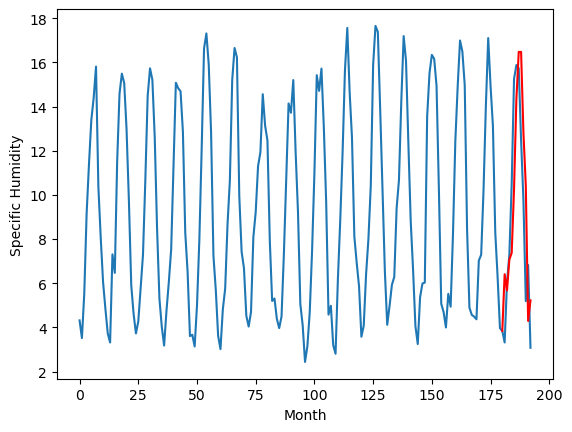

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.08		-0.41
5.68		5.35		-0.33
8.29		6.74		-1.55
9.45		7.05		-2.40
13.67		9.95		-3.72
16.81		14.01		-2.80
17.86		16.14		-1.72
17.44		16.14		-1.30
13.87		12.48		-1.39
11.43		10.10		-1.33
7.90		3.97		-3.93
7.29		4.90		-2.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.73, 6.081314640045166, 5.347712414264679, 6.740342872142792, 7.047817395925522, 9.947158979177475, 14.014480279684067, 16.143208192586897, 16.144890780486165, 12.478139157332478, 10.09940766815096, 3.9656372023001296, 4.896697278060017]


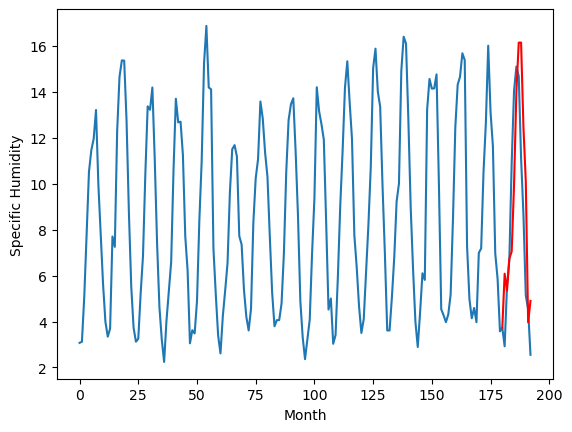

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.27		-0.44
1.97		1.54		-0.43
3.79		2.93		-0.86
3.96		3.24		-0.72
9.11		6.14		-2.97
12.10		10.20		-1.90
13.34		12.33		-1.01
12.31		12.33		0.02
9.35		8.67		-0.68
5.91		6.29		0.38
3.55		0.16		-3.39
2.57		1.09		-1.48
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.83, 2.271314640045166, 1.537712414264679, 2.9303428721427918, 3.237817395925522, 6.1371589791774745, 10.204480279684066, 12.333208192586898, 12.334890780486166, 8.66813915733248, 6.289407668150961, 0.1556372023001309, 1.0866972780600186]


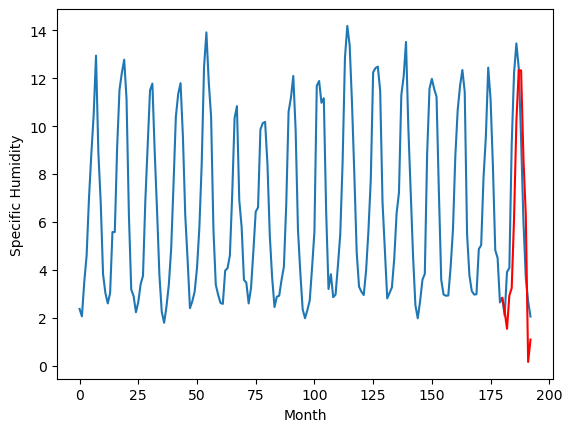

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.56		0.48
4.12		3.83		-0.29
5.36		5.22		-0.14
6.73		5.53		-1.20
8.26		8.43		0.17
13.58		12.49		-1.09
15.44		14.62		-0.82
15.78		14.62		-1.16
12.59		10.96		-1.63
10.73		8.58		-2.15
5.54		2.45		-3.09
5.42		3.38		-2.04
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.69, 4.561314640045166, 3.8277124142646786, 5.220342872142791, 5.5278173959255215, 8.427158979177474, 12.494480279684065, 14.623208192586898, 14.624890780486165, 10.958139157332479, 8.57940766815096, 2.44563720230013, 3.3766972780600177]


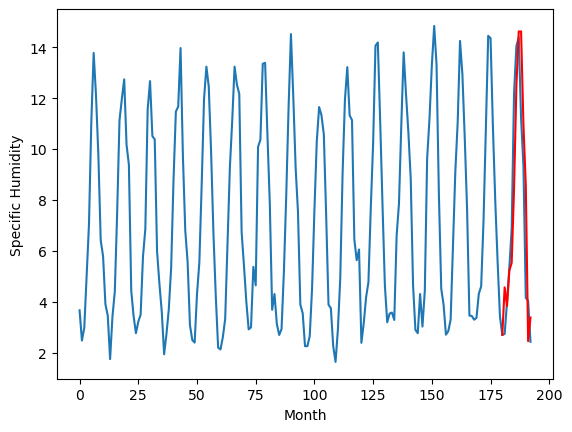

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.561314640045166, 4.071314640045166, 2.821314640045166, 2.121314640045166, 6.181314640045166, 4.671314640045166, 5.521314640045166, 6.411314640045166, 6.081314640045166, 2.271314640045166, 4.561314640045166]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.561315
1                 1    4.34   4.071315
2                 2    3.22   2.821315
3                 3    2.03   2.121315
4                 4    6.18   6.181315
5                 5    5.75   4.671315
6                 6    5.66   5.521315
7                 7    6.53   6.411315
8                 8    6.49   6.081315
9                 9    2.71   2.271315
10               10    4.08   4.561315


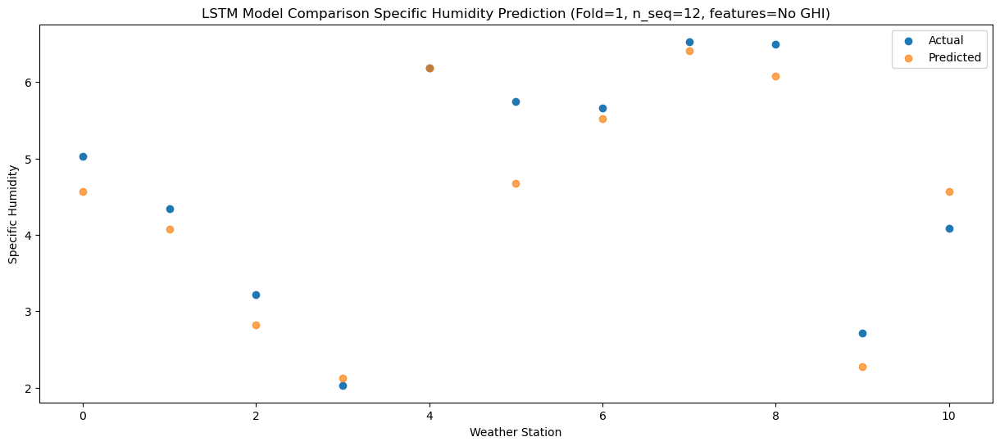

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35   3.827712
1                 1    4.53   3.337712
2                 2    3.22   2.087712
3                 3    2.10   1.387712
4                 4    6.22   5.447712
5                 5    5.12   3.937712
6                 6    5.78   4.787712
7                 7    6.01   5.677712
8                 8    5.68   5.347712
9                 9    1.97   1.537712
10               10    4.12   3.827712


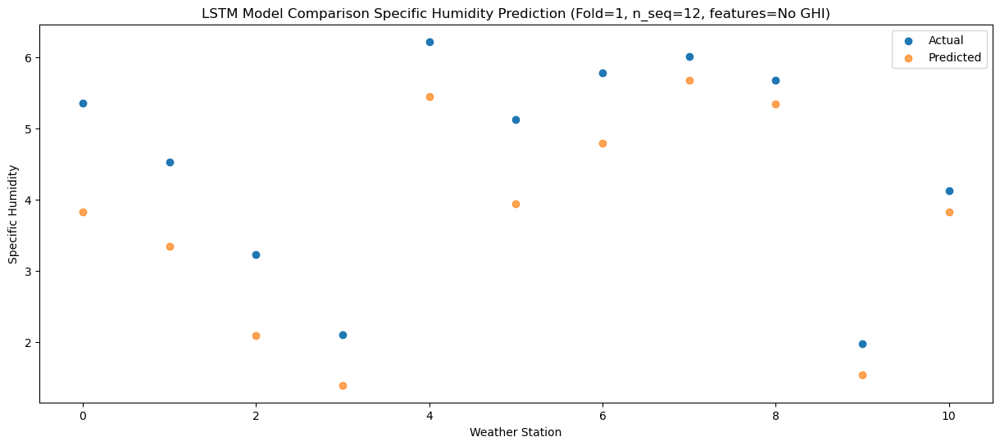

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   5.220343
1                 1    6.06   4.730343
2                 2    5.84   3.480343
3                 3    4.74   2.780343
4                 4    8.94   6.840343
5                 5    5.91   5.330343
6                 6    7.34   6.180343
7                 7    8.74   7.070343
8                 8    8.29   6.740343
9                 9    3.79   2.930343
10               10    5.36   5.220343


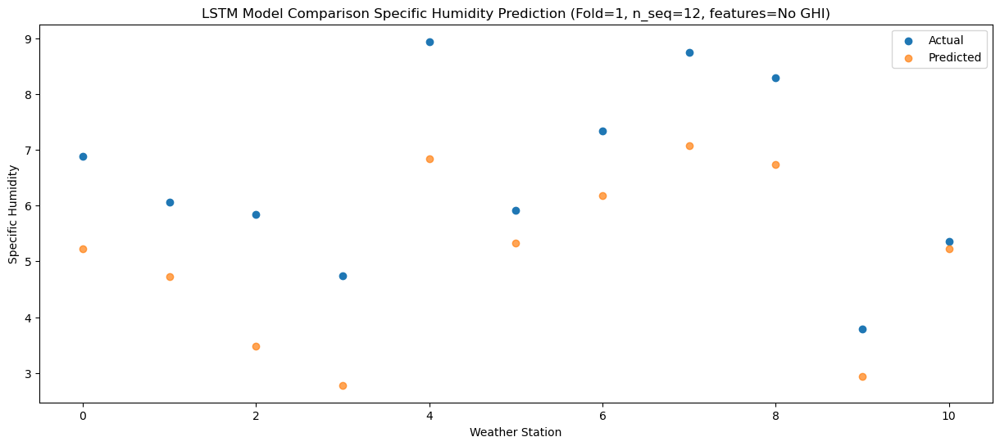

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.08   5.527817
1                 1    6.42   5.037817
2                 2    5.55   3.787817
3                 3    6.08   3.087817
4                 4   10.20   7.147817
5                 5    7.21   5.637817
6                 6    7.96   6.487817
7                 7    9.97   7.377817
8                 8    9.45   7.047817
9                 9    3.96   3.237817
10               10    6.73   5.527817


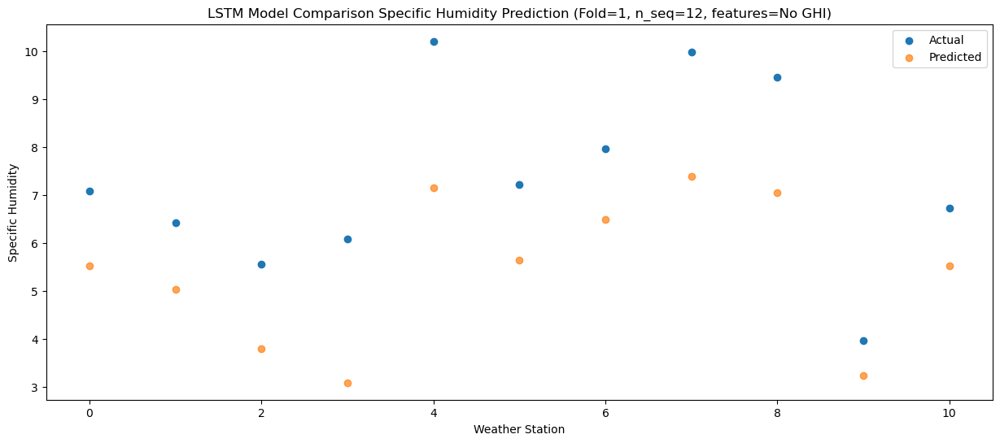

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    9.76   8.427159
1                 1    9.34   7.937159
2                 2    8.39   6.687159
3                 3    9.97   5.987159
4                 4   14.23  10.047159
5                 5   11.52   8.537159
6                 6   10.89   9.387159
7                 7   13.18  10.277159
8                 8   13.67   9.947159
9                 9    9.11   6.137159
10               10    8.26   8.427159


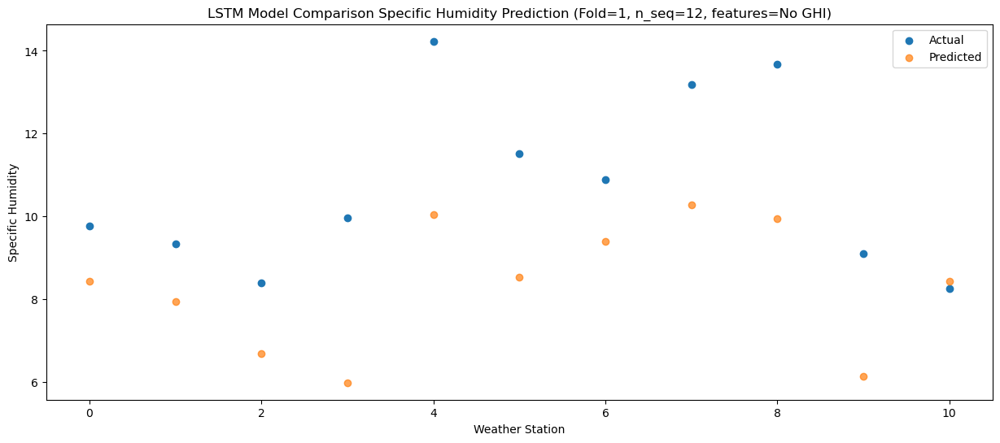

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.92   12.49448
1                 1   13.32   12.00448
2                 2   12.91   10.75448
3                 3   13.16   10.05448
4                 4   17.64   14.11448
5                 5   13.69   12.60448
6                 6   15.24   13.45448
7                 7   17.94   14.34448
8                 8   16.81   14.01448
9                 9   12.10   10.20448
10               10   13.58   12.49448


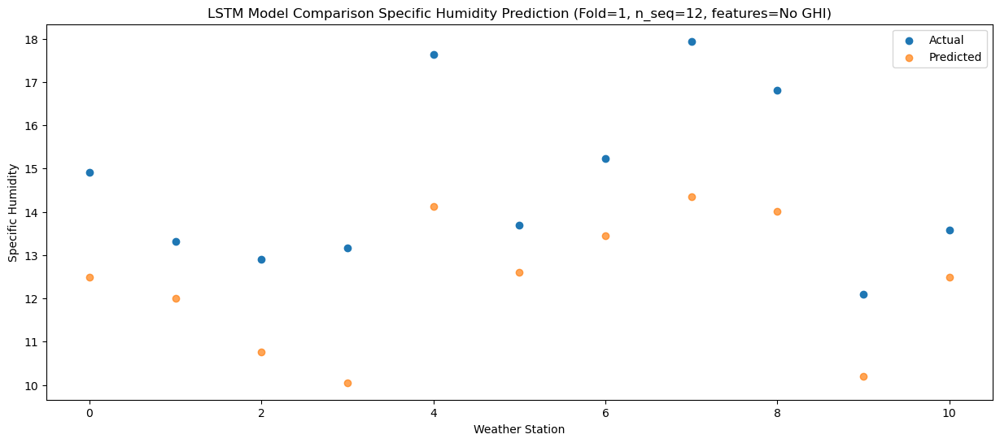

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.07  14.623208
1                 1   15.19  14.133208
2                 2   14.50  12.883208
3                 3   13.64  12.183208
4                 4   17.82  16.243208
5                 5   15.02  14.733208
6                 6   17.74  15.583208
7                 7   18.57  16.473208
8                 8   17.86  16.143208
9                 9   13.34  12.333208
10               10   15.44  14.623208


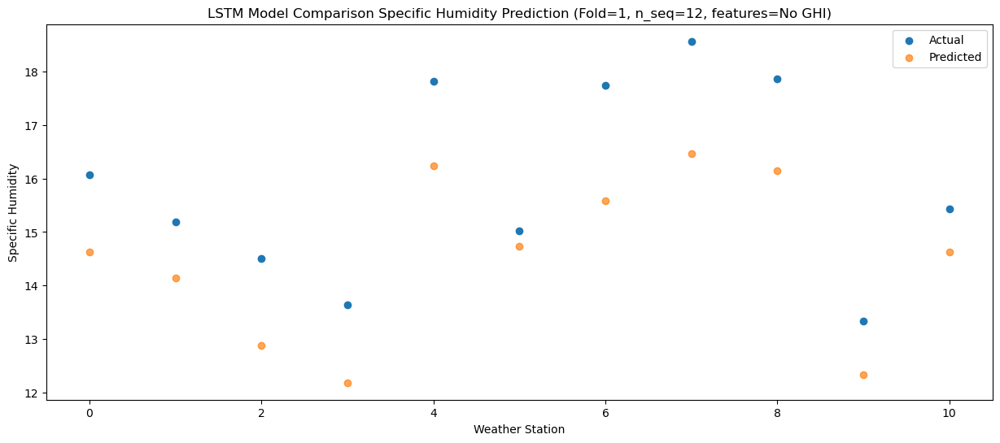

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.83  14.624891
1                 1   15.40  14.134891
2                 2   14.72  12.884891
3                 3   13.98  12.184891
4                 4   17.86  16.244891
5                 5   15.24  14.734891
6                 6   18.03  15.584891
7                 7   18.42  16.474891
8                 8   17.44  16.144891
9                 9   12.31  12.334891
10               10   15.78  14.624891


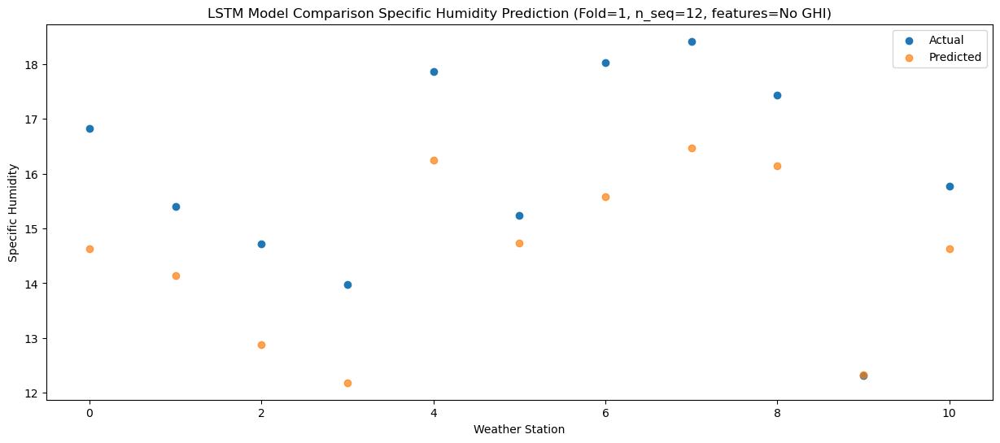

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.35  10.958139
1                 1   12.45  10.468139
2                 2   11.96   9.218139
3                 3   10.89   8.518139
4                 4   14.76  12.578139
5                 5   11.70  11.068139
6                 6   14.68  11.918139
7                 7   15.17  12.808139
8                 8   13.87  12.478139
9                 9    9.35   8.668139
10               10   12.59  10.958139


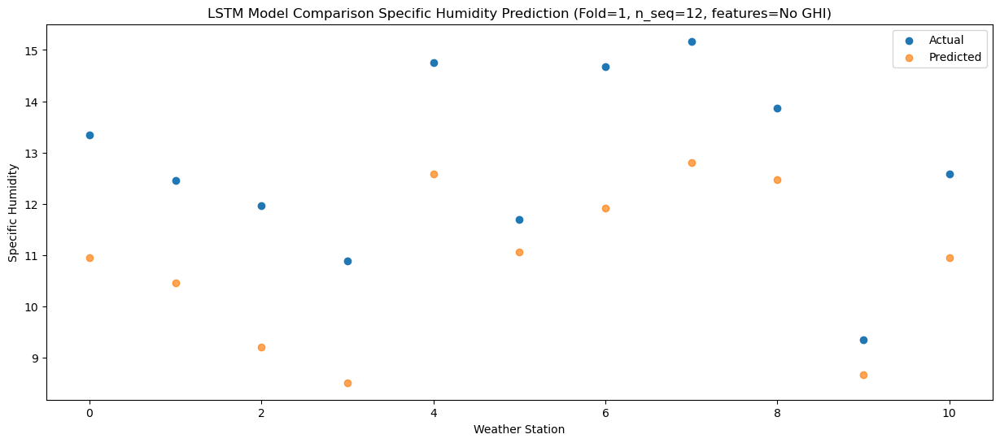

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.77   8.579408
1                 1   10.41   8.089408
2                 2    9.21   6.839408
3                 3    8.64   6.139408
4                 4   12.81  10.199408
5                 5    8.59   8.689408
6                 6   12.55   9.539408
7                 7   12.44  10.429408
8                 8   11.43  10.099408
9                 9    5.91   6.289408
10               10   10.73   8.579408


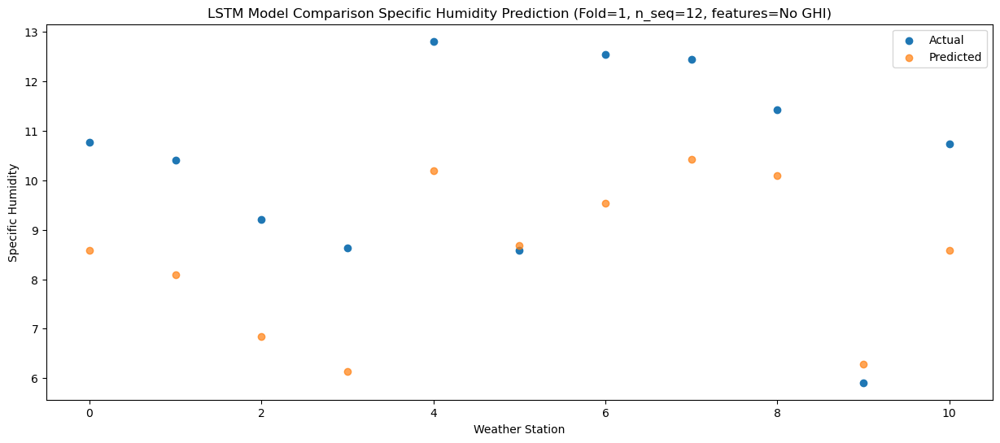

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.11   2.445637
1                 1    4.82   1.955637
2                 2    3.71   0.705637
3                 3    4.19   0.005637
4                 4    8.22   4.065637
5                 5    6.75   2.555637
6                 6    6.62   3.405637
7                 7    7.88   4.295637
8                 8    7.90   3.965637
9                 9    3.55   0.155637
10               10    5.54   2.445637


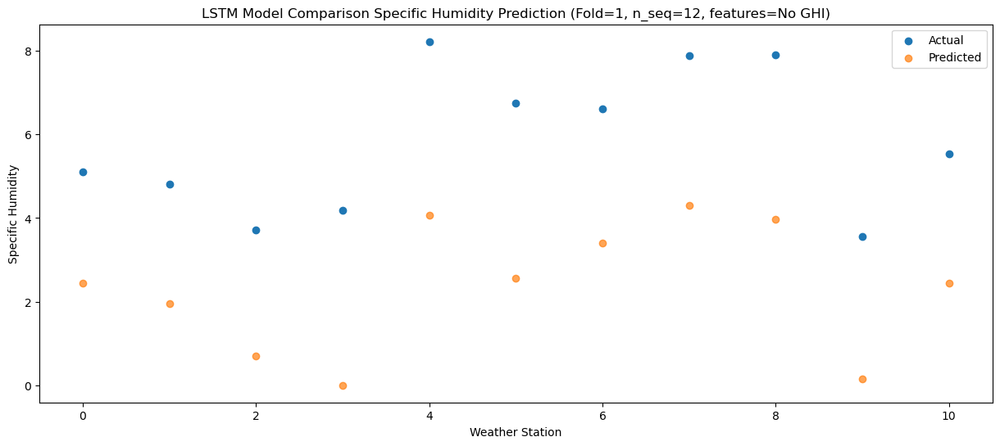

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.22   3.376697
1                 1    6.99   2.886697
2                 2    6.35   1.636697
3                 3    7.11   0.936697
4                 4   11.15   4.996697
5                 5    5.70   3.486697
6                 6    8.49   4.336697
7                 7    9.52   5.226697
8                 8    7.29   4.896697
9                 9    2.57   1.086697
10               10    5.42   3.376697


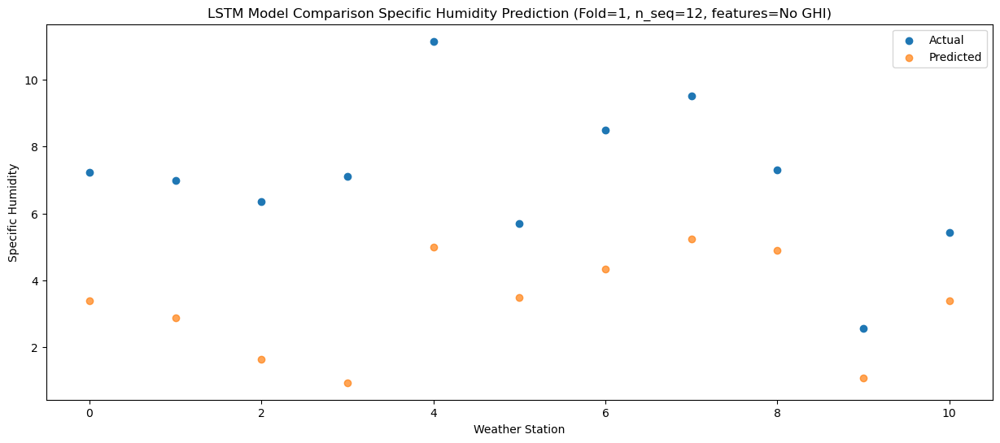

Model: "sequential_502"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1004 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1004 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1005 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1005 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1506 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1507 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1508 (Dense)          (1, 12)                

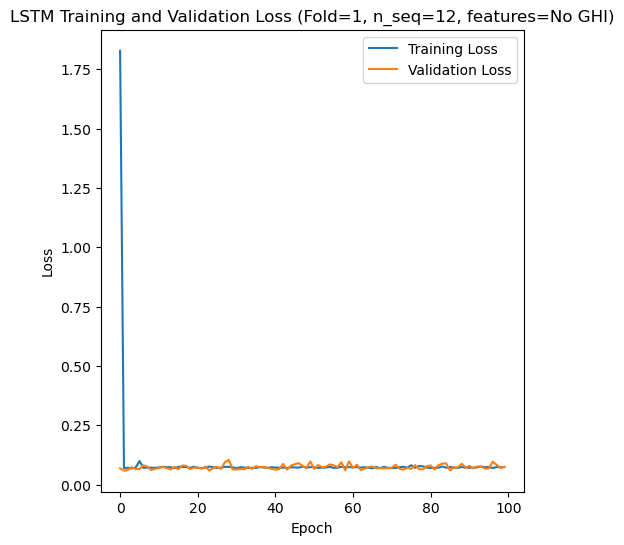

Epoch 1/100
84/84 [==============================] - 6s 26ms/step - loss: 2.0997 - accuracy: 0.5357 - mae: 1.9707 - rmse: 2.0997 - mape: 413.9724 - pearson: 0.5641 - val_loss: 0.0544 - val_accuracy: 1.0000 - val_mae: 0.0420 - val_rmse: 0.0544 - val_mape: 11.0354 - val_pearson: 0.9008
Epoch 2/100
84/84 [==============================] - 1s 12ms/step - loss: 0.0766 - accuracy: 0.7143 - mae: 0.0603 - rmse: 0.0766 - mape: 13.7625 - pearson: 0.7386 - val_loss: 0.0546 - val_accuracy: 1.0000 - val_mae: 0.0442 - val_rmse: 0.0546 - val_mape: 10.5332 - val_pearson: 0.8989
Epoch 3/100
84/84 [==============================] - 1s 11ms/step - loss: 0.0734 - accuracy: 0.7381 - mae: 0.0589 - rmse: 0.0734 - mape: 13.4502 - pearson: 0.7680 - val_loss: 0.0532 - val_accuracy: 1.0000 - val_mae: 0.0443 - val_rmse: 0.0532 - val_mape: 10.9086 - val_pearson: 0.9161
Epoch 4/100
84/84 [==============================] - 1s 11ms/step - loss: 0.0710 - accuracy: 0.7738 - mae: 0.0568 - rmse: 0.0710 - mape: 12.7917 - 

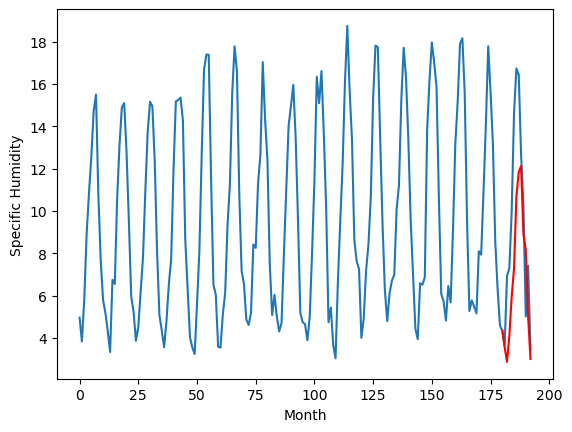

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		0.85		-0.99
1.16		0.15		-1.01
3.01		1.37		-1.64
3.13		3.23		0.10
8.25		4.58		-3.67
11.16		7.95		-3.21
12.77		9.11		-3.66
11.15		9.40		-1.75
8.33		6.16		-2.17
4.94		5.44		0.50
2.51		2.28		-0.23
1.45		0.28		-1.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 0.8473192596435546, 0.14583064556121816, 1.3669400358200072, 3.231240525245666, 4.579050912857055, 7.954784526824951, 9.111867561340333, 9.40025453209877, 6.1589584791660315, 5.436384781599045, 2.2750435912609106, 0.2826233947277075]


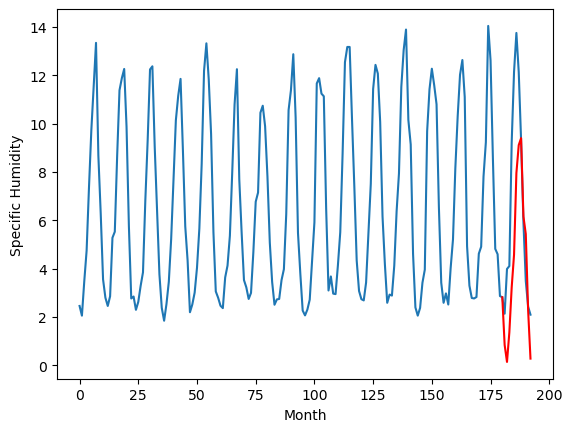

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		4.00		-1.53
7.66		3.30		-4.36
7.88		4.52		-3.36
8.85		6.38		-2.47
10.16		7.73		-2.43
13.94		11.10		-2.84
14.34		12.26		-2.08
14.96		12.55		-2.41
13.68		9.31		-4.37
11.02		8.59		-2.43
7.07		5.43		-1.64
8.47		3.43		-5.04
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.16, 3.9973192596435547, 3.2958306455612183, 4.516940035820007, 6.3812405252456665, 7.729050912857056, 11.10478452682495, 12.261867561340331, 12.55025453209877, 9.30895847916603, 8.586384781599044, 5.425043591260909, 3.432623394727706]


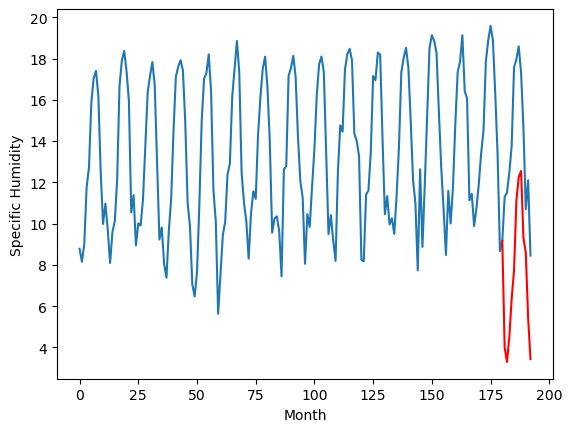

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		4.02		0.04
4.15		3.32		-0.83
4.79		4.54		-0.25
6.14		6.40		0.26
7.82		7.75		-0.07
12.42		11.12		-1.30
15.02		12.28		-2.74
15.76		12.57		-3.19
13.10		9.33		-3.77
10.14		8.61		-1.53
5.69		5.45		-0.24
5.33		3.45		-1.88
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.44, 4.017319259643554, 3.315830645561218, 4.536940035820007, 6.401240525245666, 7.749050912857055, 11.12478452682495, 12.28186756134033, 12.570254532098769, 9.32895847916603, 8.606384781599044, 5.445043591260909, 3.4526233947277056]


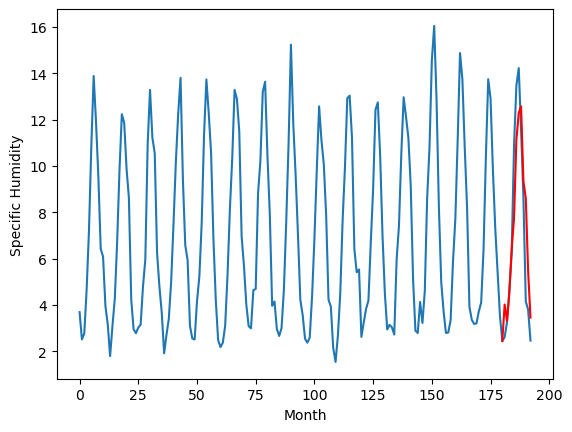

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		3.93		-1.17
5.08		3.23		-1.85
8.37		4.45		-3.92
8.39		6.31		-2.08
11.59		7.66		-3.93
15.48		11.03		-4.45
16.51		12.19		-4.32
16.11		12.48		-3.63
13.97		9.24		-4.73
11.44		8.52		-2.92
5.78		5.36		-0.42
9.06		3.36		-5.70
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.65, 3.9273192596435544, 3.225830645561218, 4.446940035820007, 6.311240525245666, 7.659050912857055, 11.03478452682495, 12.191867561340331, 12.480254532098769, 9.23895847916603, 8.516384781599044, 5.355043591260909, 3.3626233947277058]


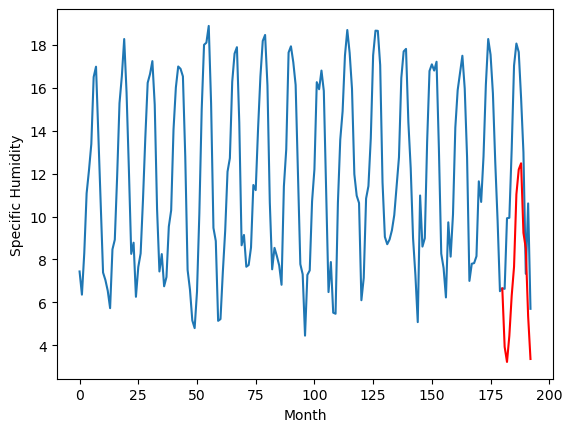

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		1.42		-0.91
2.28		0.72		-1.56
5.27		1.94		-3.33
6.84		3.80		-3.04
11.67		5.15		-6.52
14.31		8.52		-5.79
13.27		9.68		-3.59
13.40		9.97		-3.43
9.84		6.73		-3.11
8.25		6.01		-2.24
4.06		2.85		-1.21
6.93		0.85		-6.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.19, 1.4173192596435547, 0.7158306455612182, 1.9369400358200073, 3.8012405252456665, 5.149050912857056, 8.524784526824952, 9.681867561340333, 9.970254532098771, 6.728958479166032, 6.006384781599046, 2.845043591260911, 0.8526233947277078]


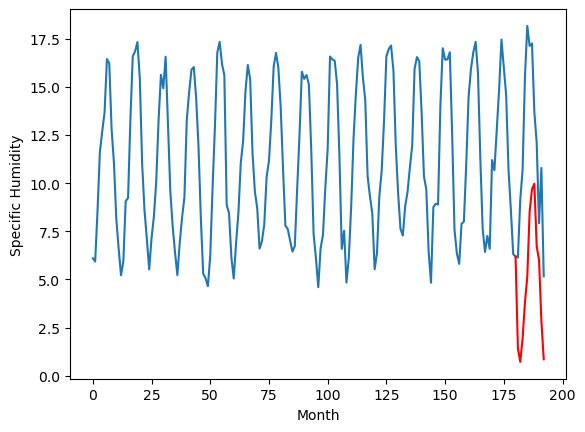

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		7.74		-0.94
8.35		7.04		-1.31
11.21		8.26		-2.95
12.53		10.12		-2.41
16.73		11.47		-5.26
20.48		14.84		-5.64
21.30		16.00		-5.30
21.68		16.29		-5.39
17.23		13.05		-4.18
14.62		12.33		-2.29
10.63		9.17		-1.46
13.13		7.17		-5.96
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.78, 7.737319259643554, 7.035830645561218, 8.256940035820007, 10.121240525245666, 11.469050912857055, 14.84478452682495, 16.001867561340333, 16.29025453209877, 13.048958479166032, 12.326384781599046, 9.165043591260911, 7.172623394727708]


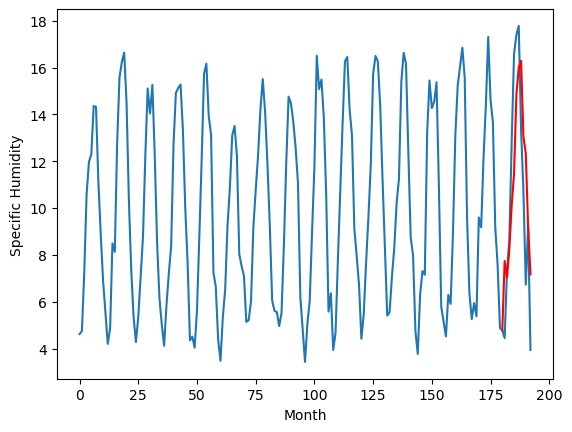

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		2.65		-1.32
3.84		1.95		-1.89
3.93		3.17		-0.76
4.23		5.03		0.80
4.35		6.38		2.03
7.01		9.75		2.74
12.25		10.91		-1.34
12.54		11.20		-1.34
9.78		7.96		-1.82
6.07		7.24		1.17
4.42		4.08		-0.34
4.55		2.08		-2.47
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 2.6473192596435546, 1.9458306455612182, 3.1669400358200073, 5.031240525245666, 6.379050912857055, 9.75478452682495, 10.911867561340332, 11.20025453209877, 7.95895847916603, 7.236384781599044, 4.0750435912609095, 2.0826233947277064]


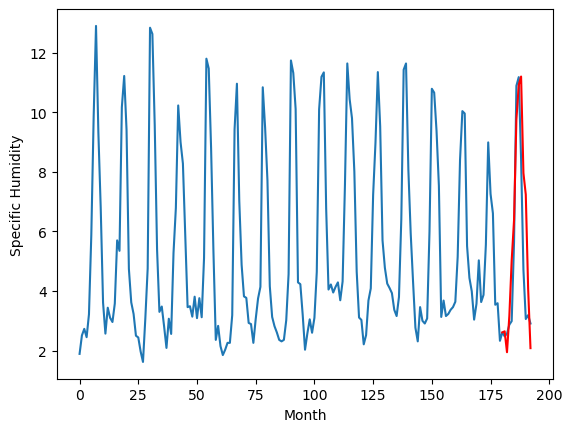

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		6.40		-1.89
8.82		5.70		-3.12
8.93		6.92		-2.01
10.25		8.78		-1.47
11.73		10.13		-1.60
12.98		13.50		0.52
14.13		14.66		0.53
13.53		14.95		1.42
13.07		11.71		-1.36
10.27		10.99		0.72
9.73		7.83		-1.90
9.55		5.83		-3.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.6, 6.397319259643555, 5.695830645561219, 6.916940035820008, 8.781240525245668, 10.129050912857057, 13.504784526824952, 14.661867561340333, 14.950254532098771, 11.708958479166032, 10.986384781599046, 7.825043591260911, 5.832623394727708]


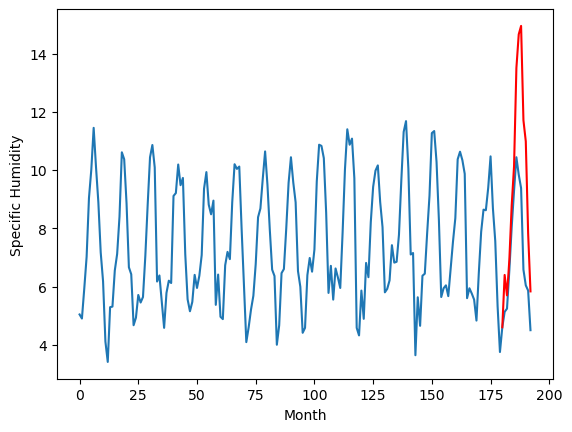

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		5.06		-0.92
6.05		4.36		-1.69
7.78		5.58		-2.20
8.31		7.44		-0.87
11.02		8.79		-2.23
15.52		12.16		-3.36
17.04		13.32		-3.72
17.62		13.61		-4.01
14.02		10.37		-3.65
11.86		9.65		-2.21
6.30		6.49		0.19
8.15		4.49		-3.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.27, 5.057319259643554, 4.355830645561218, 5.576940035820007, 7.441240525245666, 8.789050912857055, 12.16478452682495, 13.321867561340332, 13.61025453209877, 10.36895847916603, 9.646384781599044, 6.48504359126091, 4.4926233947277066]


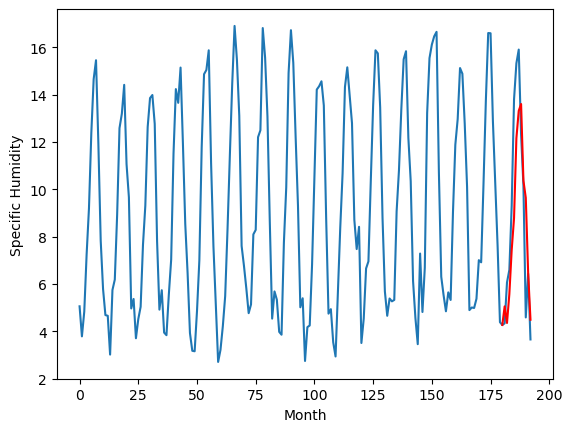

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		3.58		-1.05
4.87		2.88		-1.99
5.90		4.10		-1.80
6.51		5.96		-0.55
9.18		7.31		-1.87
13.28		10.68		-2.60
14.69		11.84		-2.85
15.08		12.13		-2.95
11.87		8.89		-2.98
10.14		8.17		-1.97
4.78		5.01		0.23
6.34		3.01		-3.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.91, 3.577319259643555, 2.8758306455612184, 4.096940035820007, 5.961240525245667, 7.309050912857056, 10.684784526824952, 11.841867561340333, 12.130254532098771, 8.888958479166032, 8.166384781599046, 5.005043591260911, 3.012623394727708]


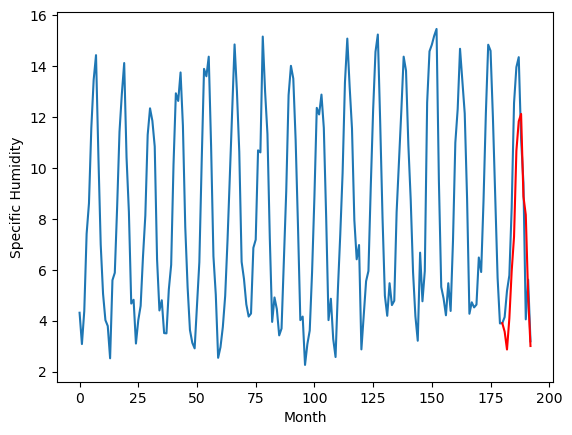

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[3.577319259643555, 0.8473192596435546, 3.9973192596435547, 4.017319259643554, 3.9273192596435544, 1.4173192596435547, 7.737319259643554, 2.6473192596435546, 6.397319259643555, 5.057319259643554, 3.577319259643555]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   3.577319
1                 1    1.84   0.847319
2                 2    5.53   3.997319
3                 3    3.98   4.017319
4                 4    5.10   3.927319
5                 5    2.33   1.417319
6                 6    8.68   7.737319
7                 7    3.97   2.647319
8                 8    8.29   6.397319
9                 9    5.98   5.057319
10               10    4.63   3.577319


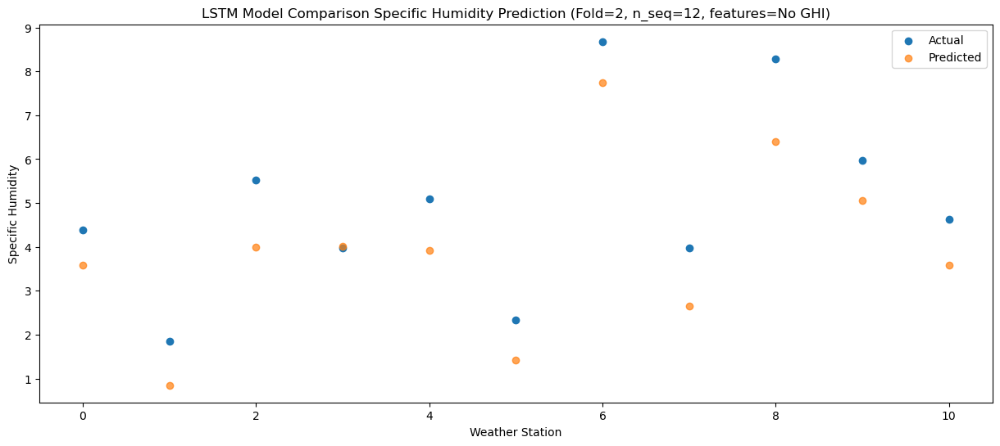

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   2.875831
1                 1    1.16   0.145831
2                 2    7.66   3.295831
3                 3    4.15   3.315831
4                 4    5.08   3.225831
5                 5    2.28   0.715831
6                 6    8.35   7.035831
7                 7    3.84   1.945831
8                 8    8.82   5.695831
9                 9    6.05   4.355831
10               10    4.87   2.875831


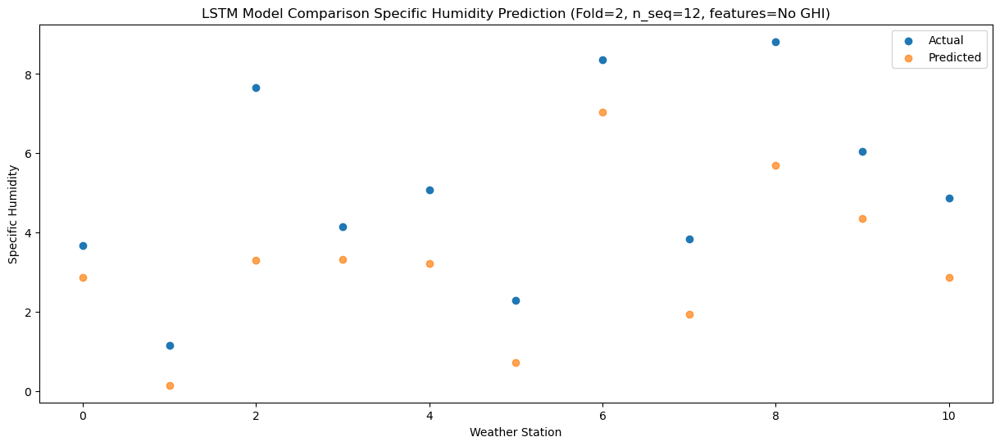

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95    4.09694
1                 1    3.01    1.36694
2                 2    7.88    4.51694
3                 3    4.79    4.53694
4                 4    8.37    4.44694
5                 5    5.27    1.93694
6                 6   11.21    8.25694
7                 7    3.93    3.16694
8                 8    8.93    6.91694
9                 9    7.78    5.57694
10               10    5.90    4.09694


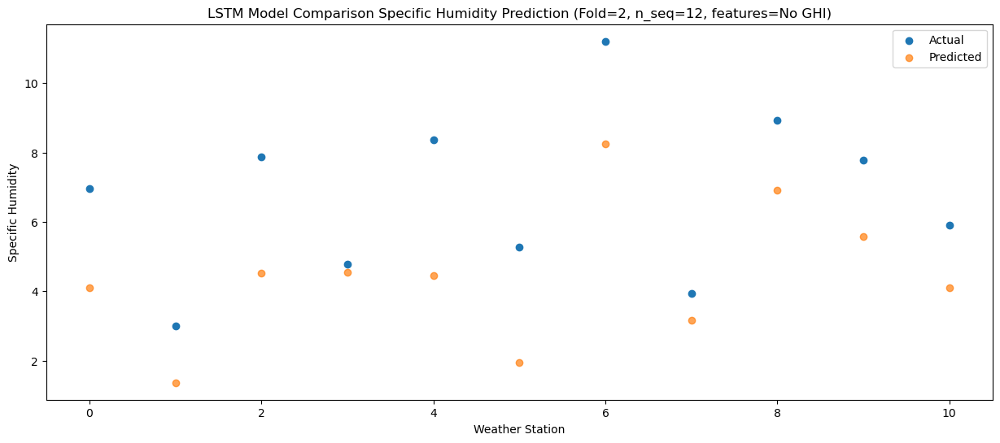

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.34   5.961241
1                 1    3.13   3.231241
2                 2    8.85   6.381241
3                 3    6.14   6.401241
4                 4    8.39   6.311241
5                 5    6.84   3.801241
6                 6   12.53  10.121241
7                 7    4.23   5.031241
8                 8   10.25   8.781241
9                 9    8.31   7.441241
10               10    6.51   5.961241


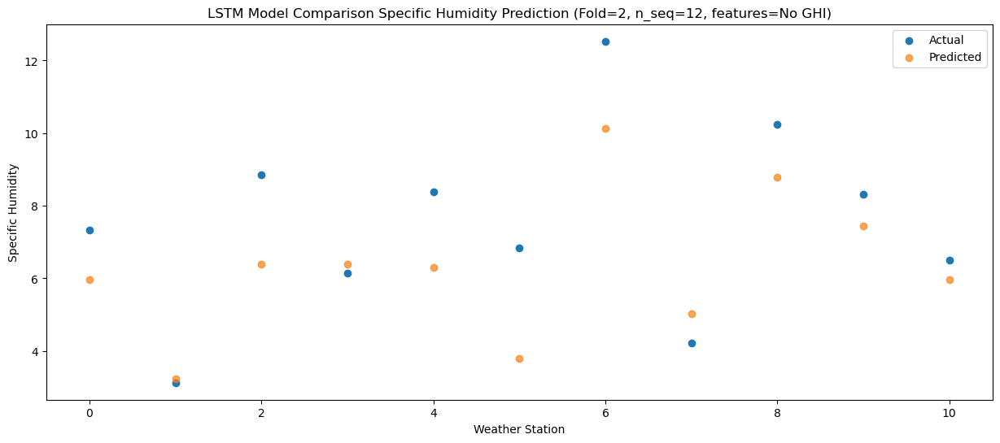

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.01   7.309051
1                 1    8.25   4.579051
2                 2   10.16   7.729051
3                 3    7.82   7.749051
4                 4   11.59   7.659051
5                 5   11.67   5.149051
6                 6   16.73  11.469051
7                 7    4.35   6.379051
8                 8   11.73  10.129051
9                 9   11.02   8.789051
10               10    9.18   7.309051


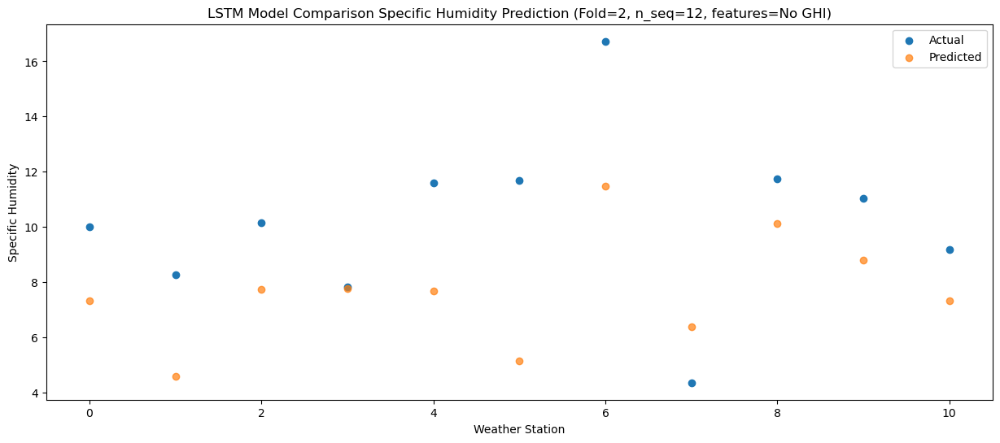

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.66  10.684785
1                 1   11.16   7.954785
2                 2   13.94  11.104785
3                 3   12.42  11.124785
4                 4   15.48  11.034785
5                 5   14.31   8.524785
6                 6   20.48  14.844785
7                 7    7.01   9.754785
8                 8   12.98  13.504785
9                 9   15.52  12.164785
10               10   13.28  10.684785


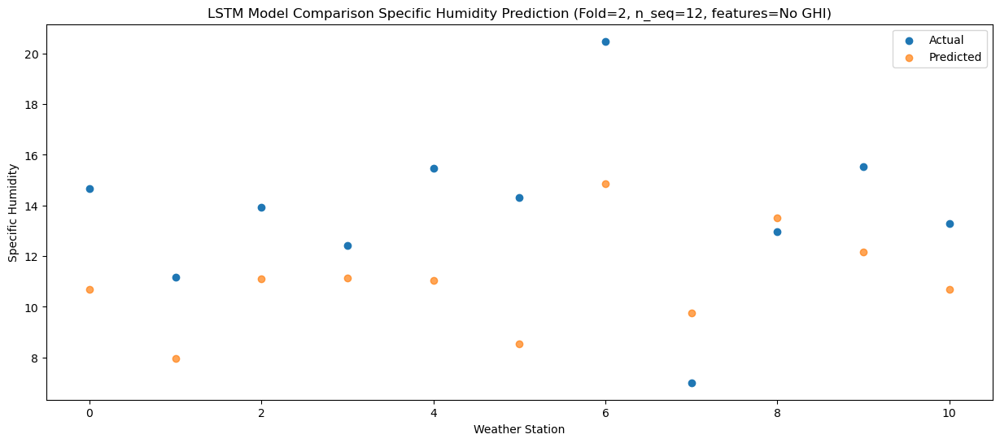

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.76  11.841868
1                 1   12.77   9.111868
2                 2   14.34  12.261868
3                 3   15.02  12.281868
4                 4   16.51  12.191868
5                 5   13.27   9.681868
6                 6   21.30  16.001868
7                 7   12.25  10.911868
8                 8   14.13  14.661868
9                 9   17.04  13.321868
10               10   14.69  11.841868


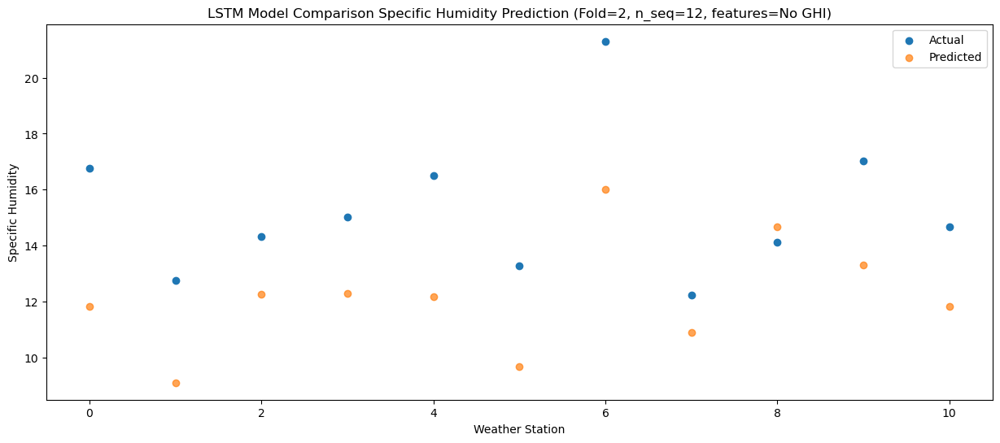

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.46  12.130255
1                 1   11.15   9.400255
2                 2   14.96  12.550255
3                 3   15.76  12.570255
4                 4   16.11  12.480255
5                 5   13.40   9.970255
6                 6   21.68  16.290255
7                 7   12.54  11.200255
8                 8   13.53  14.950255
9                 9   17.62  13.610255
10               10   15.08  12.130255


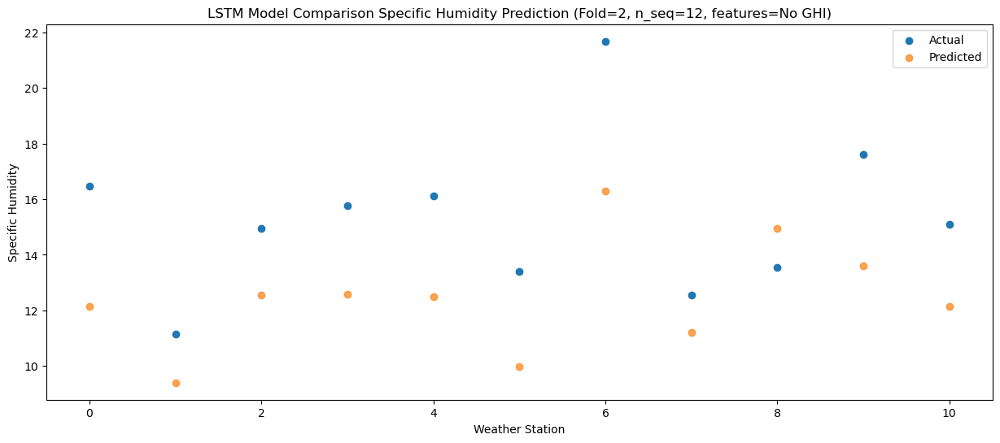

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.69   8.888958
1                 1    8.33   6.158958
2                 2   13.68   9.308958
3                 3   13.10   9.328958
4                 4   13.97   9.238958
5                 5    9.84   6.728958
6                 6   17.23  13.048958
7                 7    9.78   7.958958
8                 8   13.07  11.708958
9                 9   14.02  10.368958
10               10   11.87   8.888958


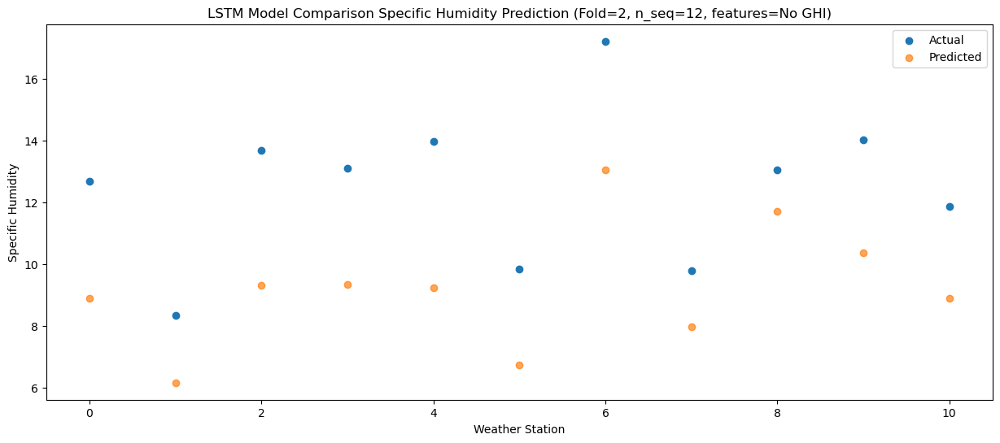

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.24   8.166385
1                 1    4.94   5.436385
2                 2   11.02   8.586385
3                 3   10.14   8.606385
4                 4   11.44   8.516385
5                 5    8.25   6.006385
6                 6   14.62  12.326385
7                 7    6.07   7.236385
8                 8   10.27  10.986385
9                 9   11.86   9.646385
10               10   10.14   8.166385


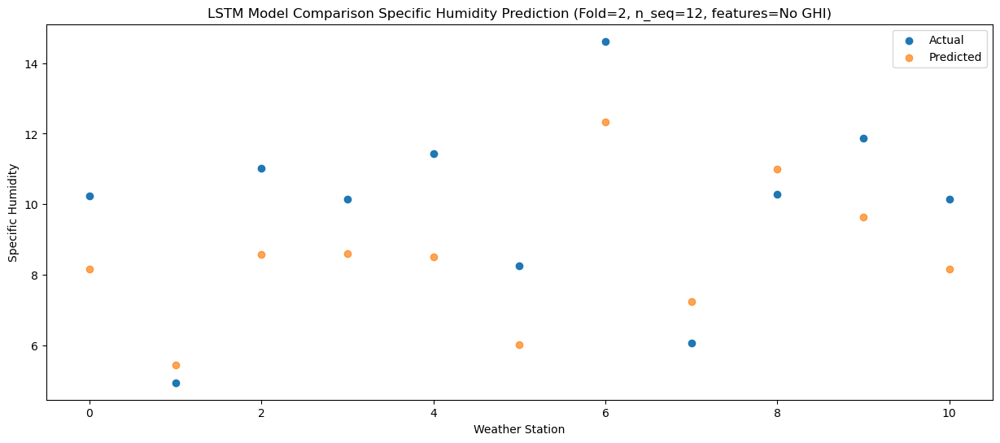

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.05   5.005044
1                 1    2.51   2.275044
2                 2    7.07   5.425044
3                 3    5.69   5.445044
4                 4    5.78   5.355044
5                 5    4.06   2.845044
6                 6   10.63   9.165044
7                 7    4.42   4.075044
8                 8    9.73   7.825044
9                 9    6.30   6.485044
10               10    4.78   5.005044


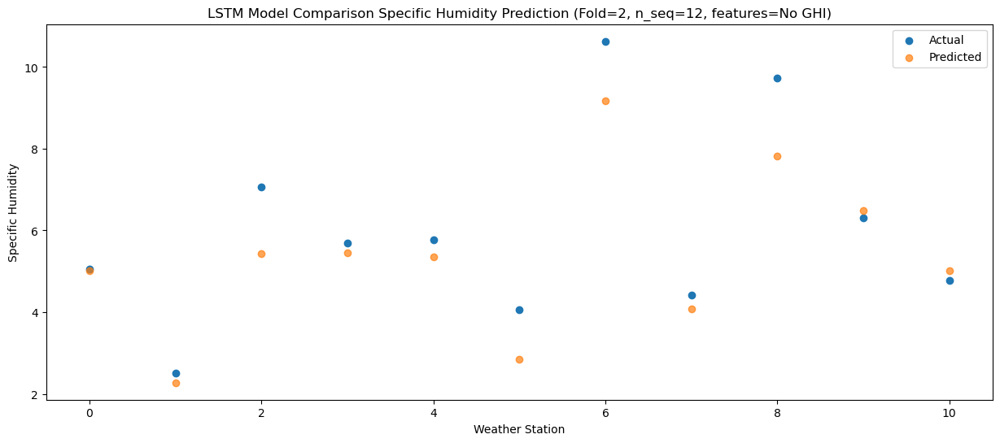

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.45   3.012623
1                 1    1.45   0.282623
2                 2    8.47   3.432623
3                 3    5.33   3.452623
4                 4    9.06   3.362623
5                 5    6.93   0.852623
6                 6   13.13   7.172623
7                 7    4.55   2.082623
8                 8    9.55   5.832623
9                 9    8.15   4.492623
10               10    6.34   3.012623


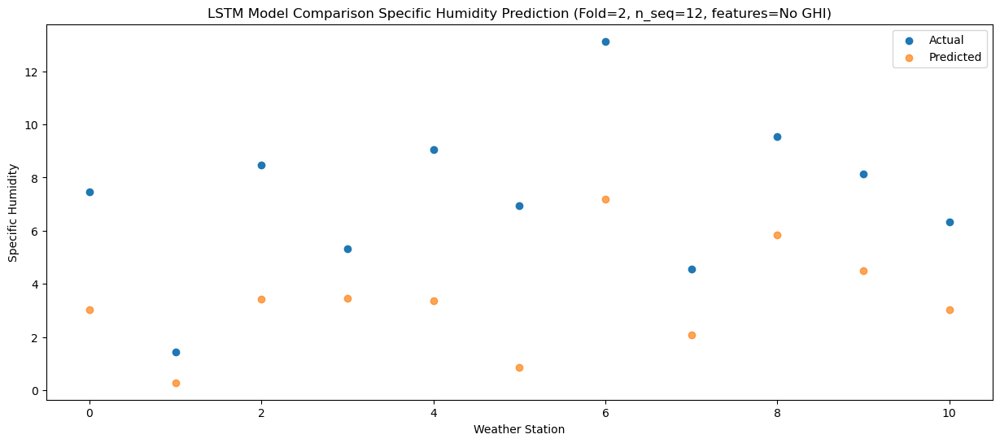

Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1006 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1006 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1007 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1007 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1509 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1510 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1511 (Dense)          (1, 12)                

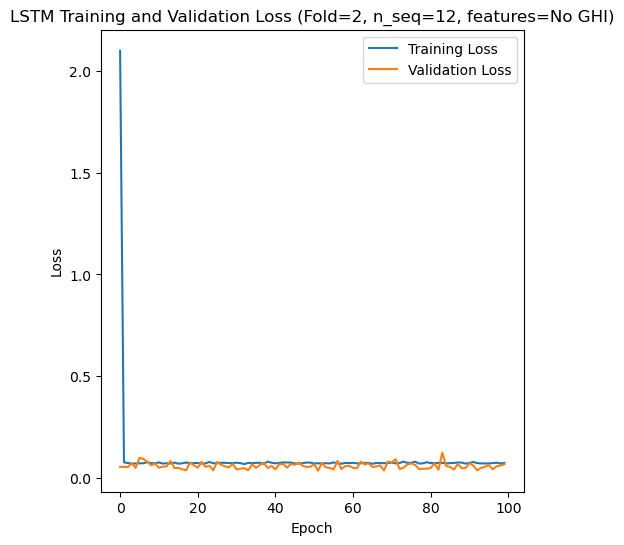

Epoch 1/100
84/84 [==============================] - 6s 26ms/step - loss: 2.0978 - accuracy: 0.5595 - mae: 1.9276 - rmse: 2.0978 - mape: 421.5627 - pearson: 0.6006 - val_loss: 0.0909 - val_accuracy: 0.9000 - val_mae: 0.0722 - val_rmse: 0.0909 - val_mape: 15.3269 - val_pearson: 0.7042
Epoch 2/100
84/84 [==============================] - 1s 12ms/step - loss: 0.0698 - accuracy: 0.6429 - mae: 0.0559 - rmse: 0.0698 - mape: 12.4025 - pearson: 0.7987 - val_loss: 0.0832 - val_accuracy: 0.9000 - val_mae: 0.0650 - val_rmse: 0.0832 - val_mape: 13.8894 - val_pearson: 0.7229
Epoch 3/100
84/84 [==============================] - 1s 13ms/step - loss: 0.0691 - accuracy: 0.6786 - mae: 0.0557 - rmse: 0.0691 - mape: 12.6686 - pearson: 0.7980 - val_loss: 0.0721 - val_accuracy: 0.9000 - val_mae: 0.0582 - val_rmse: 0.0721 - val_mape: 12.9408 - val_pearson: 0.7437
Epoch 4/100
84/84 [==============================] - 1s 13ms/step - loss: 0.0679 - accuracy: 0.7024 - mae: 0.0544 - rmse: 0.0679 - mape: 11.9506 - 

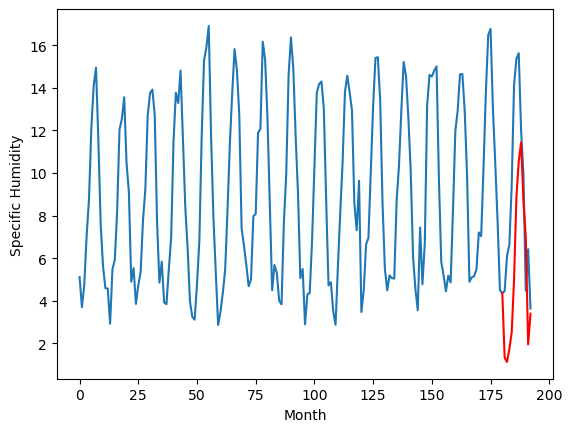

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.37		-0.27
2.08		2.17		0.09
4.59		2.77		-1.82
5.76		3.55		-2.21
9.28		6.02		-3.26
13.81		9.90		-3.91
14.69		11.59		-3.10
14.86		12.48		-2.38
10.89		9.72		-1.17
8.70		8.04		-0.66
4.27		2.99		-1.28
5.24		4.43		-0.81
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.43, 2.365659337043762, 2.1654718923568725, 2.765593867301941, 3.549519519805908, 6.018717031478882, 9.895966033935547, 11.594166021347046, 12.478900532722474, 9.717185120582581, 8.041399340629578, 2.986338953971863, 4.431217532157898]


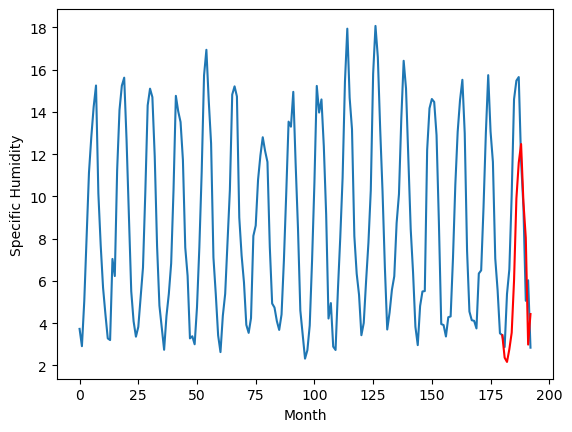

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		5.57		-0.80
6.31		5.37		-0.94
6.39		5.97		-0.42
7.01		6.75		-0.26
7.41		9.22		1.81
9.86		13.10		3.24
10.56		14.79		4.23
10.09		15.68		5.59
8.80		12.92		4.12
7.66		11.24		3.58
8.24		6.19		-2.05
6.74		7.63		0.89
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.43, 5.565659337043762, 5.365471892356872, 5.965593867301941, 6.749519519805908, 9.218717031478882, 13.095966033935547, 14.794166021347046, 15.678900532722473, 12.91718512058258, 11.241399340629577, 6.1863389539718625, 7.631217532157898]


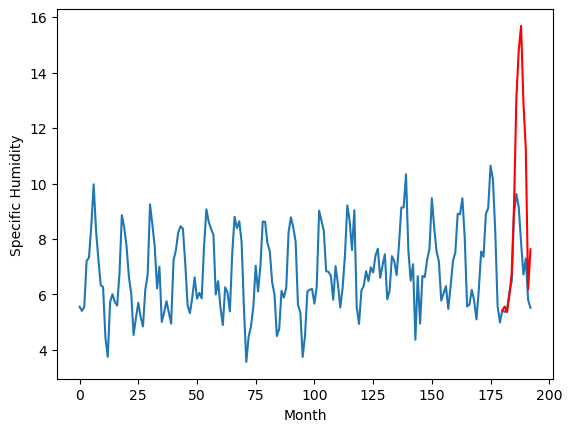

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.35		-0.09
3.37		3.15		-0.22
4.67		3.75		-0.92
5.86		4.53		-1.33
8.39		7.00		-1.39
13.81		10.88		-2.93
14.44		12.57		-1.87
15.32		13.46		-1.86
11.85		10.70		-1.15
9.79		9.02		-0.77
4.10		3.97		-0.13
5.24		5.41		0.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.21, 3.345659337043762, 3.1454718923568725, 3.745593867301941, 4.529519519805908, 6.998717031478882, 10.875966033935548, 12.574166021347047, 13.458900532722474, 10.697185120582581, 9.021399340629578, 3.9663389539718636, 5.411217532157899]


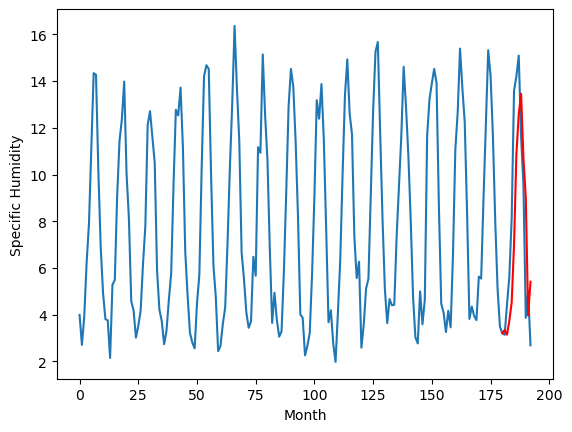

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		4.75		-0.16
4.08		4.55		0.47
6.56		5.15		-1.41
7.62		5.93		-1.69
10.04		8.40		-1.64
14.50		12.28		-2.22
16.45		13.97		-2.48
16.54		14.86		-1.68
12.77		12.10		-0.67
10.82		10.42		-0.40
5.70		5.37		-0.33
6.40		6.81		0.41
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.04, 4.7456593370437625, 4.545471892356873, 5.145593867301941, 5.9295195198059085, 8.398717031478881, 12.275966033935546, 13.974166021347045, 14.858900532722473, 12.09718512058258, 10.421399340629577, 5.366338953971862, 6.811217532157897]


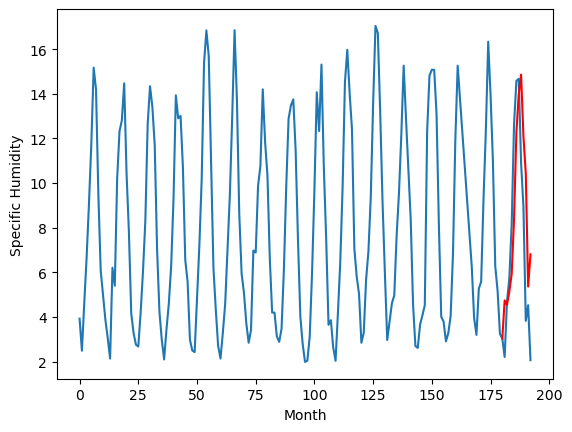

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.37		-0.05
2.90		3.17		0.27
4.93		3.77		-1.16
6.23		4.55		-1.68
8.47		7.02		-1.45
13.69		10.90		-2.79
14.94		12.59		-2.35
15.11		13.48		-1.63
11.81		10.72		-1.09
10.19		9.04		-1.15
4.32		3.99		-0.33
5.37		5.43		0.06
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.91, 3.365659337043762, 3.1654718923568725, 3.765593867301941, 4.549519519805909, 7.018717031478882, 10.895966033935547, 12.594166021347046, 13.478900532722474, 10.717185120582581, 9.041399340629578, 3.986338953971863, 5.431217532157898]


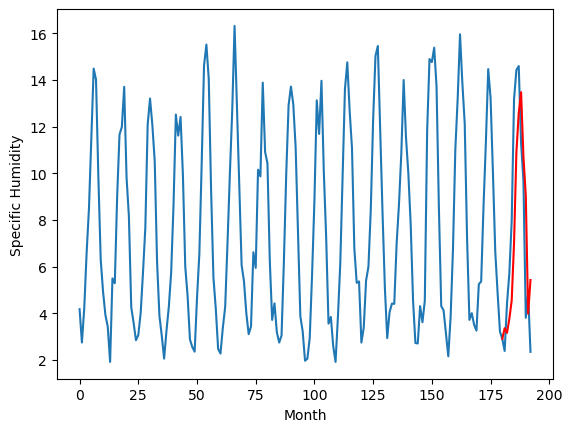

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.20		-0.53
5.79		5.00		-0.79
6.10		5.60		-0.50
6.57		6.38		-0.19
7.97		8.85		0.88
9.30		12.73		3.43
11.75		14.42		2.67
10.32		15.31		4.99
8.62		12.55		3.93
7.53		10.87		3.34
6.82		5.82		-1.00
6.11		7.26		1.15
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.6, 5.195659337043762, 4.995471892356872, 5.5955938673019405, 6.379519519805908, 8.84871703147888, 12.725966033935546, 14.424166021347045, 15.308900532722472, 12.54718512058258, 10.871399340629576, 5.8163389539718615, 7.261217532157897]


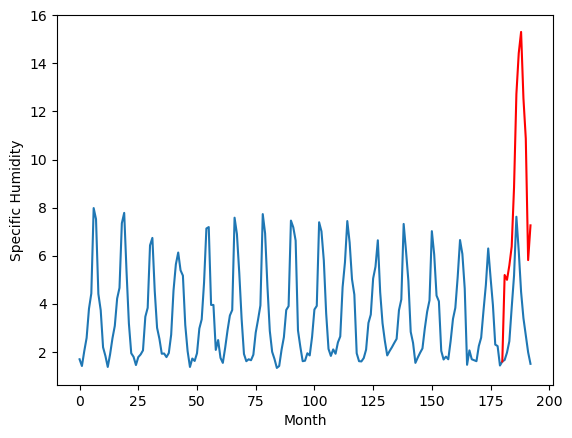

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		3.63		-1.17
4.32		3.43		-0.89
4.62		4.03		-0.59
4.31		4.81		0.50
4.87		7.28		2.41
6.29		11.16		4.87
11.65		12.85		1.20
9.22		13.74		4.52
7.50		10.98		3.48
6.40		9.30		2.90
5.13		4.25		-0.88
5.27		5.69		0.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 3.6256593370437624, 3.4254718923568728, 4.025593867301941, 4.809519519805908, 7.278717031478882, 11.155966033935547, 12.854166021347046, 13.738900532722473, 10.97718512058258, 9.301399340629578, 4.246338953971863, 5.691217532157898]


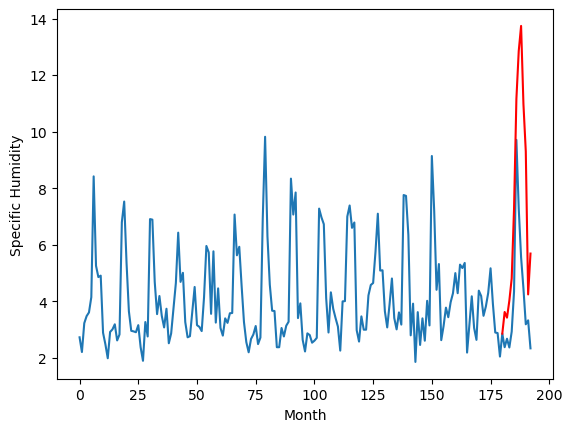

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		3.57		-1.03
4.25		3.37		-0.88
3.90		3.97		0.07
4.83		4.75		-0.08
5.27		7.22		1.95
6.70		11.10		4.40
7.18		12.79		5.61
7.57		13.68		6.11
6.93		10.92		3.99
5.90		9.24		3.34
6.12		4.19		-1.93
4.87		5.63		0.76
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.65, 3.5656593370437624, 3.3654718923568727, 3.965593867301941, 4.749519519805908, 7.2187170314788816, 11.095966033935547, 12.794166021347046, 13.678900532722473, 10.91718512058258, 9.241399340629577, 4.1863389539718625, 5.631217532157898]


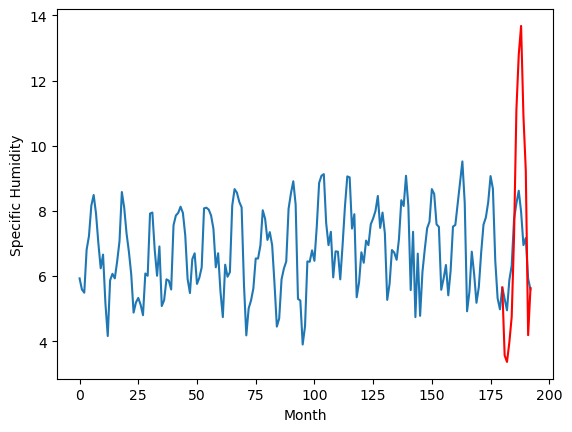

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		3.82		0.73
3.24		3.62		0.38
4.02		4.22		0.20
5.40		5.00		-0.40
6.97		7.47		0.50
11.87		11.35		-0.52
14.08		13.04		-1.04
14.46		13.93		-0.53
11.86		11.17		-0.69
9.32		9.49		0.17
4.79		4.44		-0.35
4.49		5.88		1.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.54, 3.815659337043762, 3.6154718923568723, 4.215593867301941, 4.999519519805908, 7.4687170314788816, 11.345966033935547, 13.044166021347046, 13.928900532722473, 11.16718512058258, 9.491399340629577, 4.4363389539718625, 5.881217532157898]


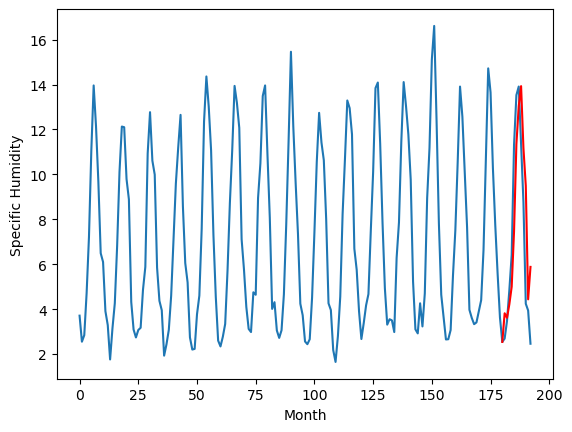

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.33		0.33
0.86		1.13		0.27
2.14		1.73		-0.41
3.55		2.51		-1.04
5.14		4.98		-0.16
10.01		8.86		-1.15
11.70		10.55		-1.15
12.02		11.44		-0.58
9.10		8.68		-0.42
7.20		7.00		-0.20
2.28		1.95		-0.33
2.18		3.39		1.21
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.51, 1.3256593370437622, 1.1254718923568725, 1.7255938673019409, 2.509519519805908, 4.978717031478881, 8.855966033935546, 10.554166021347045, 11.438900532722473, 8.67718512058258, 7.001399340629577, 1.9463389539718623, 3.3912175321578975]


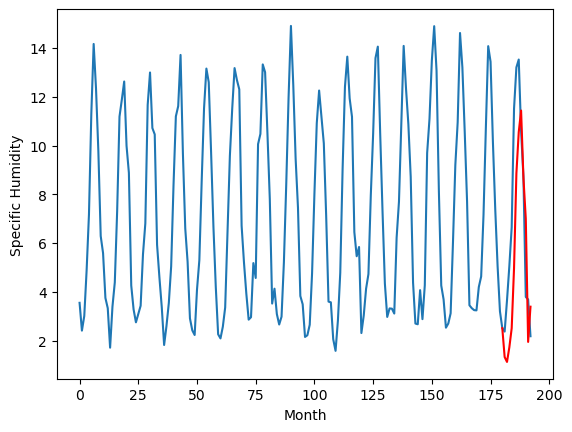

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.3256593370437622, 2.365659337043762, 5.565659337043762, 3.345659337043762, 4.7456593370437625, 3.365659337043762, 5.195659337043762, 3.6256593370437624, 3.5656593370437624, 3.815659337043762, 1.3256593370437622]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.325659
1                 1    2.64   2.365659
2                 2    6.37   5.565659
3                 3    3.44   3.345659
4                 4    4.91   4.745659
5                 5    3.42   3.365659
6                 6    5.73   5.195659
7                 7    4.80   3.625659
8                 8    4.60   3.565659
9                 9    3.09   3.815659
10               10    1.00   1.325659


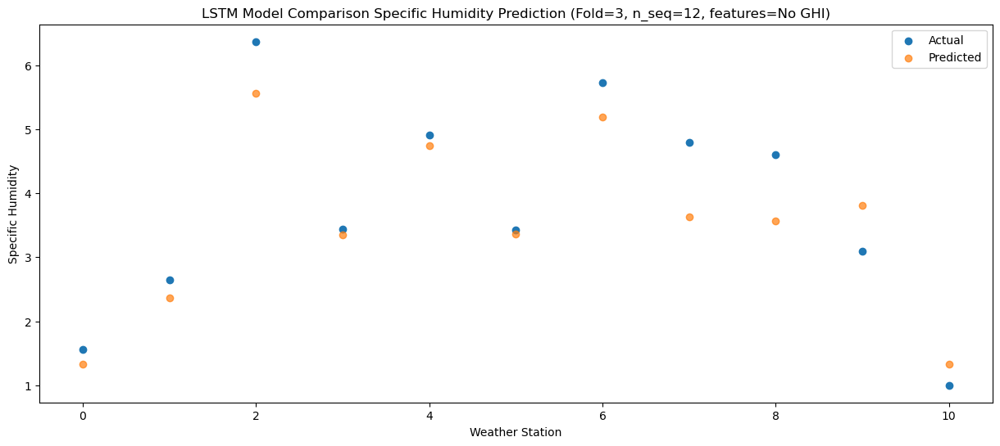

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   1.125472
1                 1    2.08   2.165472
2                 2    6.31   5.365472
3                 3    3.37   3.145472
4                 4    4.08   4.545472
5                 5    2.90   3.165472
6                 6    5.79   4.995472
7                 7    4.32   3.425472
8                 8    4.25   3.365472
9                 9    3.24   3.615472
10               10    0.86   1.125472


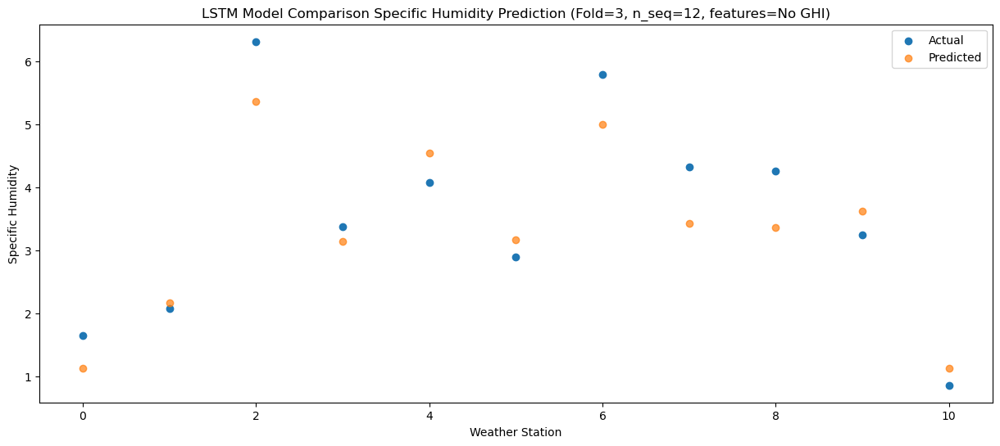

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   1.725594
1                 1    4.59   2.765594
2                 2    6.39   5.965594
3                 3    4.67   3.745594
4                 4    6.56   5.145594
5                 5    4.93   3.765594
6                 6    6.10   5.595594
7                 7    4.62   4.025594
8                 8    3.90   3.965594
9                 9    4.02   4.215594
10               10    2.14   1.725594


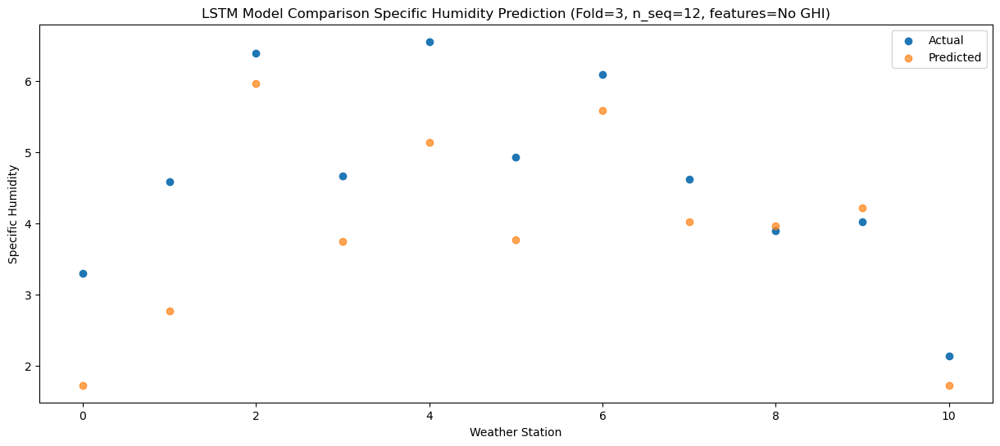

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    3.82    2.50952
1                 1    5.76    3.54952
2                 2    7.01    6.74952
3                 3    5.86    4.52952
4                 4    7.62    5.92952
5                 5    6.23    4.54952
6                 6    6.57    6.37952
7                 7    4.31    4.80952
8                 8    4.83    4.74952
9                 9    5.40    4.99952
10               10    3.55    2.50952


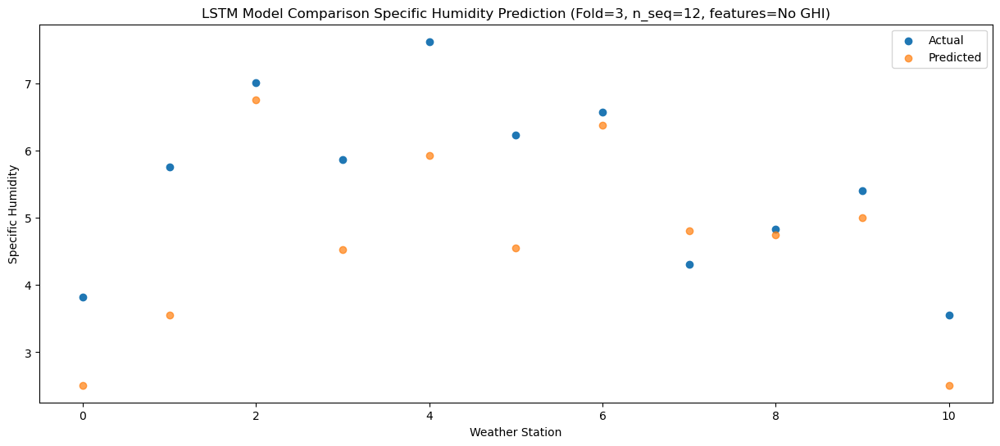

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    6.60   4.978717
1                 1    9.28   6.018717
2                 2    7.41   9.218717
3                 3    8.39   6.998717
4                 4   10.04   8.398717
5                 5    8.47   7.018717
6                 6    7.97   8.848717
7                 7    4.87   7.278717
8                 8    5.27   7.218717
9                 9    6.97   7.468717
10               10    5.14   4.978717


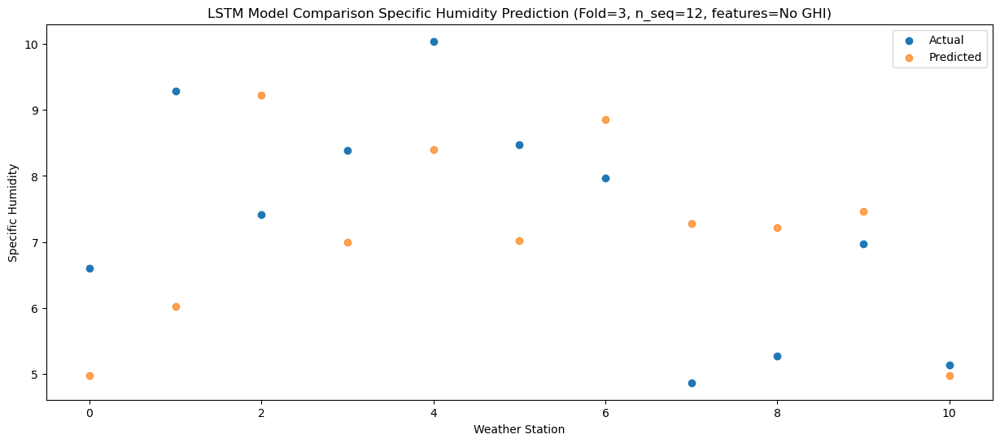

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   11.32   8.855966
1                 1   13.81   9.895966
2                 2    9.86  13.095966
3                 3   13.81  10.875966
4                 4   14.50  12.275966
5                 5   13.69  10.895966
6                 6    9.30  12.725966
7                 7    6.29  11.155966
8                 8    6.70  11.095966
9                 9   11.87  11.345966
10               10   10.01   8.855966


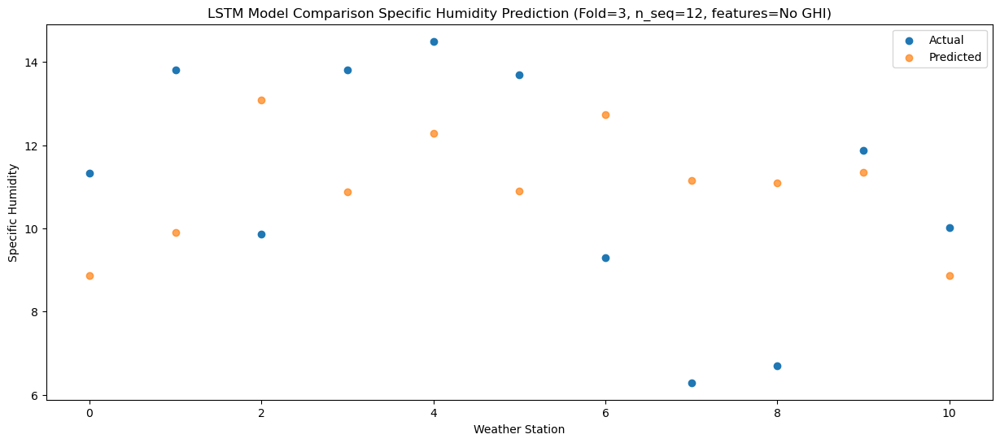

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   12.56  10.554166
1                 1   14.69  11.594166
2                 2   10.56  14.794166
3                 3   14.44  12.574166
4                 4   16.45  13.974166
5                 5   14.94  12.594166
6                 6   11.75  14.424166
7                 7   11.65  12.854166
8                 8    7.18  12.794166
9                 9   14.08  13.044166
10               10   11.70  10.554166


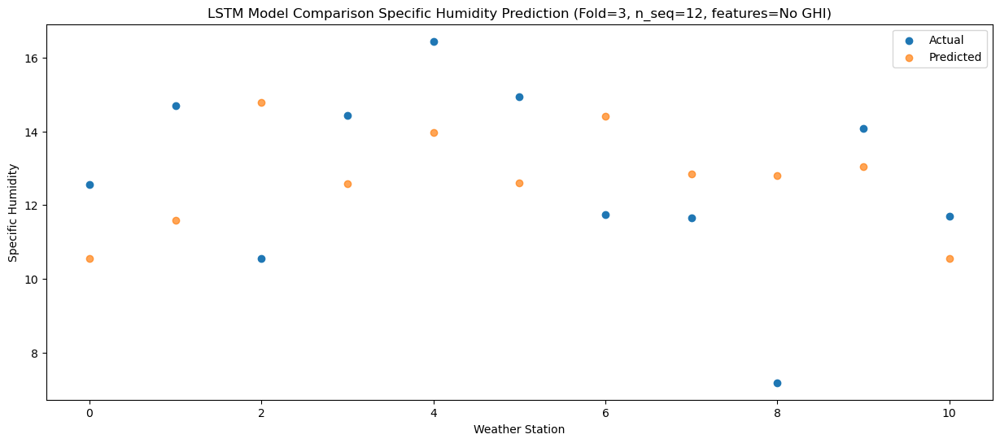

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   12.83  11.438901
1                 1   14.86  12.478901
2                 2   10.09  15.678901
3                 3   15.32  13.458901
4                 4   16.54  14.858901
5                 5   15.11  13.478901
6                 6   10.32  15.308901
7                 7    9.22  13.738901
8                 8    7.57  13.678901
9                 9   14.46  13.928901
10               10   12.02  11.438901


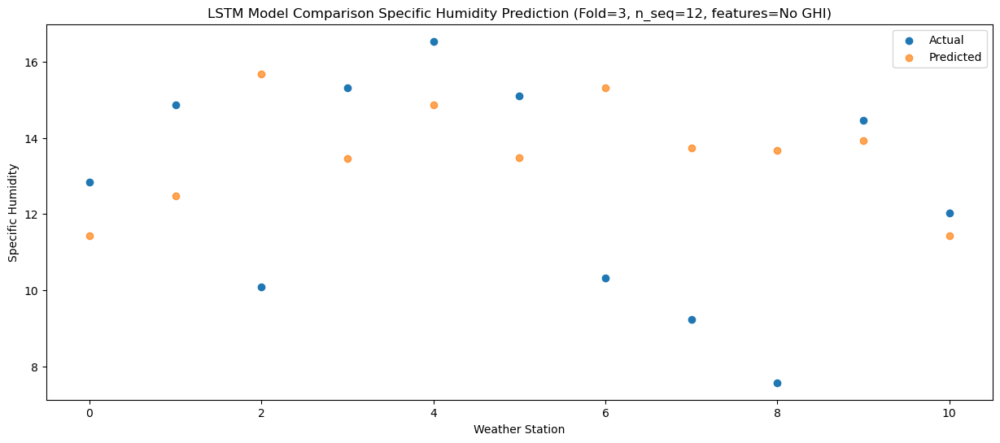

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0    9.21   8.677185
1                 1   10.89   9.717185
2                 2    8.80  12.917185
3                 3   11.85  10.697185
4                 4   12.77  12.097185
5                 5   11.81  10.717185
6                 6    8.62  12.547185
7                 7    7.50  10.977185
8                 8    6.93  10.917185
9                 9   11.86  11.167185
10               10    9.10   8.677185


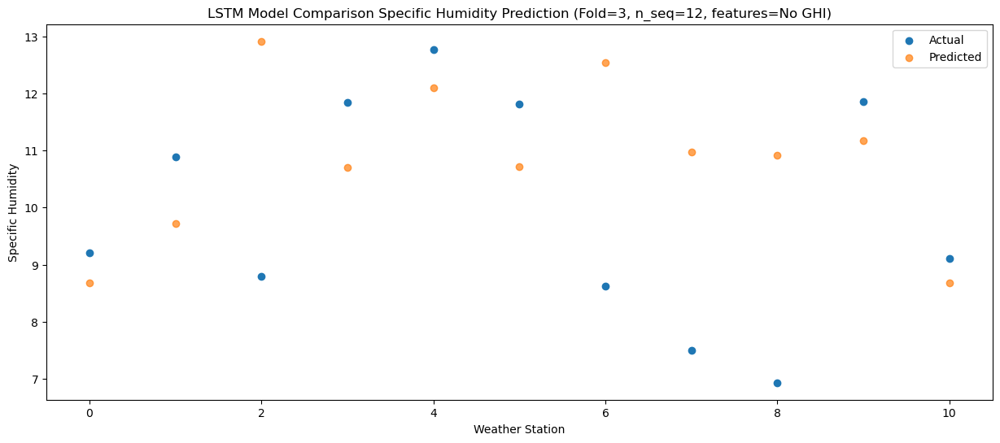

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    7.17   7.001399
1                 1    8.70   8.041399
2                 2    7.66  11.241399
3                 3    9.79   9.021399
4                 4   10.82  10.421399
5                 5   10.19   9.041399
6                 6    7.53  10.871399
7                 7    6.40   9.301399
8                 8    5.90   9.241399
9                 9    9.32   9.491399
10               10    7.20   7.001399


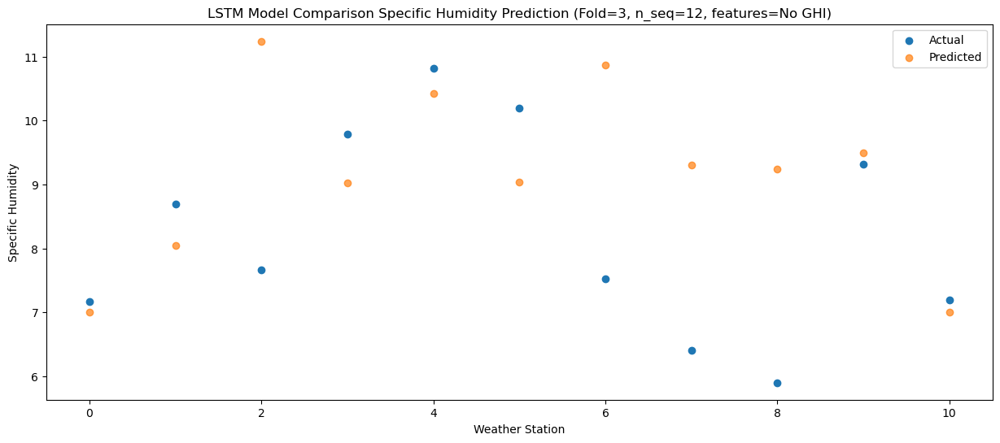

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    1.67   1.946339
1                 1    4.27   2.986339
2                 2    8.24   6.186339
3                 3    4.10   3.966339
4                 4    5.70   5.366339
5                 5    4.32   3.986339
6                 6    6.82   5.816339
7                 7    5.13   4.246339
8                 8    6.12   4.186339
9                 9    4.79   4.436339
10               10    2.28   1.946339


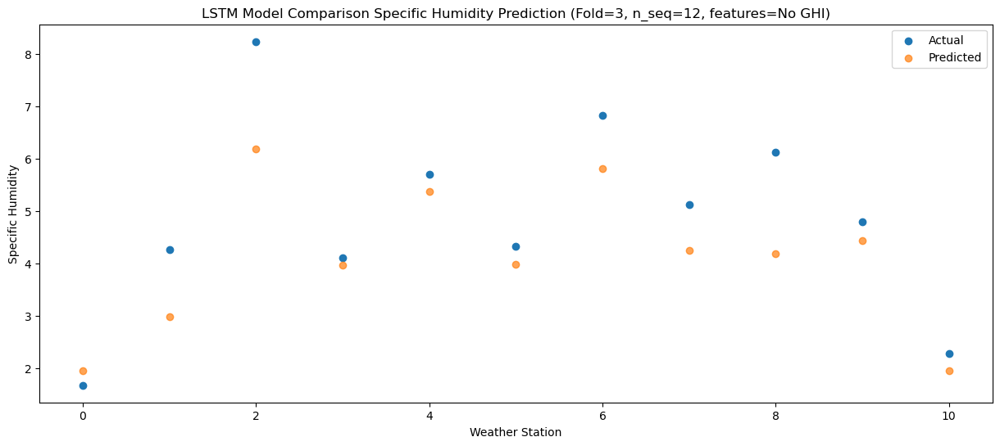

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    3.62   3.391218
1                 1    5.24   4.431218
2                 2    6.74   7.631218
3                 3    5.24   5.411218
4                 4    6.40   6.811218
5                 5    5.37   5.431218
6                 6    6.11   7.261218
7                 7    5.27   5.691218
8                 8    4.87   5.631218
9                 9    4.49   5.881218
10               10    2.18   3.391218


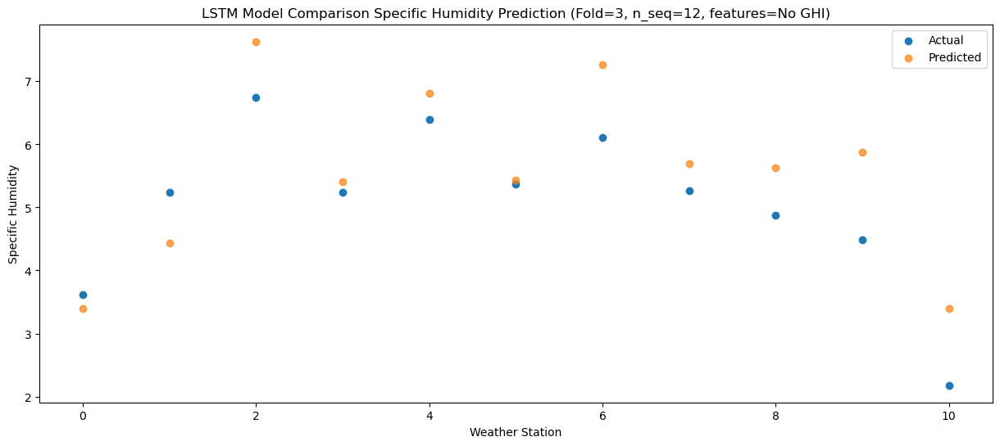

Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1008 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1008 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1009 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1009 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1512 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1513 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1514 (Dense)          (1, 12)                

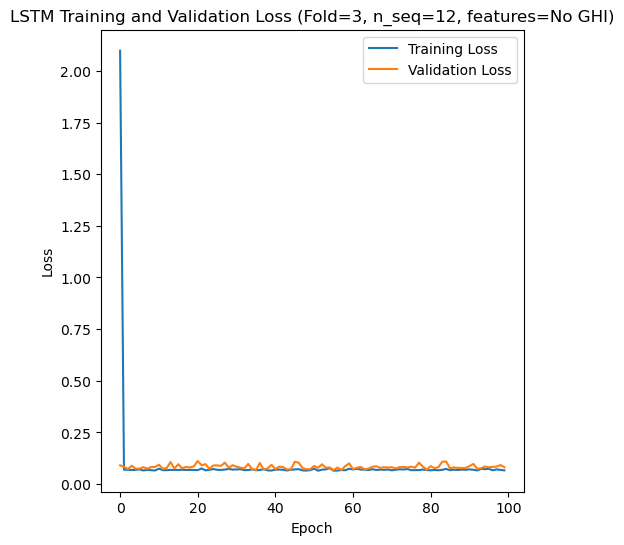

Epoch 1/100
84/84 [==============================] - 27s 96ms/step - loss: 1.8520 - accuracy: 0.4762 - mae: 1.7257 - rmse: 1.8520 - mape: 365.4133 - pearson: 0.6120 - val_loss: 0.0680 - val_accuracy: 0.8000 - val_mae: 0.0527 - val_rmse: 0.0680 - val_mape: 12.0318 - val_pearson: 0.7716
Epoch 2/100
84/84 [==============================] - 3s 38ms/step - loss: 0.0700 - accuracy: 0.7143 - mae: 0.0548 - rmse: 0.0700 - mape: 12.5717 - pearson: 0.7752 - val_loss: 0.0730 - val_accuracy: 0.8000 - val_mae: 0.0632 - val_rmse: 0.0730 - val_mape: 14.5502 - val_pearson: 0.7821
Epoch 3/100
84/84 [==============================] - 3s 36ms/step - loss: 0.0736 - accuracy: 0.7262 - mae: 0.0580 - rmse: 0.0736 - mape: 13.0213 - pearson: 0.7588 - val_loss: 0.0678 - val_accuracy: 0.8000 - val_mae: 0.0544 - val_rmse: 0.0678 - val_mape: 13.3050 - val_pearson: 0.7848
Epoch 4/100
84/84 [==============================] - 3s 35ms/step - loss: 0.0720 - accuracy: 0.7262 - mae: 0.0574 - rmse: 0.0720 - mape: 12.9109 -

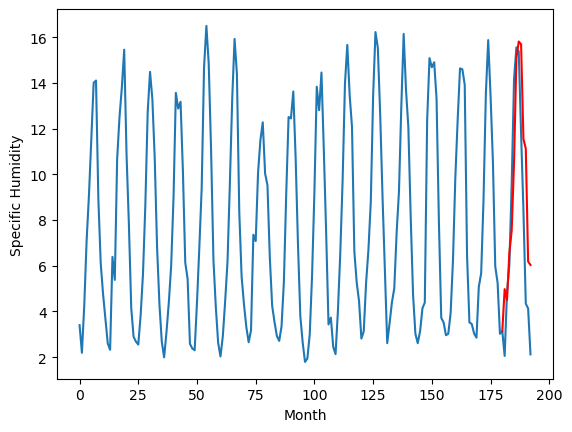

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.68		-0.59
6.26		3.20		-3.06
6.23		5.25		-0.98
6.98		6.25		-0.73
8.31		9.23		0.92
12.60		13.78		1.18
13.81		14.52		0.71
14.20		14.40		0.20
13.40		10.25		-3.15
10.48		9.83		-0.65
5.82		4.88		-0.94
7.56		4.74		-2.82
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.79, 3.676485506892204, 3.2004924994707107, 5.252075551152229, 6.2462155801057815, 9.233965871930122, 13.782950399518013, 14.519197998642921, 14.395508086383343, 10.252620494067669, 9.827392047345638, 4.882156318128109, 4.735496020019054]


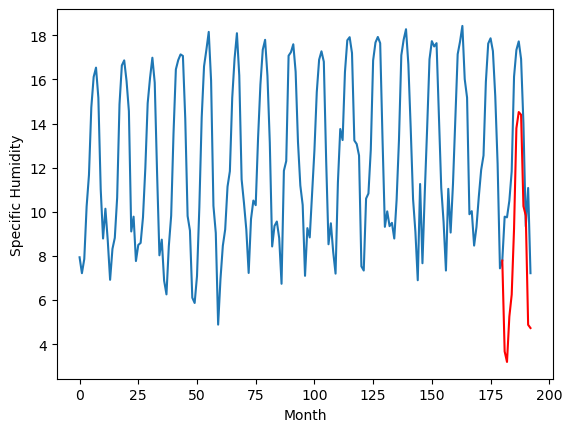

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.74		-0.13
3.75		3.26		-0.49
6.81		5.31		-1.50
7.06		6.31		-0.75
10.50		9.29		-1.21
14.74		13.84		-0.90
16.39		14.58		-1.81
16.40		14.46		-1.94
13.46		10.31		-3.15
10.68		9.89		-0.79
5.24		4.94		-0.30
8.19		4.80		-3.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.03, 3.7364855068922043, 3.2604924994707107, 5.31207555115223, 6.306215580105782, 9.293965871930123, 13.842950399518013, 14.579197998642922, 14.455508086383343, 10.31262049406767, 9.887392047345639, 4.942156318128109, 4.795496020019055]


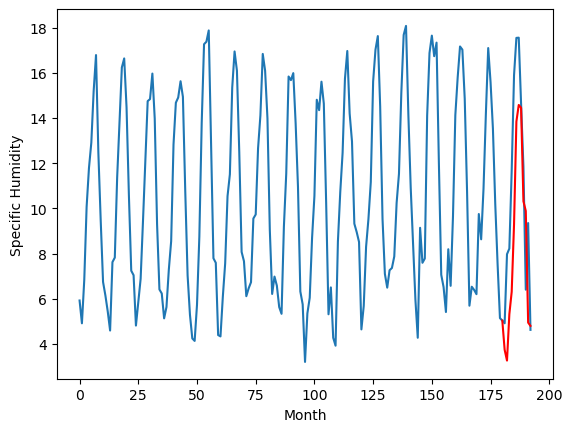

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.60		-0.13
3.41		3.12		-0.29
6.07		5.17		-0.90
7.36		6.17		-1.19
11.36		9.15		-2.21
15.05		13.70		-1.35
15.62		14.44		-1.18
16.01		14.32		-1.69
12.00		10.17		-1.83
9.15		9.75		0.60
5.53		4.80		-0.73
7.39		4.66		-2.73
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.41, 3.596485506892204, 3.1204924994707106, 5.172075551152229, 6.166215580105781, 9.153965871930122, 13.702950399518013, 14.439197998642921, 14.315508086383343, 10.172620494067669, 9.747392047345638, 4.802156318128109, 4.655496020019054]


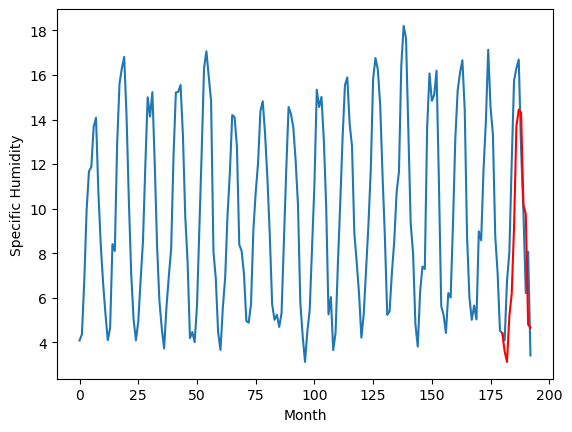

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.16		-0.20
2.91		2.68		-0.23
5.49		4.73		-0.76
6.85		5.73		-1.12
11.14		8.71		-2.43
15.02		13.26		-1.76
15.40		14.00		-1.40
15.51		13.88		-1.63
11.61		9.73		-1.88
8.88		9.31		0.43
5.27		4.36		-0.91
6.68		4.22		-2.46
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.29, 3.156485506892204, 2.6804924994707107, 4.73207555115223, 5.726215580105782, 8.713965871930123, 13.262950399518013, 13.999197998642922, 13.875508086383343, 9.73262049406767, 9.307392047345639, 4.362156318128109, 4.215496020019055]


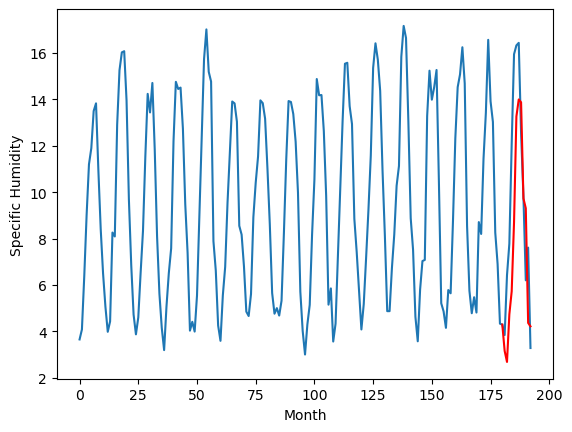

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		7.70		-0.94
8.00		7.22		-0.78
9.49		9.27		-0.22
10.45		10.27		-0.18
15.00		13.25		-1.75
17.30		17.80		0.50
18.33		18.54		0.21
18.05		18.42		0.37
14.80		14.27		-0.53
11.75		13.85		2.10
10.03		8.90		-1.13
9.18		8.76		-0.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.47, 7.696485506892205, 7.220492499470711, 9.27207555115223, 10.266215580105783, 13.253965871930124, 17.802950399518014, 18.539197998642923, 18.415508086383344, 14.27262049406767, 13.84739204734564, 8.90215631812811, 8.755496020019056]


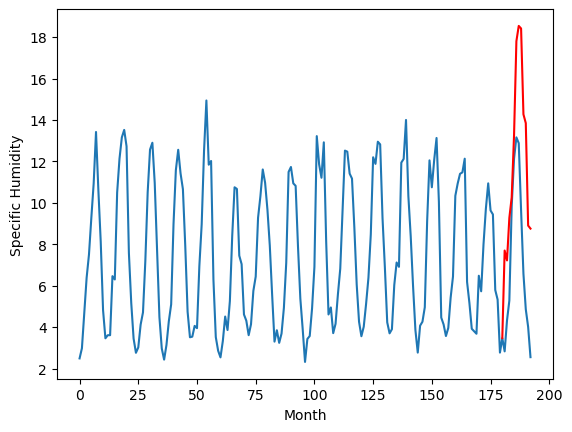

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.68		-0.12
6.05		5.20		-0.85
7.76		7.25		-0.51
8.17		8.25		0.08
11.15		11.23		0.08
15.84		15.78		-0.06
17.44		16.52		-0.92
17.82		16.40		-1.42
14.24		12.25		-1.99
12.03		11.83		-0.20
6.31		6.88		0.57
8.17		6.74		-1.43
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.52, 5.676485506892204, 5.200492499470711, 7.252075551152229, 8.246215580105781, 11.233965871930122, 15.782950399518013, 16.519197998642923, 16.395508086383344, 12.25262049406767, 11.82739204734564, 6.882156318128111, 6.735496020019056]


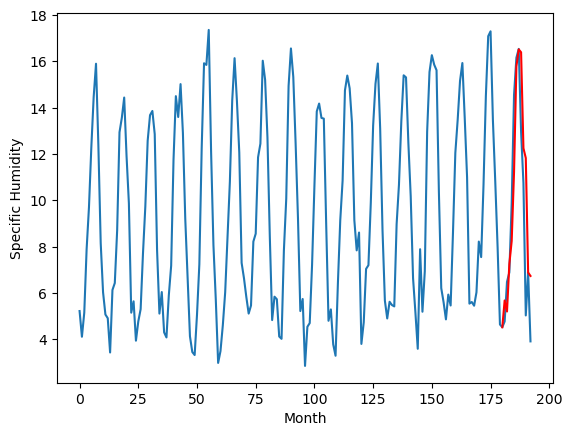

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		3.84		-0.09
3.30		3.36		0.06
5.67		5.41		-0.26
6.59		6.41		-0.18
9.75		9.39		-0.36
14.35		13.94		-0.41
15.30		14.68		-0.62
15.04		14.56		-0.48
11.78		10.41		-1.37
9.69		9.99		0.30
5.00		5.04		0.04
6.47		4.90		-1.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.4, 3.8364855068922044, 3.360492499470711, 5.412075551152229, 6.406215580105782, 9.393965871930122, 13.942950399518013, 14.679197998642922, 14.555508086383343, 10.412620494067669, 9.987392047345638, 5.042156318128109, 4.8954960200190545]


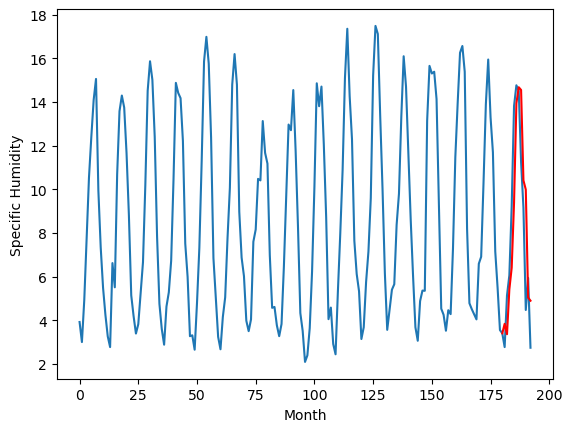

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.41		0.11
2.73		2.93		0.20
4.67		4.98		0.31
6.00		5.98		-0.02
8.29		8.96		0.67
13.35		13.51		0.16
14.61		14.25		-0.36
14.75		14.13		-0.62
11.27		9.98		-1.29
10.12		9.56		-0.56
4.35		4.61		0.26
5.06		4.47		-0.59
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 3.406485506892204, 2.9304924994707107, 4.98207555115223, 5.976215580105782, 8.963965871930123, 13.512950399518013, 14.249197998642922, 14.125508086383343, 9.98262049406767, 9.557392047345639, 4.612156318128109, 4.465496020019055]


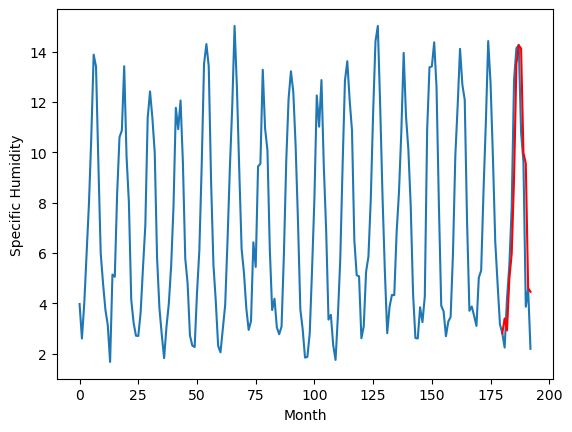

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		2.25		0.08
1.53		1.77		0.24
3.90		3.82		-0.08
5.21		4.82		-0.39
7.83		7.80		-0.03
12.58		12.35		-0.23
13.98		13.09		-0.89
14.23		12.97		-1.26
10.20		8.82		-1.38
8.33		8.40		0.07
3.04		3.45		0.41
3.58		3.31		-0.27
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 2.2464855068922045, 1.770492499470711, 3.8220755511522295, 4.816215580105782, 7.803965871930123, 12.352950399518013, 13.089197998642922, 12.965508086383343, 8.82262049406767, 8.397392047345638, 3.452156318128109, 3.3054960200190546]


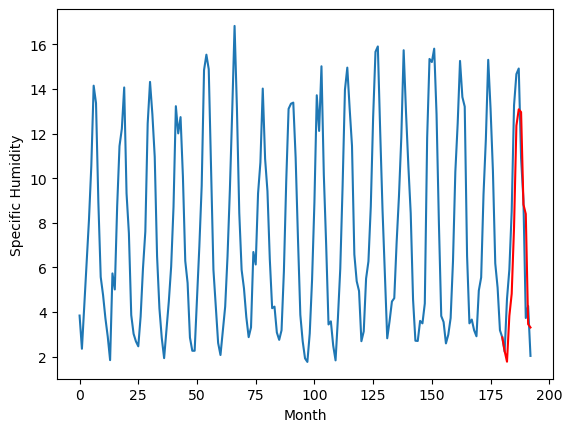

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		4.98		0.14
4.27		4.50		0.23
5.56		6.55		0.99
7.23		7.55		0.32
8.83		10.53		1.70
13.84		15.08		1.24
15.11		15.82		0.71
15.98		15.70		-0.28
12.22		11.55		-0.67
11.21		11.13		-0.08
5.97		6.18		0.21
5.93		6.04		0.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 4.976485506892204, 4.5004924994707105, 6.552075551152229, 7.546215580105781, 10.533965871930121, 15.082950399518012, 15.81919799864292, 15.695508086383342, 11.552620494067668, 11.127392047345637, 6.182156318128108, 6.035496020019053]


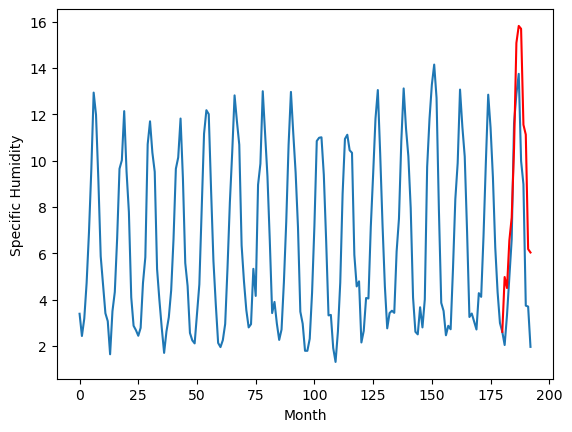

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[4.976485506892204, 3.676485506892204, 3.7364855068922043, 3.596485506892204, 3.156485506892204, 7.696485506892205, 5.676485506892204, 3.8364855068922044, 3.406485506892204, 2.2464855068922045, 4.976485506892204]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   4.976486
1                 1    4.27   3.676486
2                 2    3.87   3.736486
3                 3    3.73   3.596486
4                 4    3.36   3.156486
5                 5    8.64   7.696486
6                 6    5.80   5.676486
7                 7    3.93   3.836486
8                 8    3.30   3.406486
9                 9    2.17   2.246486
10               10    4.84   4.976486


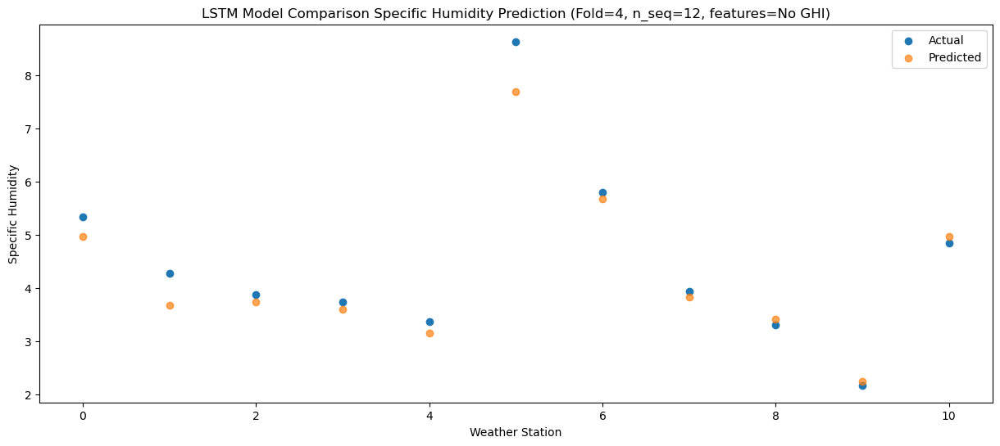

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.500492
1                 1    6.26   3.200492
2                 2    3.75   3.260492
3                 3    3.41   3.120492
4                 4    2.91   2.680492
5                 5    8.00   7.220492
6                 6    6.05   5.200492
7                 7    3.30   3.360492
8                 8    2.73   2.930492
9                 9    1.53   1.770492
10               10    4.27   4.500492


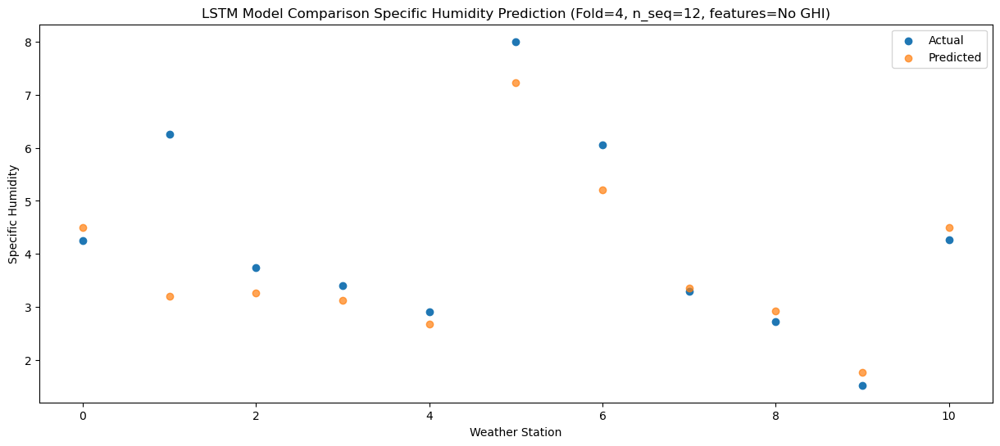

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   6.552076
1                 1    6.23   5.252076
2                 2    6.81   5.312076
3                 3    6.07   5.172076
4                 4    5.49   4.732076
5                 5    9.49   9.272076
6                 6    7.76   7.252076
7                 7    5.67   5.412076
8                 8    4.67   4.982076
9                 9    3.90   3.822076
10               10    5.56   6.552076


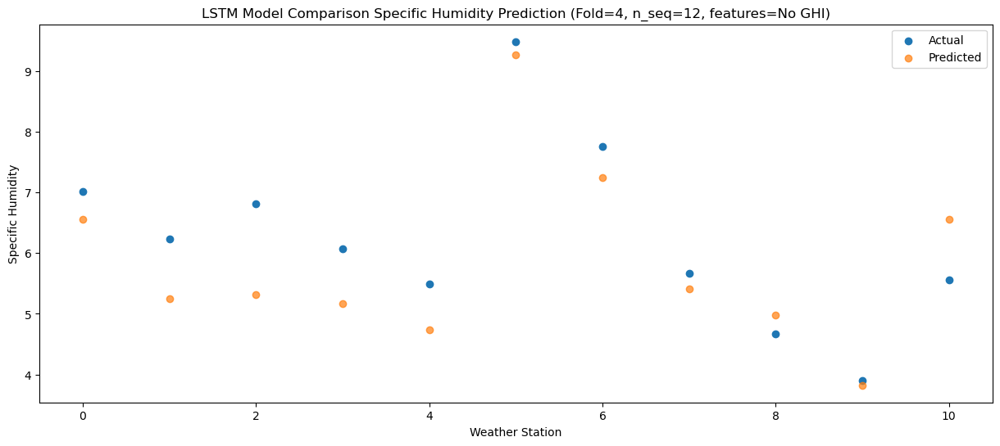

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    8.22   7.546216
1                 1    6.98   6.246216
2                 2    7.06   6.306216
3                 3    7.36   6.166216
4                 4    6.85   5.726216
5                 5   10.45  10.266216
6                 6    8.17   8.246216
7                 7    6.59   6.406216
8                 8    6.00   5.976216
9                 9    5.21   4.816216
10               10    7.23   7.546216


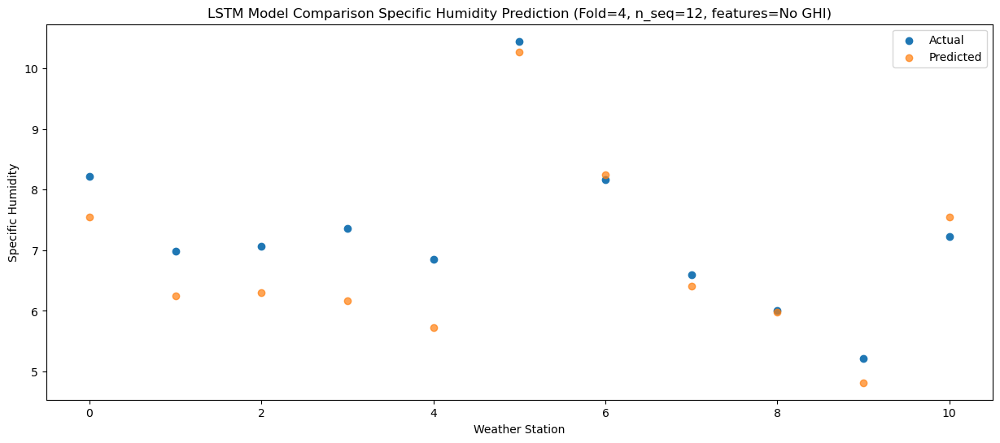

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   11.78  10.533966
1                 1    8.31   9.233966
2                 2   10.50   9.293966
3                 3   11.36   9.153966
4                 4   11.14   8.713966
5                 5   15.00  13.253966
6                 6   11.15  11.233966
7                 7    9.75   9.393966
8                 8    8.29   8.963966
9                 9    7.83   7.803966
10               10    8.83  10.533966


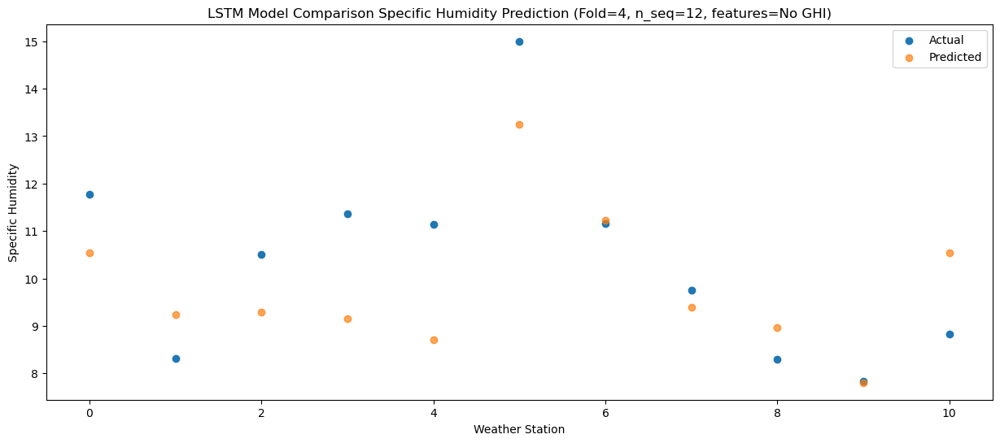

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   16.37   15.08295
1                 1   12.60   13.78295
2                 2   14.74   13.84295
3                 3   15.05   13.70295
4                 4   15.02   13.26295
5                 5   17.30   17.80295
6                 6   15.84   15.78295
7                 7   14.35   13.94295
8                 8   13.35   13.51295
9                 9   12.58   12.35295
10               10   13.84   15.08295


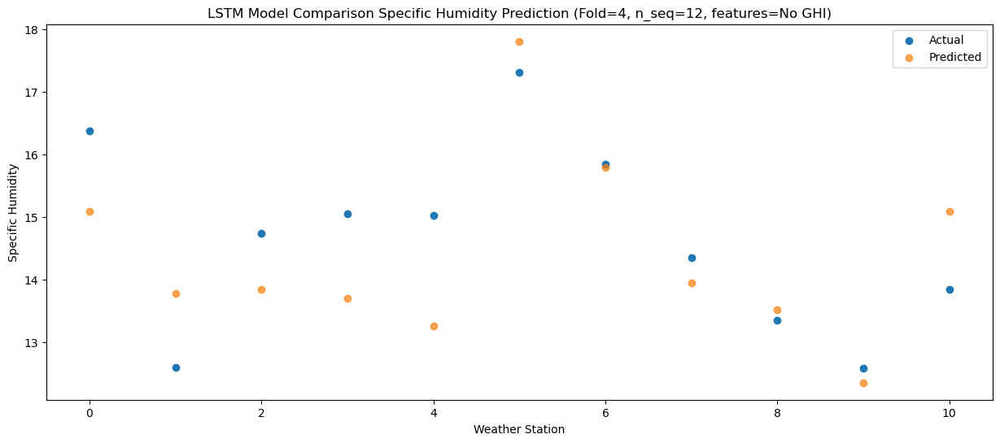

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   17.76  15.819198
1                 1   13.81  14.519198
2                 2   16.39  14.579198
3                 3   15.62  14.439198
4                 4   15.40  13.999198
5                 5   18.33  18.539198
6                 6   17.44  16.519198
7                 7   15.30  14.679198
8                 8   14.61  14.249198
9                 9   13.98  13.089198
10               10   15.11  15.819198


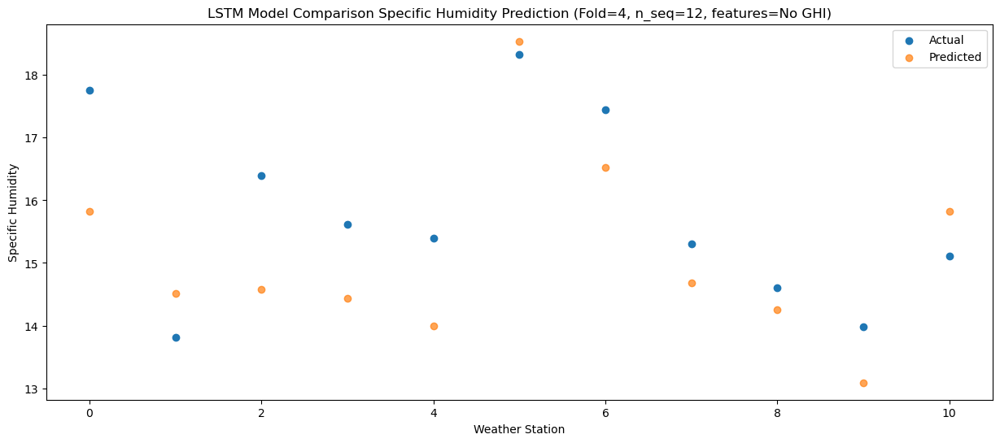

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   17.58  15.695508
1                 1   14.20  14.395508
2                 2   16.40  14.455508
3                 3   16.01  14.315508
4                 4   15.51  13.875508
5                 5   18.05  18.415508
6                 6   17.82  16.395508
7                 7   15.04  14.555508
8                 8   14.75  14.125508
9                 9   14.23  12.965508
10               10   15.98  15.695508


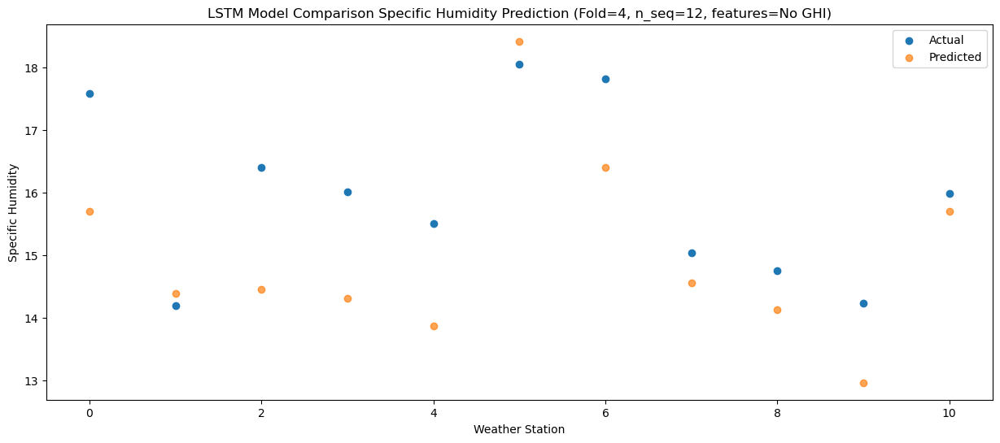

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   14.00   11.55262
1                 1   13.40   10.25262
2                 2   13.46   10.31262
3                 3   12.00   10.17262
4                 4   11.61    9.73262
5                 5   14.80   14.27262
6                 6   14.24   12.25262
7                 7   11.78   10.41262
8                 8   11.27    9.98262
9                 9   10.20    8.82262
10               10   12.22   11.55262


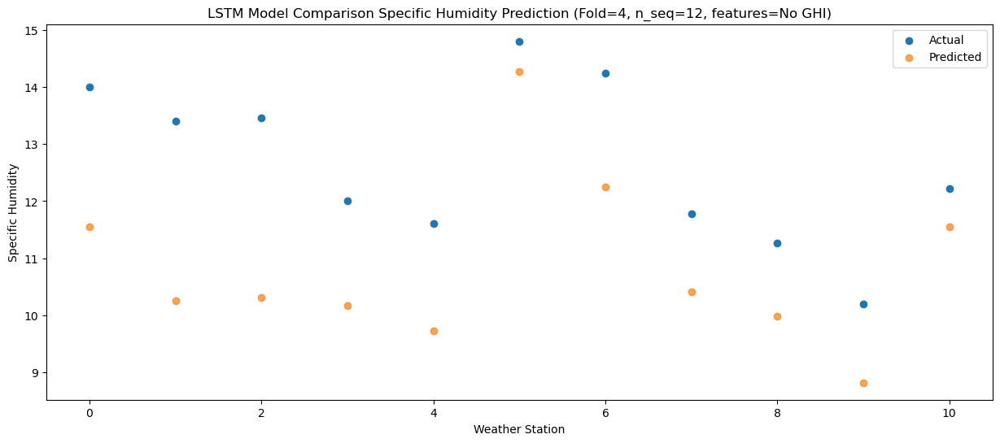

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.63  11.127392
1                 1   10.48   9.827392
2                 2   10.68   9.887392
3                 3    9.15   9.747392
4                 4    8.88   9.307392
5                 5   11.75  13.847392
6                 6   12.03  11.827392
7                 7    9.69   9.987392
8                 8   10.12   9.557392
9                 9    8.33   8.397392
10               10   11.21  11.127392


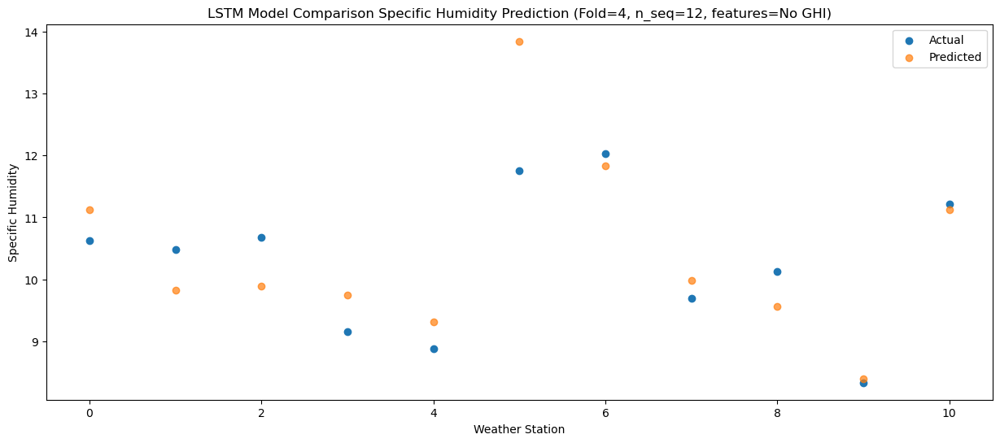

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.54   6.182156
1                 1    5.82   4.882156
2                 2    5.24   4.942156
3                 3    5.53   4.802156
4                 4    5.27   4.362156
5                 5   10.03   8.902156
6                 6    6.31   6.882156
7                 7    5.00   5.042156
8                 8    4.35   4.612156
9                 9    3.04   3.452156
10               10    5.97   6.182156


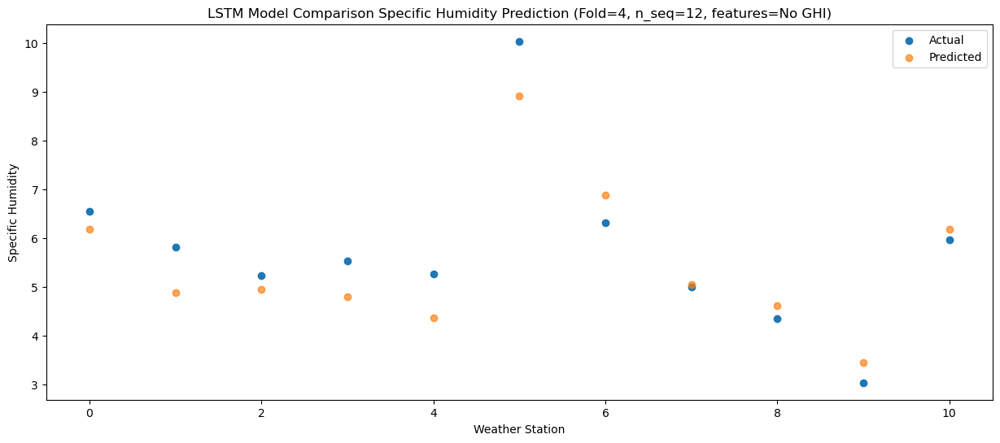

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    6.33   6.035496
1                 1    7.56   4.735496
2                 2    8.19   4.795496
3                 3    7.39   4.655496
4                 4    6.68   4.215496
5                 5    9.18   8.755496
6                 6    8.17   6.735496
7                 7    6.47   4.895496
8                 8    5.06   4.465496
9                 9    3.58   3.305496
10               10    5.93   6.035496


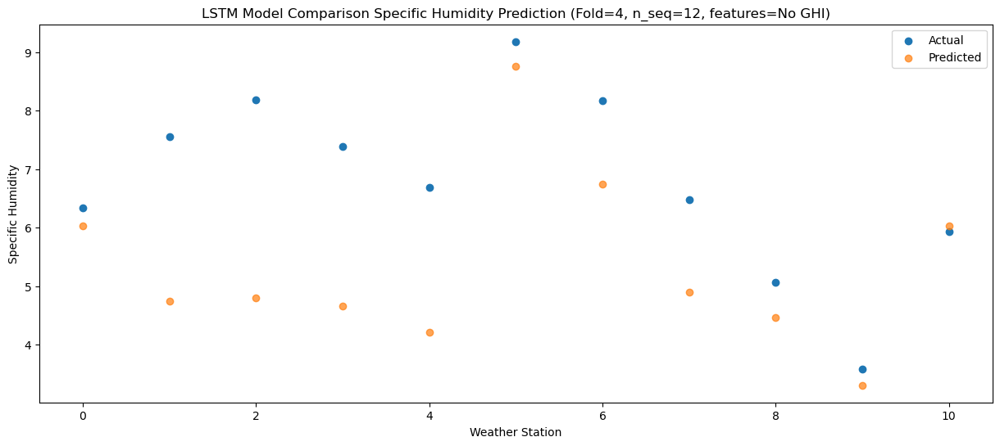

Model: "sequential_505"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1010 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1010 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1011 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1011 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1515 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1516 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1517 (Dense)          (1, 12)                

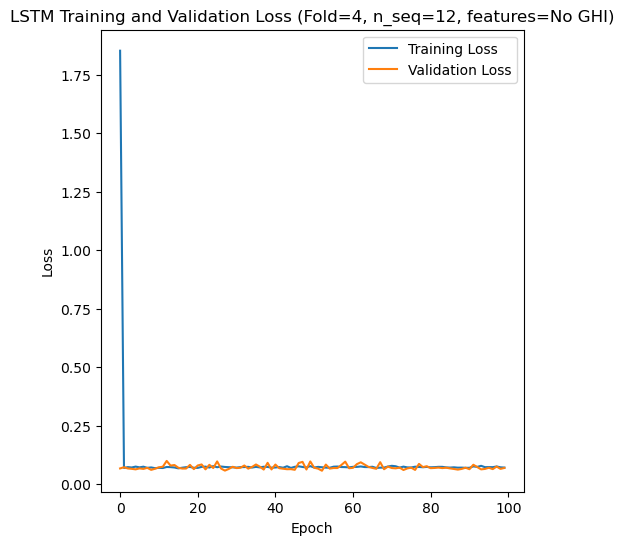

[[0.6068619869546343, 1.240886206607123, 0.8667802289455876, 1.2677335583809537, 1.1645612336314097, 1.220748939480373, 1.9946003479879324, 1.6152591207612088, 0.9282445325936172, 0.9967244208383796, 3.9171122434594476, 2.2053170748934154], [0.451981717049144, 0.9045510857716843, 1.5364587798365485, 2.017868472736121, 2.7354724715480616, 2.4161204763468813, 1.4829710662258244, 1.6150141513882272, 2.0499113698692724, 2.100372455715799, 3.5219529208319975, 4.072974611799869], [1.1435344914084478, 2.115052135179115, 2.5257443475533274, 1.686491526431839, 3.404488125081184, 3.6503790763799477, 3.4770282706739293, 3.307956175260526, 3.430026191921834, 1.9617166076912913, 0.9750829669715947, 4.255396602629323], [0.616669588164572, 0.5982870013278947, 1.0009214926024081, 1.1931095448309876, 1.7559761077807112, 3.1560893771044825, 2.846938940187116, 3.451467055503378, 2.443107475818934, 2.0488212215955364, 1.0421062789399602, 0.8083436687461432], [0.3706886107503931, 1.0128067873313742, 0.7537

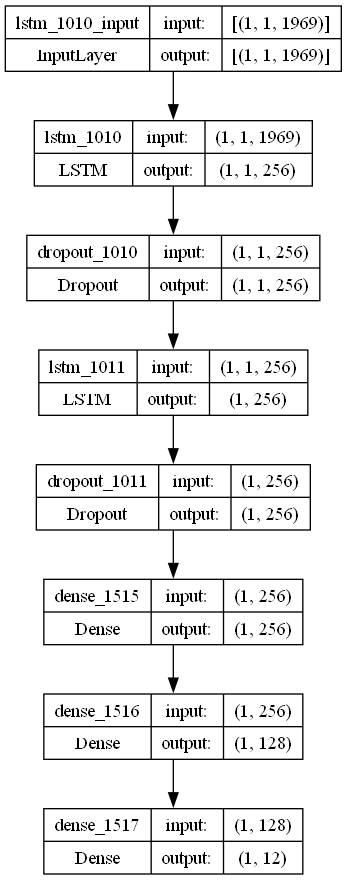

In [9]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    lr = 0.08612345896498566
    optimizer = Adam(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 256
    dropout_rate = 0.35511890797535345

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# make one forecast with an LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S12_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

In [ ]:
from matplotlib import pyplot

n_test_batch = 11
ws=0

# make forecasts
forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test_batch)

# inverse transform forecasts and test
forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
actual = [row[-n_seq:] for row in test1]
actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

rmse_list = [] # list stores root mean squared errors for each future time prediction
mae_list = [] # list stores root mean squared errors for each future time prediction
mape_list = [] # list stores root mean squared errors for each future time prediction
r2_list = [] # list stores root mean squared errors for each future time prediction
    
# evaluate forecasts
rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

# plot forecasts
dataset_df = pd.DataFrame(val_y[0])
dataset_df = dataset_df.iloc[0:11, :]
dataset_df = dataset_df.transpose()
dataset = dataset_df.values

#print(dataset_df)

#print(len(dataset))
#print(dataset)


series_ws = pd.Series(dataset[:, ws]) # Using first column (specific_humidity)
forecasts_ws = [forecasts[ws]]

print(series_ws[180:225])
print(actual[0])
print(forecasts[0])

n_test=11
print(len(series_ws))
print(series_ws[220:228])
print(len(forecasts_ws))
print(forecasts_ws)
print(n_seq)
print(n_test)

# plot forecasts
plot_forecasts(series_ws, forecasts_ws, n_test+2)

In [ ]:
# Extract the dates corresponding to the test set predictions
test_dates = df.index[-len(actual[0]):]

# Print out plots of actual and predicted values for each weather station
for j in range(11):
    print("Weather Station "+str(j+1)+":")
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'Month': test_dates,
        'Actual': actual[j],
        'Predicted': forecasts[j]
    })
            
    # Plotting the results
    plt.figure(figsize=(15, 6))
    plt.plot(results_df['Month'], results_df['Actual'], label='Actual')
    plt.plot(results_df['Month'], results_df['Predicted'], label='Predicted', alpha=0.7)
    plt.title('LSTM Model Comparison Specific Humidity Prediction')
    plt.xlabel('Month')
    plt.ylabel('Specific Humidity')
    plt.legend()
    plt.show()

    # Plot model architecture
    filename = "lstm_model_optimized_ws_"+str(j)+".png"
    plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

In [ ]:
print(np.mean(rmse))
print(np.std(rmse))

In [ ]:
print(len(actual))
print(len(actual[0]))
print(len(forecasts))
print(len(forecasts[0]))